In [55]:
# imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
import statsmodels.api as sm
import math as m
import cvxpy as cp

In [56]:
# load data
df_att = pd.read_csv('attendance data with features.csv')

In [57]:
# preliminary feature selection
# remove features that have obvious (linear) dependencies
# remove features that have no relevance to attendance

df_att_feat = df_att.drop(columns = ['HGP', 'HAvAge', 'VGP', 'VAvAge'])
df_att_feat = df_att_feat.drop(columns = ['HRk', 'VRk'])
df_att_feat = df_att_feat.drop(columns = ['HOL', 'VOL'])
df_att_feat = df_att_feat.drop(columns = ['HGF', 'VGF', 'HGA', 'VGA'])
df_att_feat = df_att_feat.drop(columns = ['HSRS', 'VSRS', 'HPTS%', 'VPTS%', 
                                    'HPTS', 'VPTS', 'HGF/G', 'VGF/G', 
                                    'HGA/G', 'VGA/G', 'HPP', 'VPP',
                                    'HPPO', 'VPPO', 'HPPA', 'VPPA',
                                    'HPPOA', 'VPPOA', 'HS', 'VS', 
                                    'HSA', 'VSA'])

In [58]:
# to my mind
# using PA, LPA, or LA/LC will be most useful
# will run regressions on all, use one with least test error

In [59]:
### FEATURE SELECTION
### VIF
### lovely, basically all features are agressively colinear

# Assuming df is your DataFrame with features X (excluding the target column y)
X = df_att_feat.drop(columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])  # Replace 'A' with your target column name

# calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X, i) for i in range(X.shape[1])]

vif_data[vif_data['VIF'] <= 10]

,feature,VIF
2,HSOW,5.649599
3,HSOL,6.792545
4,HSOS,1.753919
7,HSH,6.461412
8,HSHA,7.910696
13,HSO,8.505440
14,HCAN,1.525354
17,VSOW,5.533290
18,VSOL,6.526065
19,VSOS,1.738126


In [29]:
# Assuming df is your DataFrame with features X (excluding the target column y)
X = df_att.drop(columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])  # Replace 'A' with your target column name

# Initialize PCA, you can specify the number of components
pca = PCA(n_components = 5)  # Keep the first 2 principal components

# Fit PCA on the standardized data
X_pca = pca.fit_transform(X)

# Create a DataFrame with the new PCA components
pca_df = pd.DataFrame(X_pca)

print(pca_df.head())

# To check how much variance each component explains:
print(f"Explained variance by each component: {pca.explained_variance_ratio_}")

             0            1           2           3           4
0 -1386.704453  1854.100275  204.772878 -100.294956  -80.941872
1  1225.166608  1740.967989  -66.123653  201.311553   26.898424
2 -2772.851553  1945.543594  239.288038  -39.625178  -40.217673
3   517.961220  1799.608720  -39.675339   66.064836  120.106661
4 -1698.137151  1835.699740  215.469472   -5.600272  -96.713443
Explained variance by each component: [0.64636227 0.31410696 0.01590003 0.01450249 0.00685204]


In [30]:
# # calculate normalized attendance MSE --> so convert everything back to raw attendance numbers
def calc_norm_mse_att(dep, cap_train, cap_test, y_train, y_test, y_train_pred, y_test_pred):
    if dep == 'A':
        y_train_pred_att = y_train_pred
        y_test_pred_att = y_test_pred

        y_train_att = y_train
        y_test_att = y_test
    
    elif dep == 'LA':
        y_train_pred_att = np.exp(y_train_pred)
        y_test_pred_att = np.exp(y_test_pred)

        y_train_att = np.exp(y_train)
        y_test_att = np.exp(y_test)

    elif dep == 'PA':
        y_train_pred_att = y_train_pred * cap_train
        y_test_pred_att = y_test_pred * cap_test

        y_train_att = y_train * cap_train
        y_test_att = y_test * cap_test

    elif dep == 'LPA':
        y_train_pred_att = np.exp(y_train_pred) * cap_train
        y_test_pred_att = np.exp(y_test_pred) * cap_test

        y_train_att = np.exp(y_train) * cap_train
        y_test_att = np.exp(y_test) * cap_test

    elif dep == 'LA/LC':
        lcap_train = m.log(cap_train)
        lcap_test = m.log(cap_test)
        
        y_train_pred_att = np.exp(y_train_pred * lcap_train)
        y_test_pred_att = np.exp(y_test_pred * lcap_test)

        y_train_att = np.exp(y_train * lcap_train)
        y_test_att = np.exp(y_test * lcap_test)
        
    # Calculate Mean Squared Error (MSE)
    train_mse_att = mean_squared_error(y_train_att, y_train_pred_att)
    test_mse_att = mean_squared_error(y_test_att, y_test_pred_att)

    return train_mse_att, test_mse_att

In [31]:
###### IDK IF THIS IS ACTUALLY TELLING ME ANYTHING

# literally all variables, not just the reduced ones

# Set random seed
rand_seed = 34

# define features (X) and target (y)
feats = ['HRk', 'HAvAge', 'HGP', 'HW', 'HL', 'HOL', 'HPTS',
       'HPTS%', 'HGF', 'HGA', 'HSOW', 'HSOL', 'HSRS', 'HSOS', 'HGF/G', 'HGA/G',
       'HPP', 'HPPO', 'HPP%', 'HPPA', 'HPPOA', 'HPK%', 'HSH', 'HSHA', 'HPIM/G',
       'HoPIM/G', 'HS', 'HS%', 'HSA', 'HSV%', 'HSO', 'HCAN', 'VRk', 'VAvAge',
       'VGP', 'VW', 'VL', 'VOL', 'VPTS', 'VPTS%', 'VGF', 'VGA', 'VSOW', 'VSOL',
       'VSRS', 'VSOS', 'VGF/G', 'VGA/G', 'VPP', 'VPPO', 'VPP%', 'VPPA',
       'VPPOA', 'VPK%', 'VSH', 'VSHA', 'VPIM/G', 'VoPIM/G', 'VS', 'VS%', 'VSA',
       'VSV%', 'VSO', 'VCAN', 'TDAY', 'WDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY',
       'DIV', 'CAP', 'LCAP']

dependent_vars = ['A', 'LA', 'PA', 'LPA', 'LA/LC']

cap_index = feats.index('CAP')  # Find the index of 'CAP' in the original features

for dep in dependent_vars:
    X = df_att[feats].values
    y = df_att[dep].values
    
    # initialize model
    model = LinearRegression()
    
    # use k-fold cross-validation (5 folds)
    K = 5
    cv = KFold(n_splits = K, shuffle = True, random_state = rand_seed)
    
    # mse function
    def mse(y, y_pred):
        return -np.mean((y - y_pred)**2)
    
    # scorer object
    mse_scorer = make_scorer(mse, greater_is_better = False)
    
    # compute cross-validation scores (negative MSE for regression)
    cv_scores = cross_val_score(model, X, y, cv = cv, scoring = mse_scorer)
    
    # print average error
    print(dep)
    print('-' * 35)
    print(f'Mean CV Error (MSE): {np.mean(cv_scores)}')
    print(f'Standard Deviation of CV Errors: {np.std(cv_scores)}\n')

    # K-fold cross-validation for train/test splits
    train_mse_att_list = []
    test_mse_att_list = []

    for train_index, test_index in cv.split(X):
        # Split the data into training and testing sets
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        cap_train = X_train[:, cap_index].mean()  # Access 'CAP' column by index in scaled data
        cap_test = X_test[:, cap_index].mean()
        
        # Fit the model to the training data
        model.fit(X_train, y_train)
        
        # Get predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Calculate normalized attendance MSE
        train_mse_att, test_mse_att = calc_norm_mse_att(dep, cap_train, cap_test, y_train, y_test, y_train_pred, y_test_pred)
        
        # Append to lists for averaging later
        train_mse_att_list.append(train_mse_att)
        test_mse_att_list.append(test_mse_att)

    # Print average Train and Test MSE for attendance
    print(f"Average Train MSE Attendance: {np.mean(train_mse_att_list)}")
    print(f"Average Test MSE Attendance: {np.mean(test_mse_att_list)}\n")

A
-----------------------------------
Mean CV Error (MSE): 2827975.744621115
Standard Deviation of CV Errors: 76500.34664068591

Average Train MSE Attendance: 2783374.644796647
Average Test MSE Attendance: 2827975.744621115

LA
-----------------------------------
Mean CV Error (MSE): 0.012125598330869165
Standard Deviation of CV Errors: 0.0003808263714459085

Average Train MSE Attendance: 2840864.8206502963
Average Test MSE Attendance: 2889642.1585535626

PA
-----------------------------------
Mean CV Error (MSE): 0.008527831867386513
Standard Deviation of CV Errors: 0.00021597828506317025

Average Train MSE Attendance: 2797111.470908477
Average Test MSE Attendance: 2841684.200468981

LPA
-----------------------------------
Mean CV Error (MSE): 0.012125220727041117
Standard Deviation of CV Errors: 0.0003808240466501137

Average Train MSE Attendance: 2838484.0086733024
Average Test MSE Attendance: 2887067.6312105833

LA/LC
-----------------------------------
Mean CV Error (MSE): 0.00012

In [32]:
# reduced set of variables

# Set random seed
rand_seed = 34

# define features (X) and target (y)
feats = ['HW', 'HL', 'HSOW', 'HSOL', 'HSOS', 'HPP%', 'HPK%',
       'HSH', 'HSHA', 'HPIM/G', 'HoPIM/G', 'HS%', 'HSV%', 'HSO', 'HCAN', 'VW',
       'VL', 'VSOW', 'VSOL', 'VSOS', 'VPP%', 'VPK%', 'VSH', 'VSHA', 'VPIM/G',
       'VoPIM/G', 'VS%', 'VSV%', 'VSO', 'VCAN', 'TDAY', 'WDAY', 'ThDAY',
       'FDAY', 'SDAY', 'SuDAY', 'DIV', 'CAP', 'LCAP']

dependent_vars = ['A', 'LA', 'PA', 'LPA', 'LA/LC']

cap_index = feats.index('CAP')  # Find the index of 'CAP' in the original features

for dep in dependent_vars:
    X = df_att_feat[feats].values
    y = df_att_feat[dep].values
    
    # initialize model
    model = LinearRegression()
    
    # use k-fold cross-validation (5 folds)
    K = 5
    cv = KFold(n_splits = K, shuffle = True, random_state = rand_seed)
    
    # mse function
    def mse(y, y_pred):
        return -np.mean((y - y_pred)**2)
    
    # scorer object
    mse_scorer = make_scorer(mse, greater_is_better = False)
    
    # compute cross-validation scores (negative MSE for regression)
    cv_scores = cross_val_score(model, X, y, cv = cv, scoring = mse_scorer)
    
    # print average error
    print(dep)
    print('-' * 35)
    print(f'Mean CV Error (MSE): {np.mean(cv_scores)}')
    print(f'Standard Deviation of CV Errors: {np.std(cv_scores)}\n')

    # K-fold cross-validation for train/test splits
    train_mse_att_list = []
    test_mse_att_list = []

    for train_index, test_index in cv.split(X):
        # Split the data into training and testing sets
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        cap_train = X_train[:, cap_index].mean()  # Access 'CAP' column by index in scaled data
        cap_test = X_test[:, cap_index].mean()
        
        # Fit the model to the training data
        model.fit(X_train, y_train)
        
        # Get predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Calculate normalized attendance MSE
        train_mse_att, test_mse_att = calc_norm_mse_att(dep, cap_train, cap_test, y_train, y_test, y_train_pred, y_test_pred)
        
        # Append to lists for averaging later
        train_mse_att_list.append(train_mse_att)
        test_mse_att_list.append(test_mse_att)

    # Print average Train and Test MSE for attendance
    print(f"Average Train MSE Attendance: {np.mean(train_mse_att_list)}")
    print(f"Average Test MSE Attendance: {np.mean(test_mse_att_list)}\n")

A
-----------------------------------
Mean CV Error (MSE): 3030906.946933332
Standard Deviation of CV Errors: 61873.31904313874

Average Train MSE Attendance: 3005732.8589803735
Average Test MSE Attendance: 3030906.946933332

LA
-----------------------------------
Mean CV Error (MSE): 0.012899060497026188
Standard Deviation of CV Errors: 0.0003203882794273331

Average Train MSE Attendance: 3056139.2337502697
Average Test MSE Attendance: 3083620.161129684

PA
-----------------------------------
Mean CV Error (MSE): 0.00910797441562269
Standard Deviation of CV Errors: 0.0001750556147871415

Average Train MSE Attendance: 3009507.0586270243
Average Test MSE Attendance: 3034984.9728787453

LPA
-----------------------------------
Mean CV Error (MSE): 0.012899060497026183
Standard Deviation of CV Errors: 0.0003203882794275971

Average Train MSE Attendance: 3046308.6661390997
Average Test MSE Attendance: 3074004.3129187752

LA/LC
-----------------------------------
Mean CV Error (MSE): 0.00013

In [33]:
###### NO CAP

# literally all variables, but no CAP, or LCAP

# Set random seed
rand_seed = 34

# define features (X) and target (y)
feats = ['HRk', 'HAvAge', 'HGP', 'HW', 'HL', 'HOL', 'HPTS',
       'HPTS%', 'HGF', 'HGA', 'HSOW', 'HSOL', 'HSRS', 'HSOS', 'HGF/G', 'HGA/G',
       'HPP', 'HPPO', 'HPP%', 'HPPA', 'HPPOA', 'HPK%', 'HSH', 'HSHA', 'HPIM/G',
       'HoPIM/G', 'HS', 'HS%', 'HSA', 'HSV%', 'HSO', 'HCAN', 'VRk', 'VAvAge',
       'VGP', 'VW', 'VL', 'VOL', 'VPTS', 'VPTS%', 'VGF', 'VGA', 'VSOW', 'VSOL',
       'VSRS', 'VSOS', 'VGF/G', 'VGA/G', 'VPP', 'VPPO', 'VPP%', 'VPPA',
       'VPPOA', 'VPK%', 'VSH', 'VSHA', 'VPIM/G', 'VoPIM/G', 'VS', 'VS%', 'VSA',
       'VSV%', 'VSO', 'VCAN', 'TDAY', 'WDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY',
       'DIV', 'CAP', 'LCAP']

dependent_vars = ['A', 'LA', 'PA', 'LPA', 'LA/LC']

cap_index = feats.index('CAP')  # Find the index of 'CAP' in the original features, will not use CAP and LCAP in regression though

for dep in dependent_vars:
    X = df_att[feats]
    X = X.drop(columns=['CAP', 'LCAP']).values
    y = df_att[dep].values

    X_with_cap = df_att[feats].values
    
    # initialize model
    model = LinearRegression()
    
    # use k-fold cross-validation (5 folds)
    K = 5
    cv = KFold(n_splits = K, shuffle = True, random_state = rand_seed)
    
    # mse function
    def mse(y, y_pred):
        return -np.mean((y - y_pred)**2)
    
    # scorer object
    mse_scorer = make_scorer(mse, greater_is_better = False)
    
    # compute cross-validation scores (negative MSE for regression)
    cv_scores = cross_val_score(model, X, y, cv = cv, scoring = mse_scorer)
    
    # print average error
    print(dep)
    print('-' * 35)
    print(f'Mean CV Error (MSE): {np.mean(cv_scores)}')
    print(f'Standard Deviation of CV Errors: {np.std(cv_scores)}\n')

    # K-fold cross-validation for train/test splits
    train_mse_att_list = []
    test_mse_att_list = []

    for train_index, test_index in cv.split(X):
        # Split the data into training and testing sets
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        X_train_with_cap, X_test_with_cap = X_with_cap[train_index], X_with_cap[test_index]

        cap_train = X_train_with_cap[:, cap_index].mean()  # Access 'CAP' column by index in scaled data
        cap_test = X_test_with_cap[:, cap_index].mean()
        
        # Fit the model to the training data
        model.fit(X_train, y_train)
        
        # Get predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Calculate normalized attendance MSE
        train_mse_att, test_mse_att = calc_norm_mse_att(dep, cap_train, cap_test, y_train, y_test, y_train_pred, y_test_pred)
        
        # Append to lists for averaging later
        train_mse_att_list.append(train_mse_att)
        test_mse_att_list.append(test_mse_att)

    # Print average Train and Test MSE for attendance
    print(f"Average Train MSE Attendance: {np.mean(train_mse_att_list)}")
    print(f"Average Test MSE Attendance: {np.mean(test_mse_att_list)}\n")

A
-----------------------------------
Mean CV Error (MSE): 4227105.728652598
Standard Deviation of CV Errors: 56298.447600182655

Average Train MSE Attendance: 4164088.1044528866
Average Test MSE Attendance: 4227105.728652598

LA
-----------------------------------
Mean CV Error (MSE): 0.01687163525200181
Standard Deviation of CV Errors: 0.00030521189757001636

Average Train MSE Attendance: 4214294.446886121
Average Test MSE Attendance: 4281953.744984487

PA
-----------------------------------
Mean CV Error (MSE): 0.008648336227569085
Standard Deviation of CV Errors: 0.0002037335456642194

Average Train MSE Attendance: 2838003.7390493294
Average Test MSE Attendance: 2881839.1264843075

LPA
-----------------------------------
Mean CV Error (MSE): 0.012259930814413181
Standard Deviation of CV Errors: 0.000354633417461066

Average Train MSE Attendance: 2877846.048842844
Average Test MSE Attendance: 2925308.1788144764

LA/LC
-----------------------------------
Mean CV Error (MSE): 0.000127

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.432
Model:                            OLS   Adj. R-squared:                  0.429
Method:                 Least Squares   F-statistic:                     168.3
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:31   Log-Likelihood:                -76981.
No. Observations:                8673   AIC:                         1.540e+05
Df Residuals:                    8633   BIC:                         1.543e+05
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

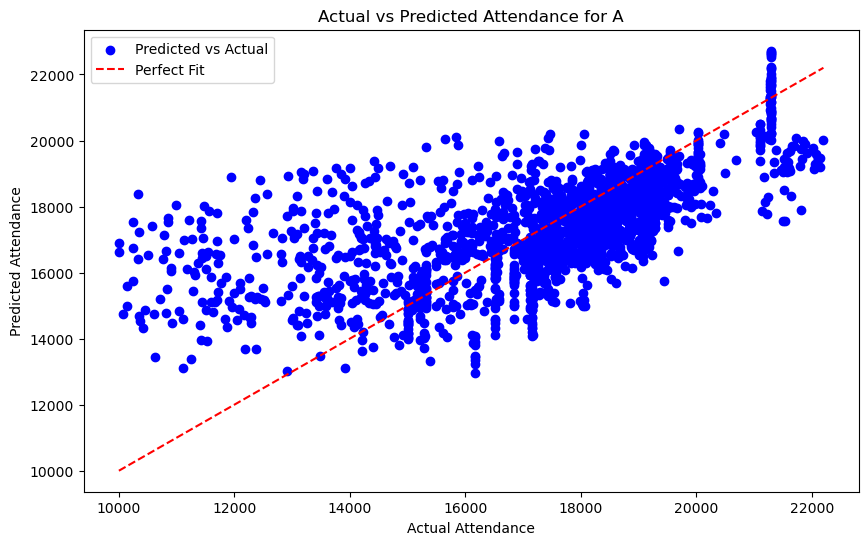

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.388
Method:                 Least Squares   F-statistic:                     142.1
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:31   Log-Likelihood:                 6595.6
No. Observations:                8673   AIC:                        -1.311e+04
Df Residuals:                    8633   BIC:                        -1.283e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

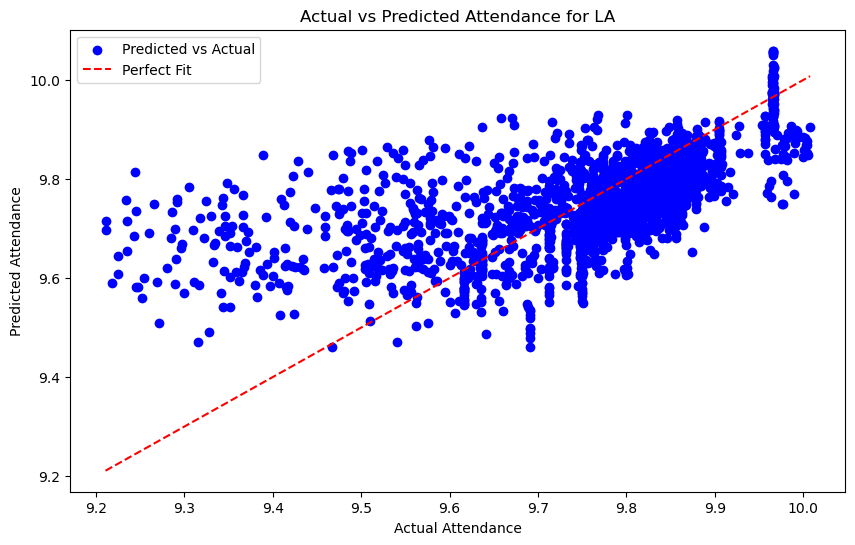

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.180
Model:                            OLS   Adj. R-squared:                  0.176
Method:                 Least Squares   F-statistic:                     48.52
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:31   Log-Likelihood:                 8109.5
No. Observations:                8673   AIC:                        -1.614e+04
Df Residuals:                    8633   BIC:                        -1.586e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

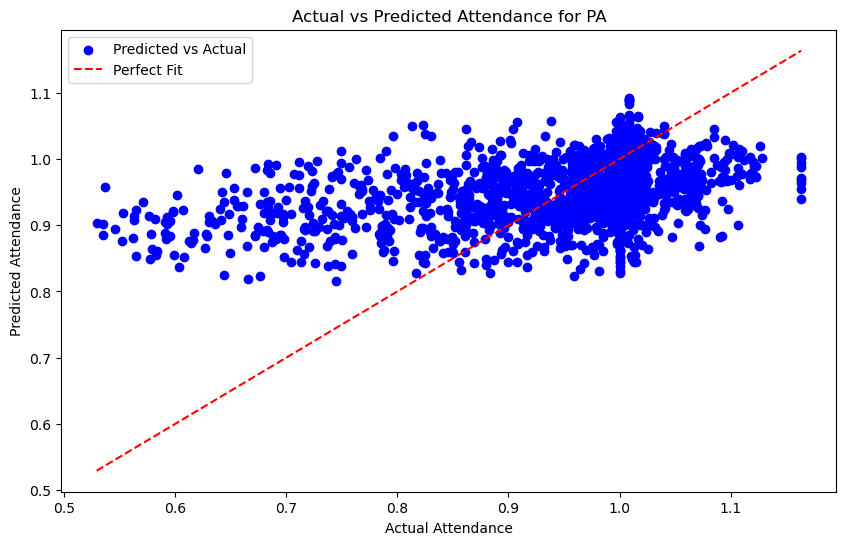

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.174
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     46.48
Date:                Tue, 11 Mar 2025   Prob (F-statistic):          2.65e-321
Time:                        19:50:31   Log-Likelihood:                 6595.6
No. Observations:                8673   AIC:                        -1.311e+04
Df Residuals:                    8633   BIC:                        -1.283e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

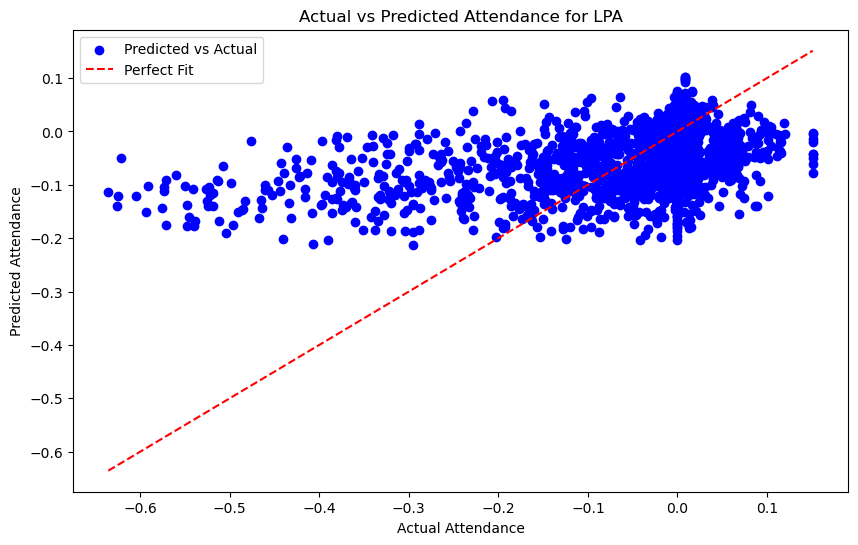

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.174
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     46.58
Date:                Tue, 11 Mar 2025   Prob (F-statistic):          6.27e-322
Time:                        19:50:32   Log-Likelihood:                 26397.
No. Observations:                8673   AIC:                        -5.271e+04
Df Residuals:                    8633   BIC:                        -5.243e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

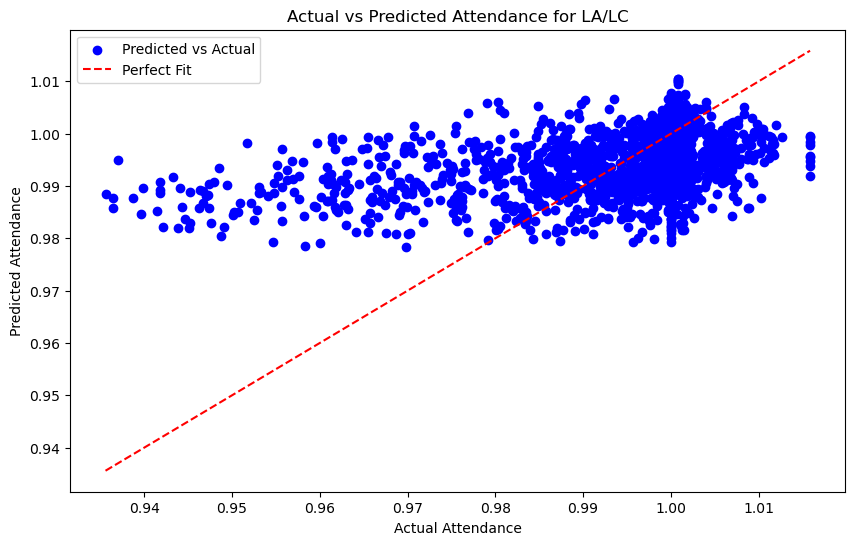

In [34]:
# run a linear regression
# define features (X) and target (y) with all columns except 'A' (attendance)

for dep in dependent_vars:
    X = df_att_feat.drop(columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att_feat[dep]

    # split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)

    # fit the OLS model on the training data
    model = sm.OLS(y_train, sm.add_constant(X_train)).fit()  # Add constant for intercept

    # print model summary
    print('-' * 60)
    print(model.summary())

    y_pred = model.predict(sm.add_constant(X_test))

    # Calculate MSE for test set
    mse_test = mean_squared_error(y_test, y_pred)
    print(f'\nMean Squared Error (MSE) for Test Set: {mse_test}\n')
    
    # variables with p < 0.05
    significant_vars = model.pvalues[model.pvalues < 0.05].index.tolist()
    print(f"Variables with p-value < 0.05:\n{significant_vars}\n")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.473
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     113.7
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:47   Log-Likelihood:                -76653.
No. Observations:                8673   AIC:                         1.534e+05
Df Residuals:                    8604   BIC:                         1.539e+05
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

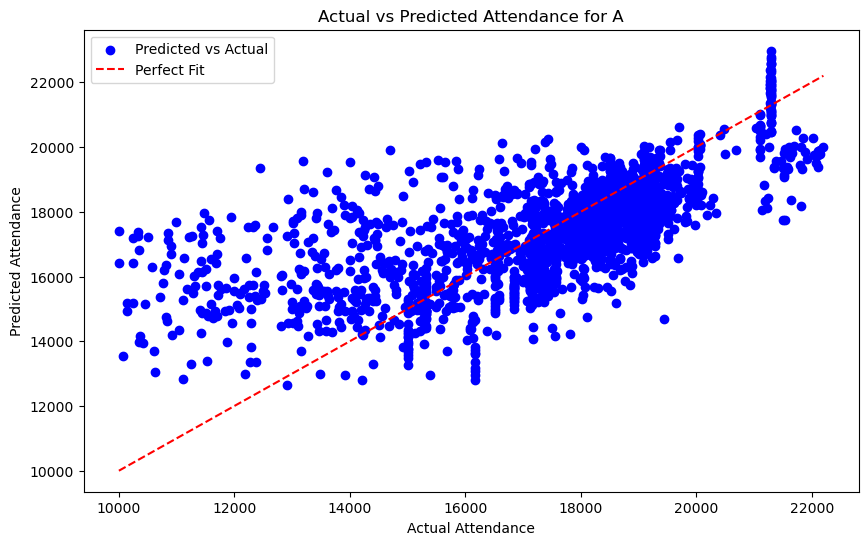

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.431
Model:                            OLS   Adj. R-squared:                  0.427
Method:                 Least Squares   F-statistic:                     95.99
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:48   Log-Likelihood:                 6893.4
No. Observations:                8673   AIC:                        -1.365e+04
Df Residuals:                    8604   BIC:                        -1.316e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

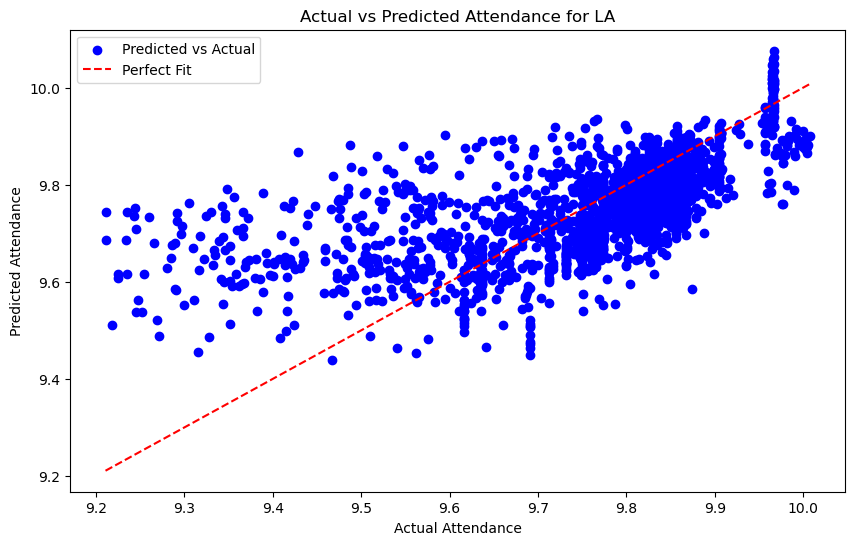

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.237
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     39.35
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:48   Log-Likelihood:                 8424.2
No. Observations:                8673   AIC:                        -1.671e+04
Df Residuals:                    8604   BIC:                        -1.622e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

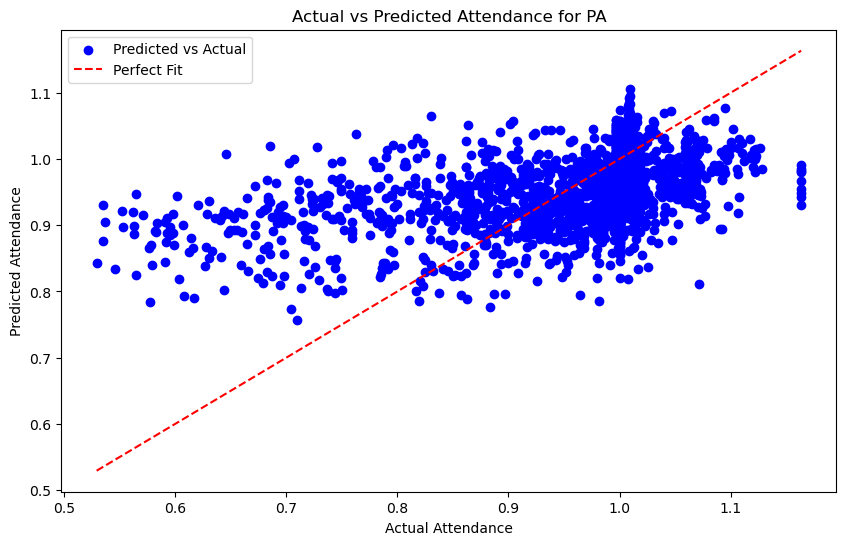

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.222
Method:                 Least Squares   F-statistic:                     37.45
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:48   Log-Likelihood:                 6893.4
No. Observations:                8673   AIC:                        -1.365e+04
Df Residuals:                    8604   BIC:                        -1.316e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

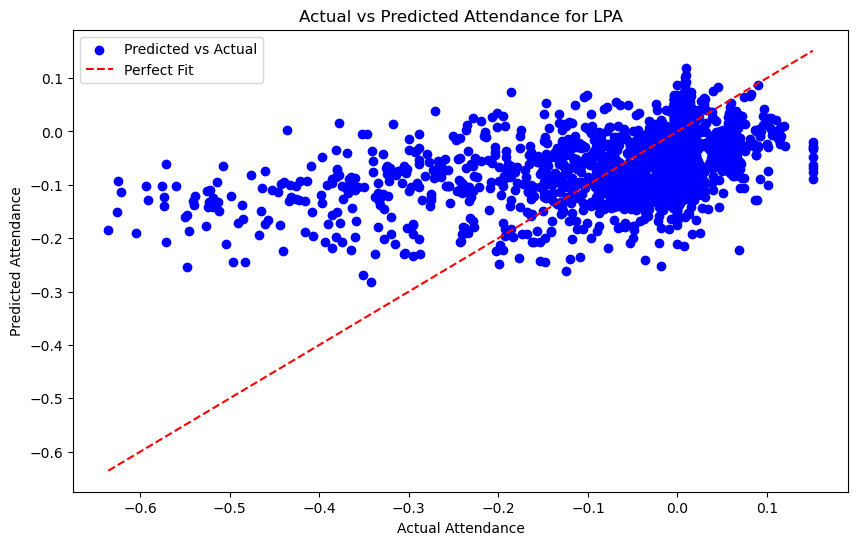

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.222
Method:                 Least Squares   F-statistic:                     37.46
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        19:50:48   Log-Likelihood:                 26694.
No. Observations:                8673   AIC:                        -5.325e+04
Df Residuals:                    8604   BIC:                        -5.276e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

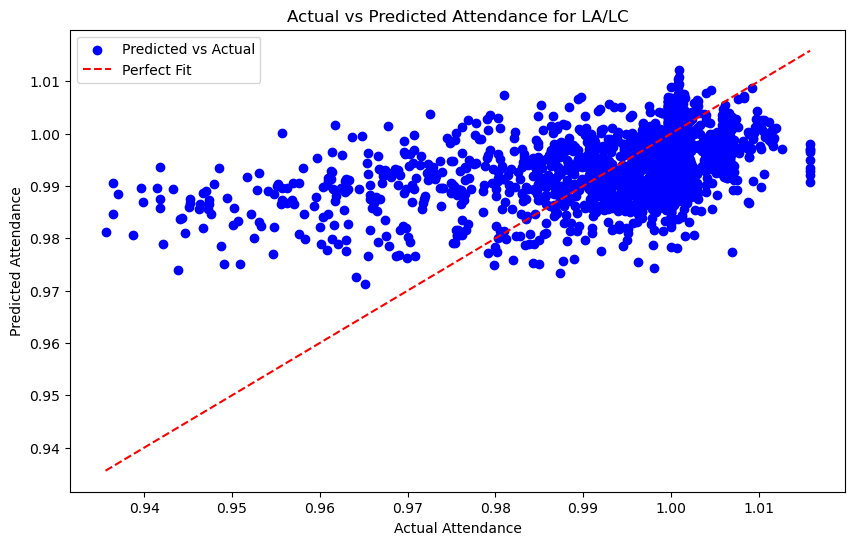

In [35]:
# run a linear regression with literally just all the variables lol
# define features (X) and target (y) with all columns except 'A' (attendance)

for dep in dependent_vars:
    X = df_att.drop(columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att[dep]

    # split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)

    # fit the OLS model on the training data
    model = sm.OLS(y_train, sm.add_constant(X_train)).fit()  # Add constant for intercept

    # print model summary
    print('-' * 60)
    print(model.summary())

    y_pred = model.predict(sm.add_constant(X_test))

    # Calculate MSE for test set
    mse_test = mean_squared_error(y_test, y_pred)
    print(f'\nMean Squared Error (MSE) for Test Set: {mse_test}\n')
    
    # variables with p < 0.05
    significant_vars = model.pvalues[model.pvalues < 0.05].index.tolist()
    print(f"Variables with p-value < 0.05:\n{significant_vars}\n")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +



LAD Regression Results for A:
R² Score: 0.2799
Mean Absolute Error (MSE): 3644422.8610



/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


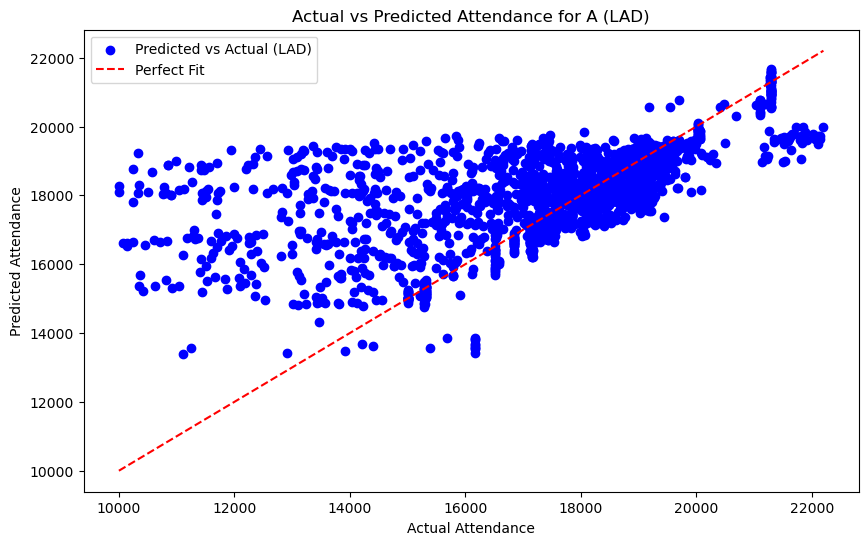


Huber Regression Results for A:
R² Score: 0.2677
Mean Absolute Error (MSE): 3706405.6448



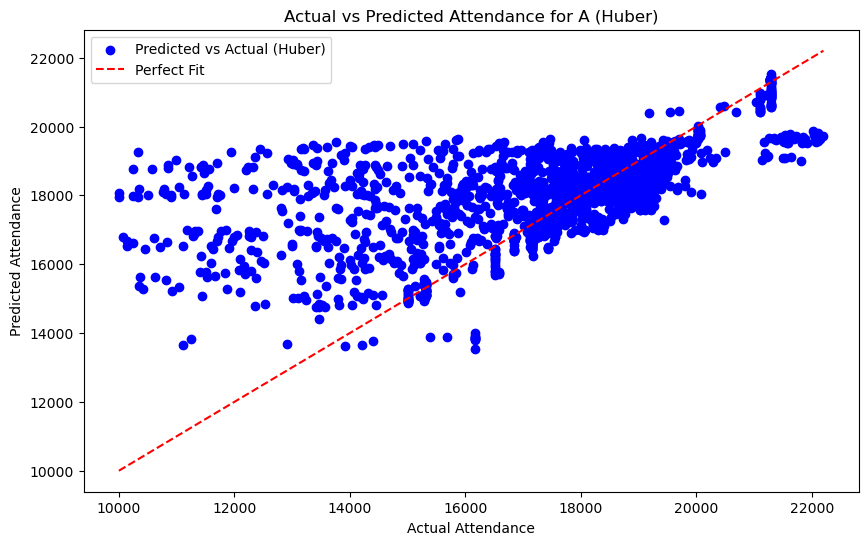

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



LAD Regression Results for LA:
R² Score: 0.2186
Mean Absolute Error (MSE): 0.0156



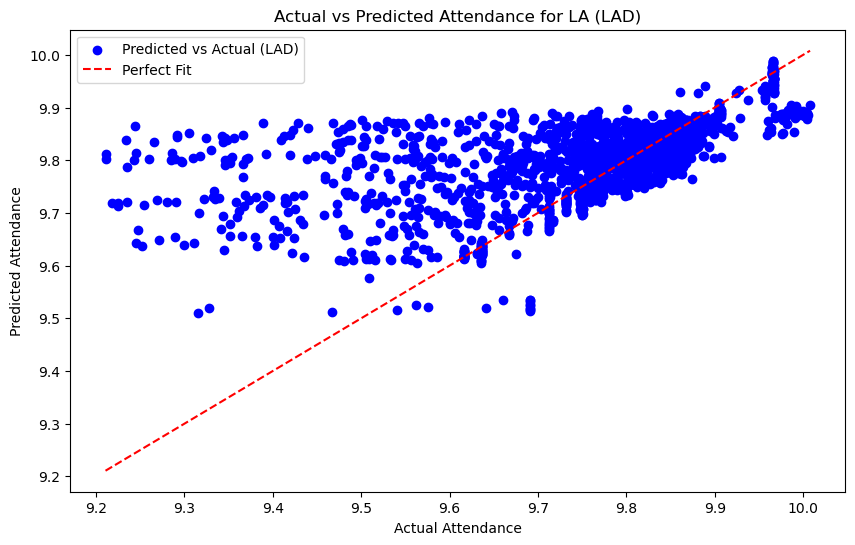


Huber Regression Results for LA:
R² Score: -3.4576
Mean Absolute Error (MSE): 0.0891



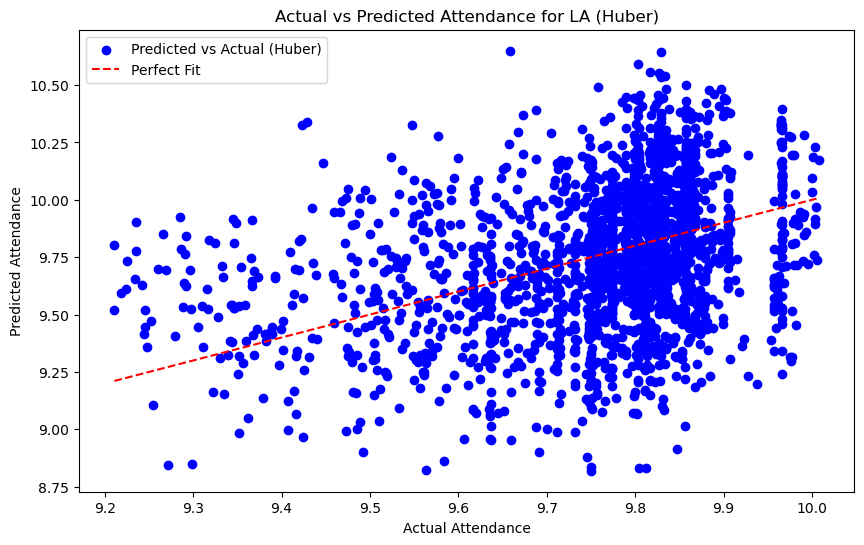


LAD Regression Results for PA:
R² Score: -0.0159
Mean Absolute Error (MSE): 0.0109



/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


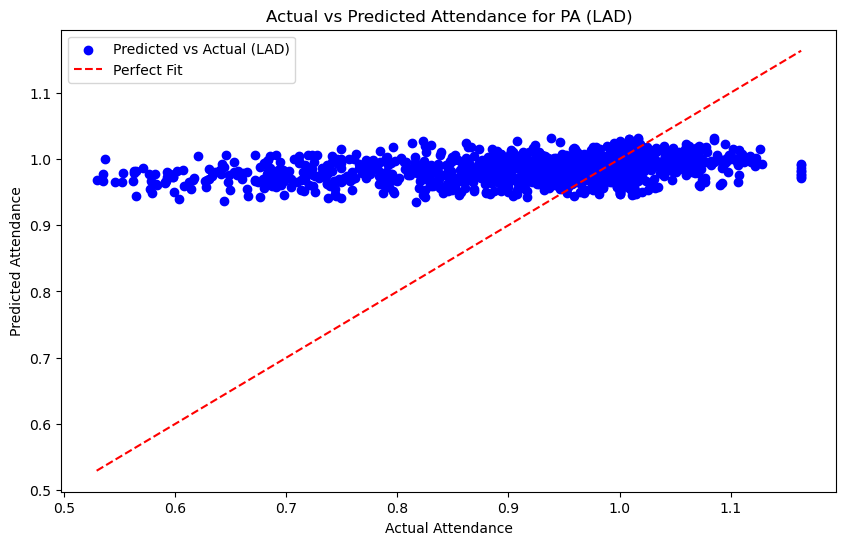


Huber Regression Results for PA:
R² Score: -1.1103
Mean Absolute Error (MSE): 0.0227



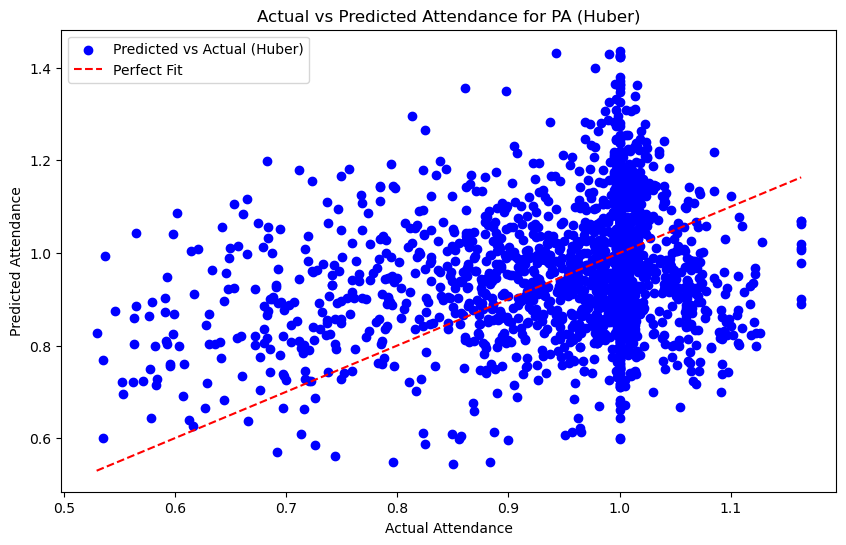


LAD Regression Results for LPA:
R² Score: -0.0358
Mean Absolute Error (MSE): 0.0156



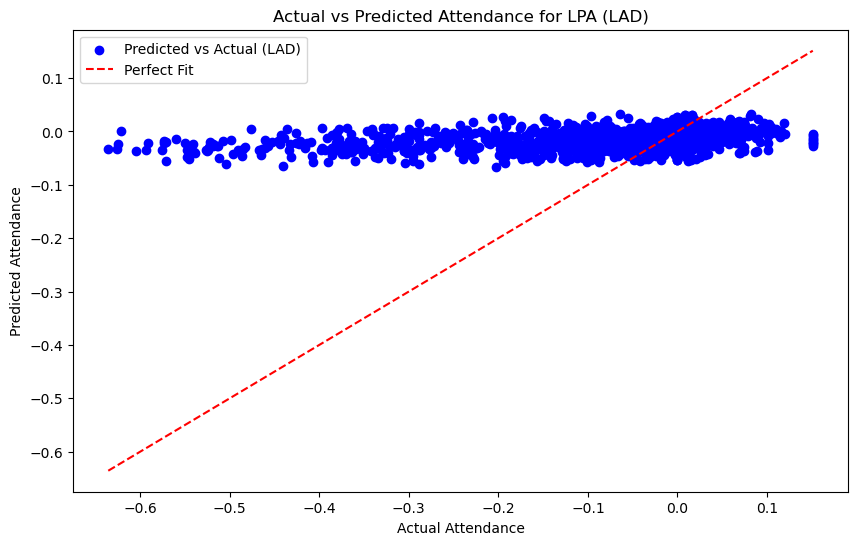


Huber Regression Results for LPA:
R² Score: -0.0069
Mean Absolute Error (MSE): 0.0152



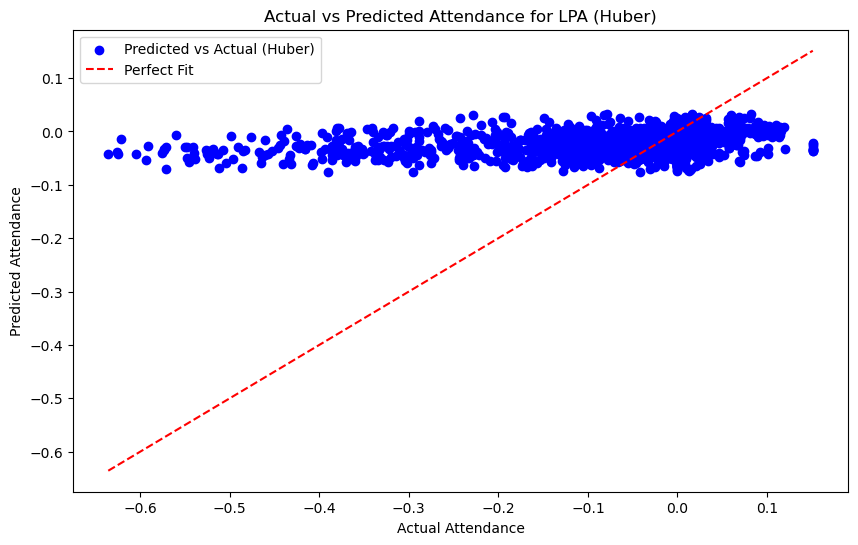


LAD Regression Results for LA/LC:
R² Score: -0.0363
Mean Absolute Error (MSE): 0.0002



/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


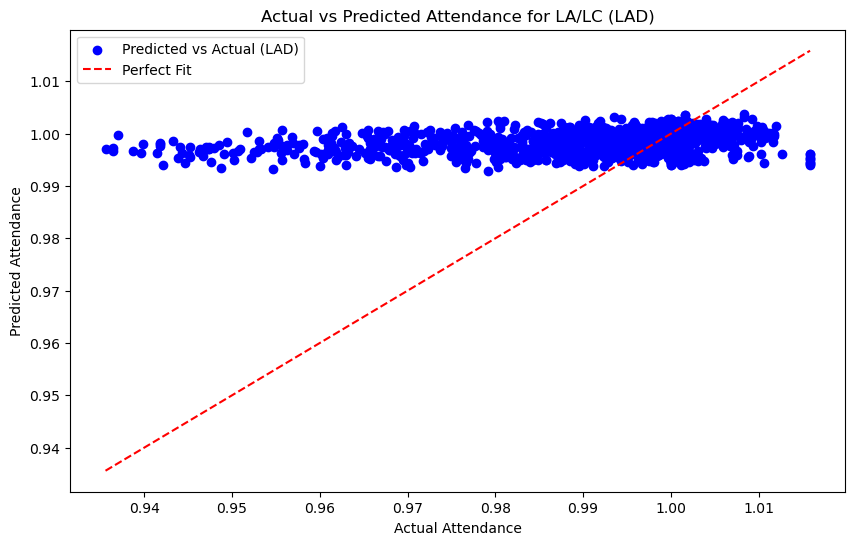


Huber Regression Results for LA/LC:
R² Score: -2.2837
Mean Absolute Error (MSE): 0.0005



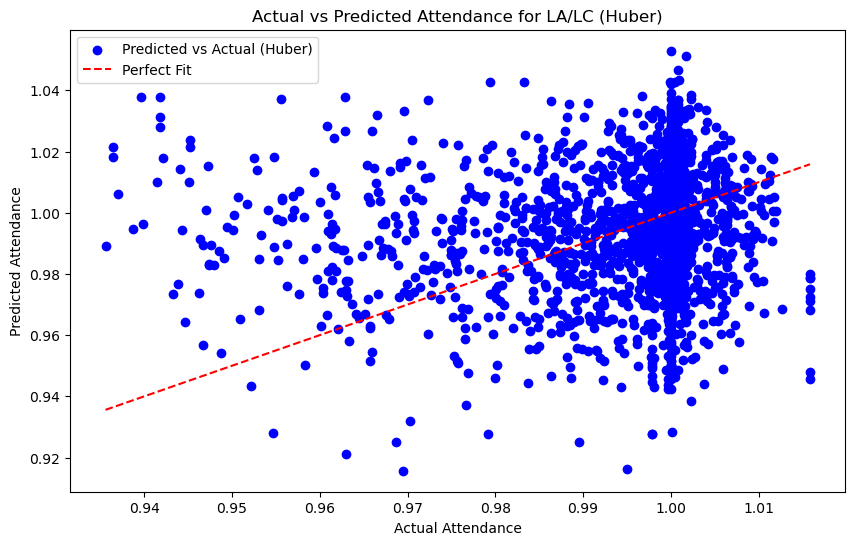

In [36]:
from sklearn.linear_model import HuberRegressor
import statsmodels.api as sm
from statsmodels.regression.quantile_regression import QuantReg

for dep in dependent_vars:
    X = df_att_feat.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att_feat[dep]
    
    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_seed)

    # LAD (Least Absolute Deviations / L1 Regression)
    lad_model = QuantReg(y_train, sm.add_constant(X_train)).fit(q=0.5)  # Median regression (L1 loss)
    
    # Huber Regression (M-estimator)
    huber_model = HuberRegressor().fit(X_train, y_train)

    # Predictions
    y_pred_lad = lad_model.predict(sm.add_constant(X_test))
    y_pred_huber = huber_model.predict(X_test)

    # Evaluate models using R² and MAE
    for name, y_pred in zip(["LAD", "Huber"], [y_pred_lad, y_pred_huber]):
        r2 = r2_score(y_test, y_pred)
        mae = mean_squared_error(y_test, y_pred)
        print(f"\n{name} Regression Results for {dep}:")
        print(f"R² Score: {r2:.4f}")
        print(f"Mean Absolute Error (MSE): {mae:.4f}\n")

        # Scatter plot of Actual vs Predicted
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred, color='blue', label=f'Predicted vs Actual ({name})')
        plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
        plt.xlabel('Actual Attendance')
        plt.ylabel('Predicted Attendance')
        plt.title(f'Actual vs Predicted Attendance for {dep} ({name})')
        plt.legend()
        plt.show()

In [37]:
# # calculate normalized attendance MSE --> so convert everything back to raw attendance numbers
def calc_mse_att(dep, X_train, X_test, y_train, y_test, y_train_pred, y_test_pred):
    if dep == 'A':
        y_train_pred_att = y_train_pred
        y_test_pred_att = y_test_pred

        y_train_att = y_train
        y_test_att = y_test
    
    elif dep == 'LA':
        y_train_pred_att = np.exp(y_train_pred)
        y_test_pred_att = np.exp(y_test_pred)

        y_train_att = np.exp(y_train)
        y_test_att = np.exp(y_test)

    elif dep == 'PA':
        # average capacity
        cap_train = X_train['CAP'].mean()
        cap_test = X_test['CAP'].mean()
        
        y_train_pred_att = y_train_pred * cap_train
        y_test_pred_att = y_test_pred * cap_test

        y_train_att = y_train * cap_train
        y_test_att = y_test * cap_test

    elif dep == 'LPA':
        # average capacity
        cap_train = X_train['CAP'].mean()
        cap_test = X_test['CAP'].mean()
        
        y_train_pred_att = np.exp(y_train_pred) * cap_train
        y_test_pred_att = np.exp(y_test_pred) * cap_test

        y_train_att = np.exp(y_train) * cap_train
        y_test_att = np.exp(y_test) * cap_test

    elif dep == 'LA/LC':
        # average log capacity
        lcap_train = X_train['LCAP'].mean()
        lcap_test = X_test['LCAP'].mean()
    
        y_train_pred_att = np.exp(y_train_pred * lcap_train)
        y_test_pred_att = np.exp(y_test_pred * lcap_test)

        y_train_att = np.exp(y_train * lcap_train)
        y_test_att = np.exp(y_test * lcap_test)
        
    # Calculate Mean Squared Error (MSE)
    train_mse_att = mean_squared_error(y_train_att, y_train_pred_att)
    test_mse_att = mean_squared_error(y_test_att, y_test_pred_att)

    print(f"Train MSE Attendance: {train_mse_att}")
    print(f"Test MSE Attendance: {test_mse_att}\n")

Train MSE: 2999647.7722896826
Test MSE: 3059778.4435943807

Train MSE Attendance: 2999647.7722896826
Test MSE Attendance: 3059778.4435943807

Train R²: 0.4320
Test R²: 0.3954

Significant Features and Coefficients:

Feature  Coefficient
     HW   426.114326
     HL    44.896209
   HSOW    43.483064
   HSOL    13.231313
   HSOS   -97.262904
   HPP%   108.914243
   HPK%   -36.240200
    HSH   -36.151457
   HSHA    91.975025
 HPIM/G   108.343584
HoPIM/G   -24.398001
    HS%   195.788505
   HSV%   179.312040
    HSO   158.036371
   HCAN   120.615568
     VW  -140.029952
     VL  -196.790353
   VSOW     0.365308
   VSOL   -18.940311
   VSOS    14.846608
   VPP%    10.193717
   VPK%   -16.306428
    VSH    18.952388
   VSHA    -3.828446
 VPIM/G    17.030425
VoPIM/G    79.901415
    VS%    -0.058510
   VSV%    31.684985
    VSO     5.086779
   VCAN   -11.922860
   TDAY   -80.883133
   WDAY    27.500293
  ThDAY     0.670372
   FDAY    83.444641
   SDAY   215.868119
  SuDAY    91.075295
    DIV

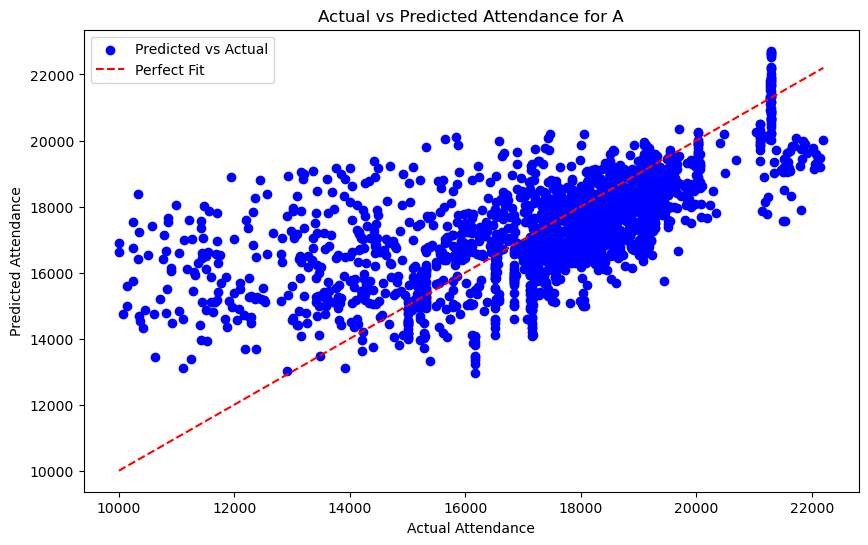

Train MSE: 0.012809264462958854
Test MSE: 0.012942214892061087

Train MSE Attendance: 3055733.937048706
Test MSE Attendance: 3125856.417760785

Train R²: 0.3902
Test R²: 0.3527

Significant Features and Coefficients:

Feature  Coefficient
     HW     0.023016
     HL    -0.001289
   HSOW     0.002328
   HSOL     0.000029
   HSOS    -0.007041
   HPP%     0.007322
   HPK%    -0.004343
    HSH    -0.001438
   HSHA     0.004414
 HPIM/G     0.007864
    HS%     0.011438
   HSV%     0.009776
    HSO     0.010625
   HCAN     0.010413
     VW    -0.004611
     VL    -0.008702
   VSOL    -0.000091
   VSOS     0.000801
   VPP%     0.000916
   VPK%    -0.000550
    VSH     0.001289
   VSHA     0.000094
 VPIM/G     0.001707
VoPIM/G     0.003669
    VS%     0.000029
   VSV%     0.001527
    VSO     0.000035
   VCAN    -0.000997
   TDAY    -0.005555
   WDAY     0.001459
  ThDAY    -0.000353
   FDAY     0.005132
   SDAY     0.013495
  SuDAY     0.005178
    DIV     0.005582
    CAP     0.093702
   LC

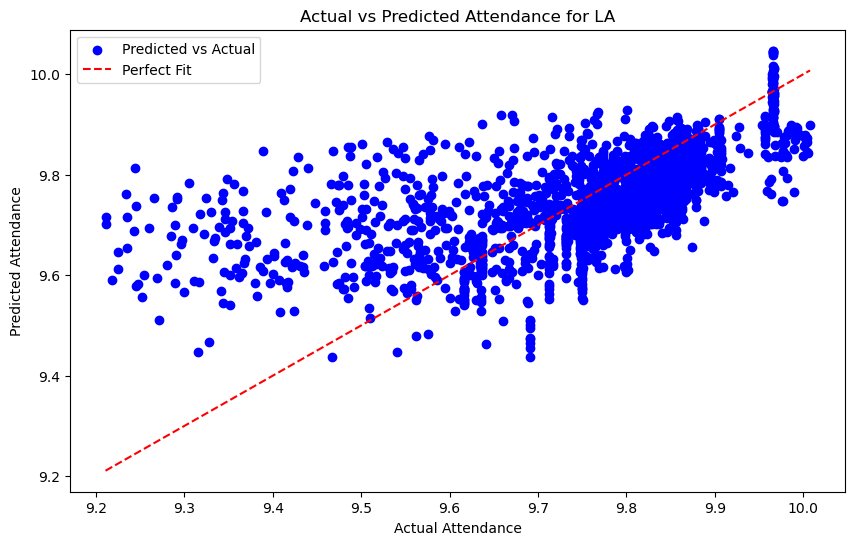

Train MSE: 0.009038648508059442
Test MSE: 0.009180032412717625

Train MSE Attendance: 3012860.2676788834
Test MSE Attendance: 3055512.84426712

Train R²: 0.1784
Test R²: 0.1469

Significant Features and Coefficients:

Feature  Coefficient
     HW     0.020199
     HL    -0.001658
   HSOW     0.003005
   HSOS    -0.006131
   HPP%     0.005508
   HPK%    -0.002659
    HSH    -0.001415
   HSHA     0.003600
 HPIM/G     0.005567
HoPIM/G     0.000283
    HS%     0.009660
   HSV%     0.007818
    HSO     0.008361
   HCAN     0.007964
     VW    -0.003671
     VL    -0.007070
   VSOL    -0.000188
   VSOS     0.000687
   VPP%     0.000648
   VPK%    -0.000486
    VSH     0.001083
   VSHA     0.000008
 VPIM/G     0.001107
VoPIM/G     0.003727
   VSV%     0.001636
    VSO     0.000033
   VCAN    -0.000901
   TDAY    -0.004355
   WDAY     0.001168
   FDAY     0.004365
   SDAY     0.011876
  SuDAY     0.004807
    DIV     0.004979
    CAP     0.088046
   LCAP    -0.082657


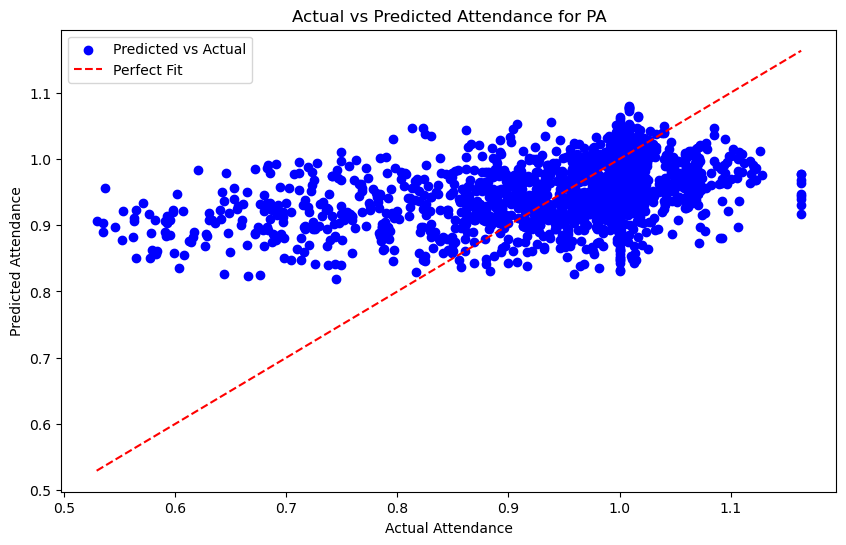

Train MSE: 0.012809220739707926
Test MSE: 0.012942153087920261

Train MSE Attendance: 3049509.9367492464
Test MSE Attendance: 3110868.10123712

Train R²: 0.1725
Test R²: 0.1422

Significant Features and Coefficients:

Feature  Coefficient
     HW     0.023017
     HL    -0.001287
   HSOW     0.002327
   HSOL     0.000029
   HSOS    -0.007041
   HPP%     0.007323
   HPK%    -0.004342
    HSH    -0.001438
   HSHA     0.004414
 HPIM/G     0.007864
    HS%     0.011439
   HSV%     0.009777
    HSO     0.010625
   HCAN     0.010410
     VW    -0.004612
     VL    -0.008703
   VSOL    -0.000091
   VSOS     0.000801
   VPP%     0.000916
   VPK%    -0.000550
    VSH     0.001289
   VSHA     0.000094
 VPIM/G     0.001706
VoPIM/G     0.003669
    VS%     0.000029
   VSV%     0.001527
    VSO     0.000036
   VCAN    -0.000996
   TDAY    -0.005556
   WDAY     0.001459
  ThDAY    -0.000353
   FDAY     0.005132
   SDAY     0.013495
  SuDAY     0.005178
    DIV     0.005582
    CAP     0.093812
   LC

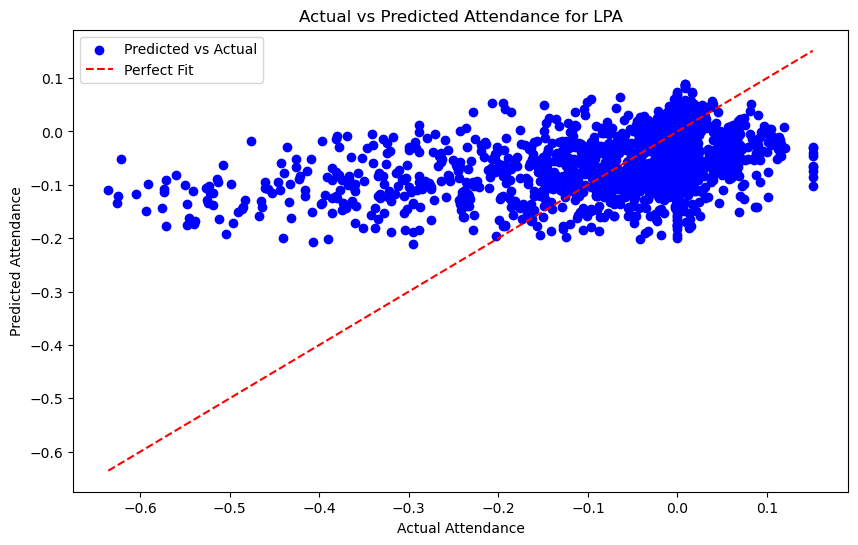

Train MSE: 0.0001340914991194358
Test MSE: 0.00013502932342754063

Train MSE Attendance: 3054454.77526704
Test MSE Attendance: 3105467.319974984

Train R²: 0.1671
Test R²: 0.1387

Significant Features and Coefficients:

Feature  Coefficient
     HW     0.001929
     HL    -0.000397
   HSOW     0.000212
   HSOS    -0.000707
   HPP%     0.000620
   HPK%    -0.000246
    HSH    -0.000001
   HSHA     0.000238
 HPIM/G     0.000696
HoPIM/G     0.000133
    HS%     0.001150
   HSV%     0.000807
    HSO     0.000961
   HCAN     0.001129
     VL    -0.000428
    VSH     0.000010
 VPIM/G     0.000092
VoPIM/G     0.000332
   VSV%     0.000070
   VCAN    -0.000013
   TDAY    -0.000619
  ThDAY    -0.000112
   FDAY     0.000309
   SDAY     0.001166
  SuDAY     0.000332
    DIV     0.000495
    CAP     0.000526


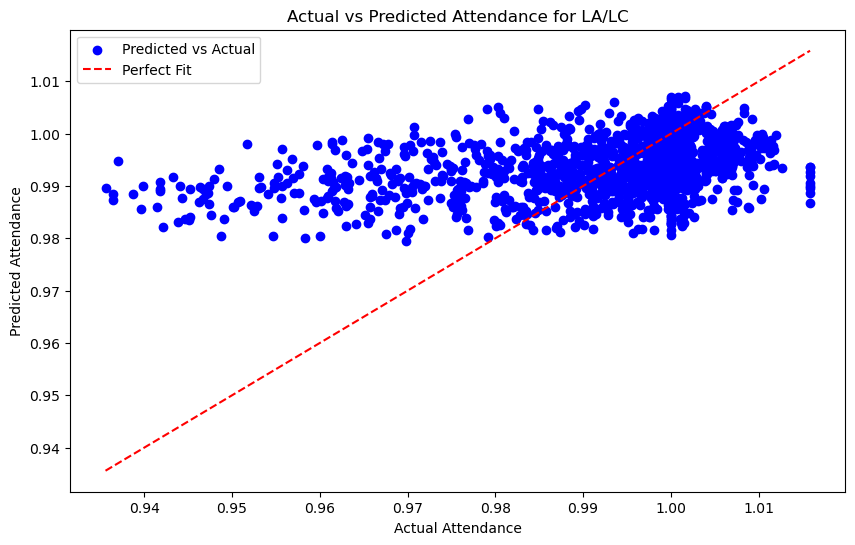

In [38]:
# Initialize the Lasso model with alpha (regularization strength)
lasso = Lasso(alpha = 0.0001, max_iter = 100000)


for dep in dependent_vars:
    X = df_att_feat.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att_feat[dep]

    # Standardize the data (important for regularization methods like Lasso)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.2, random_state = rand_seed)
    X_train_unscaled, X_test_unscaled, _, _ = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)

    # Fit the Lasso model
    lasso.fit(X_train, y_train)

    # Create a summary DataFrame
    summary_df = pd.DataFrame({
        'Feature': X.columns,
        'Coefficient': lasso.coef_
    })
    
    # Filter only non-zero coefficients (i.e., selected features)
    summary_df = summary_df[summary_df['Coefficient'] != 0]

    # Get predictions
    y_train_pred = lasso.predict(X_train)
    y_test_pred = lasso.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)

    # Get the coefficients and variables with non-zero coefficients
    significant_vars = [feature for feature, coef in zip(X.columns, lasso.coef_) if coef != 0]

    print(f"Train MSE: {train_mse}")
    print(f"Test MSE: {test_mse}\n")
    
    calc_mse_att(dep, X_train_unscaled, X_test_unscaled, y_train, y_test, y_train_pred, y_test_pred)

    # Calculate R-squared
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    print(f"Train R²: {train_r2:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    print("\nSignificant Features and Coefficients:\n")
    print(summary_df.to_string(index=False))

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

Train MSE: 2999846.9762637326
Test MSE: 3060701.377599924

Train MSE Attendance: 2999846.9762637326
Test MSE Attendance: 3060701.377599924

Train R²: 0.4319
Test R²: 0.3953


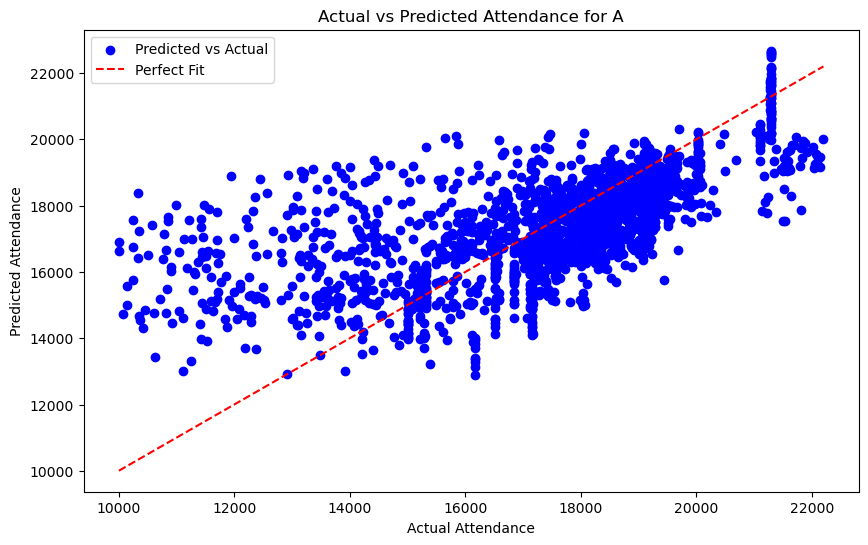

Train MSE: 0.012793786205001571
Test MSE: 0.012915178318563656

Train MSE Attendance: 3052622.728328826
Test MSE Attendance: 3120281.6611072775

Train R²: 0.3909
Test R²: 0.3540


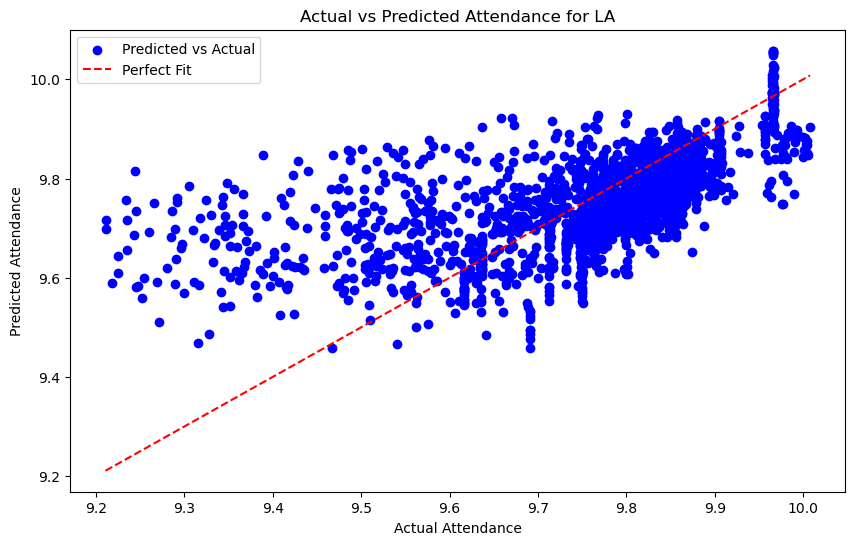

Train MSE: 0.009023756968362537
Test MSE: 0.009155841273908966

Train MSE Attendance: 3007896.458295505
Test MSE Attendance: 3047460.984314545

Train R²: 0.1798
Test R²: 0.1492


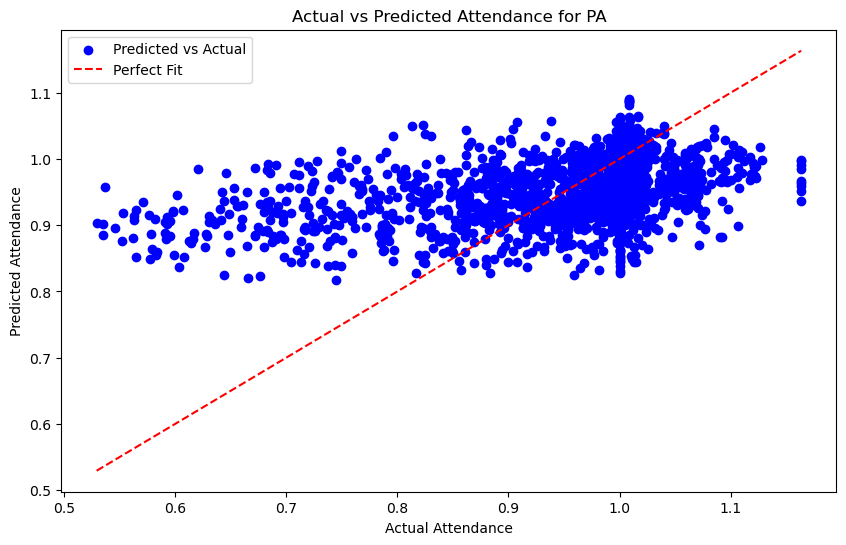

Train MSE: 0.012793944516266545
Test MSE: 0.012915832892876341

Train MSE Attendance: 3046300.4128262247
Test MSE Attendance: 3104299.804186691

Train R²: 0.1735
Test R²: 0.1439


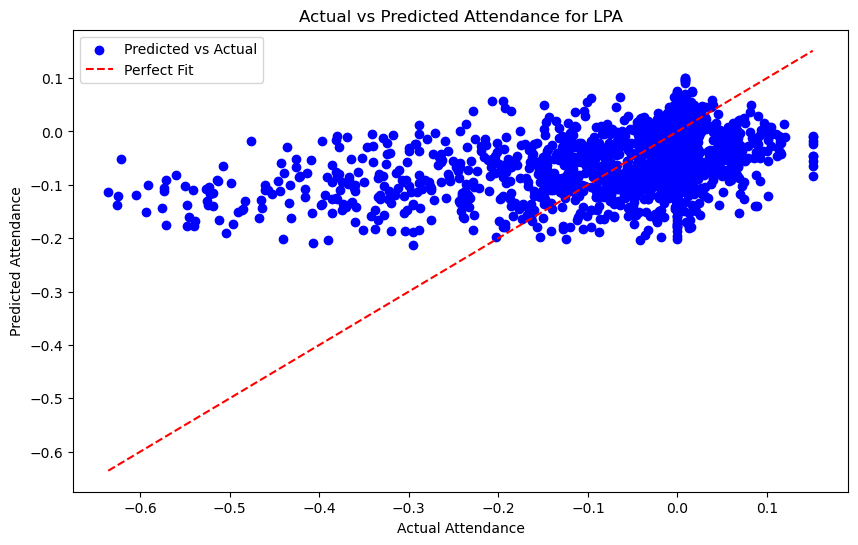

Train MSE: 0.0001330146777177268
Test MSE: 0.0001341853866631209

Train MSE Attendance: 3035958.8953181785
Test MSE Attendance: 3092078.290771228

Train R²: 0.1738
Test R²: 0.1441


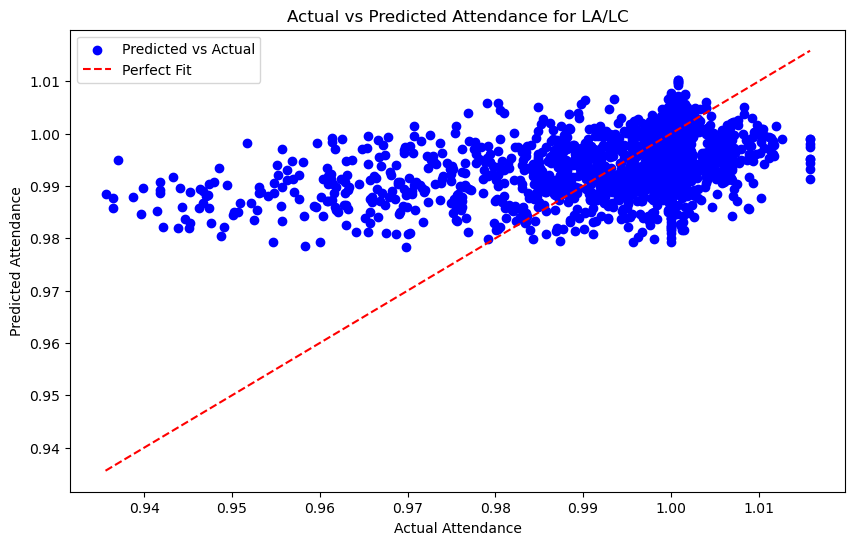

In [39]:
# Initialize the Ridge model with alpha (regularization strength)
ridge = Ridge(alpha = 1.0)

for dep in dependent_vars:
    X = df_att_feat.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att_feat[dep]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state = rand_seed)
    X_train_unscaled, X_test_unscaled, _, _ = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)

    # Fit the Ridge model
    ridge.fit(X_train, y_train)

    # get predictions
    y_train_pred = ridge.predict(X_train)
    y_test_pred = ridge.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)

    print(f"Train MSE: {train_mse}")
    print(f"Test MSE: {test_mse}\n")

    calc_mse_att(dep, X_train_unscaled, X_test_unscaled, y_train, y_test, y_train_pred, y_test_pred)

    # Calculate R-squared
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    print(f"Train R²: {train_r2:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

ElasticNet regression - Variables with non-zero coefficients for A: ['HW', 'HL', 'HSOW', 'HSOL', 'HSOS', 'HPP%', 'HPK%', 'HSH', 'HSHA', 'HPIM/G', 'HoPIM/G', 'HS%', 'HSV%', 'HSO', 'HCAN', 'VW', 'VL', 'VSOW', 'VSOL', 'VSOS', 'VPP%', 'VPK%', 'VSH', 'VSHA', 'VPIM/G', 'VoPIM/G', 'VS%', 'VSV%', 'VSO', 'VCAN', 'TDAY', 'WDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY', 'DIV', 'CAP', 'LCAP']

Train MSE: 3000187.1876912
Test MSE: 3061511.820980842

Train MSE Attendance: 3000187.1876912
Test MSE Attendance: 3061511.820980842

Train R²: 0.4319
Test R²: 0.3951


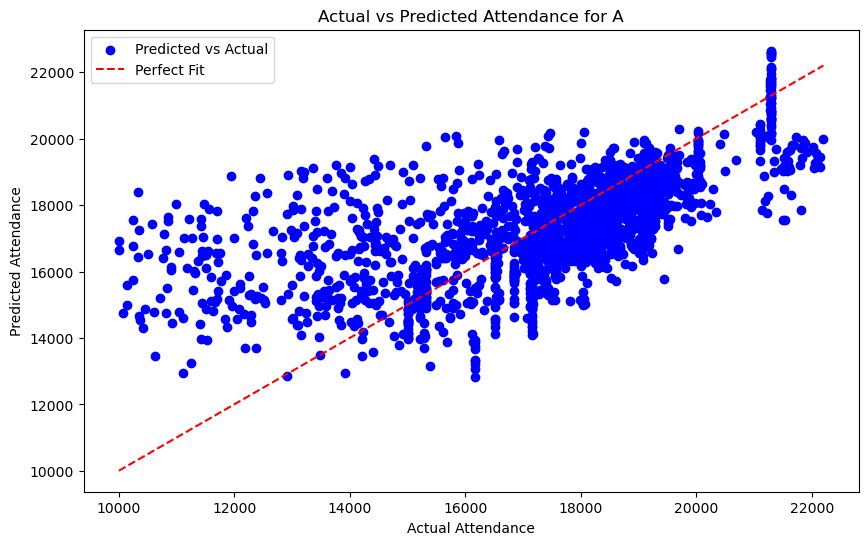

ElasticNet regression - Variables with non-zero coefficients for LA: ['HW', 'HL', 'HSOW', 'HSOS', 'HPP%', 'HPK%', 'HSH', 'HSHA', 'HPIM/G', 'HoPIM/G', 'HS%', 'HSV%', 'HSO', 'HCAN', 'VL', 'VSH', 'VPIM/G', 'VoPIM/G', 'VSV%', 'VCAN', 'TDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY', 'DIV', 'CAP']

Train MSE: 0.012842399247393055
Test MSE: 0.012938118702524423

Train MSE Attendance: 3056677.094234087
Test MSE Attendance: 3117649.2190947826

Train R²: 0.3886
Test R²: 0.3529


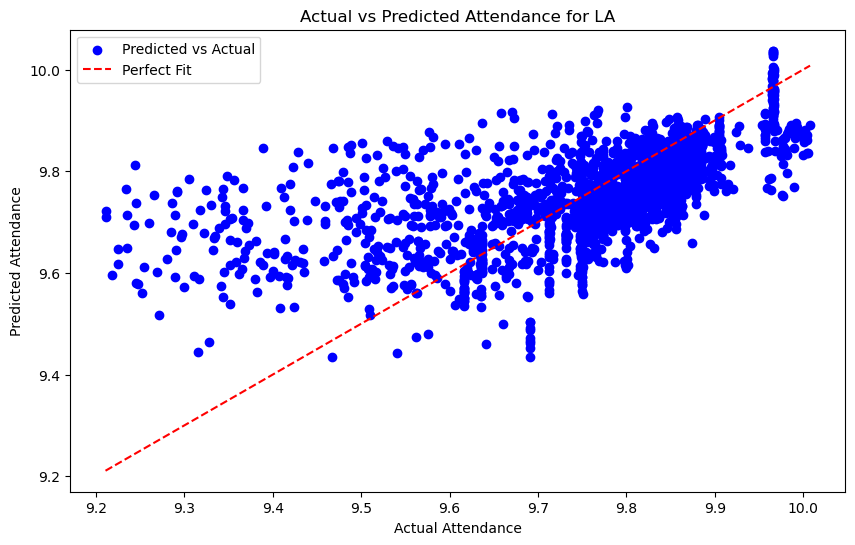

ElasticNet regression - Variables with non-zero coefficients for PA: ['HW', 'HL', 'HSOW', 'HSOS', 'HPP%', 'HPK%', 'HSH', 'HSHA', 'HPIM/G', 'HoPIM/G', 'HS%', 'HSV%', 'HSO', 'HCAN', 'VL', 'VSH', 'VPIM/G', 'VoPIM/G', 'VSV%', 'VCAN', 'TDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY', 'DIV', 'CAP']

Train MSE: 0.009112070429576496
Test MSE: 0.00923636447195421

Train MSE Attendance: 3037334.0581928217
Test MSE Attendance: 3074262.5962073146

Train R²: 0.1717
Test R²: 0.1417


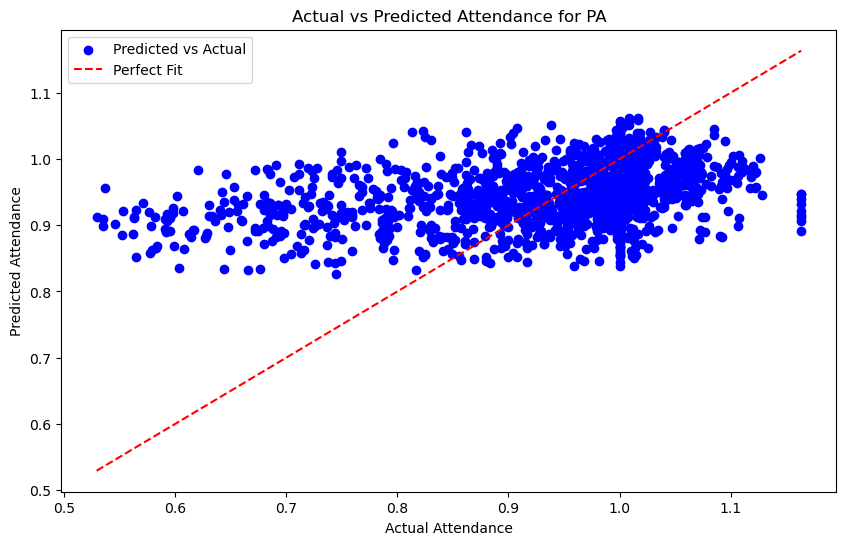

ElasticNet regression - Variables with non-zero coefficients for LPA: ['HW', 'HL', 'HSOW', 'HSOS', 'HPP%', 'HPK%', 'HSH', 'HSHA', 'HPIM/G', 'HoPIM/G', 'HS%', 'HSV%', 'HSO', 'HCAN', 'VL', 'VSH', 'VPIM/G', 'VoPIM/G', 'VSV%', 'VCAN', 'TDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY', 'DIV', 'CAP']

Train MSE: 0.012889872271836194
Test MSE: 0.012996901063132444

Train MSE Attendance: 3064599.752634099
Test MSE Attendance: 3119546.369645622

Train R²: 0.1673
Test R²: 0.1386


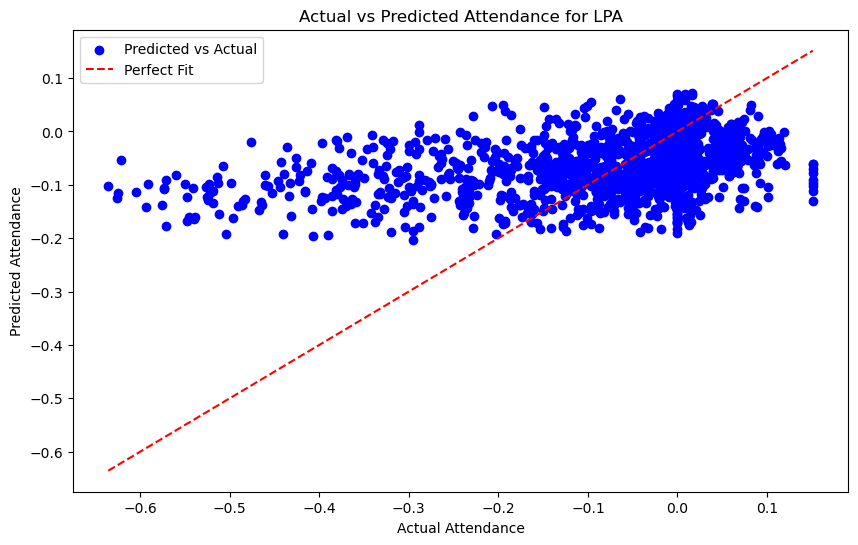

ElasticNet regression - Variables with non-zero coefficients for LA/LC: ['HW', 'HL', 'HSOS', 'HPP%', 'HoPIM/G', 'HS%', 'HSV%', 'HSO', 'HCAN', 'TDAY', 'SDAY']

Train MSE: 0.00013963351979012263
Test MSE: 0.00013769111773998956

Train MSE Attendance: 3152828.956611764
Test MSE Attendance: 3130016.543108345

Train R²: 0.1327
Test R²: 0.1217


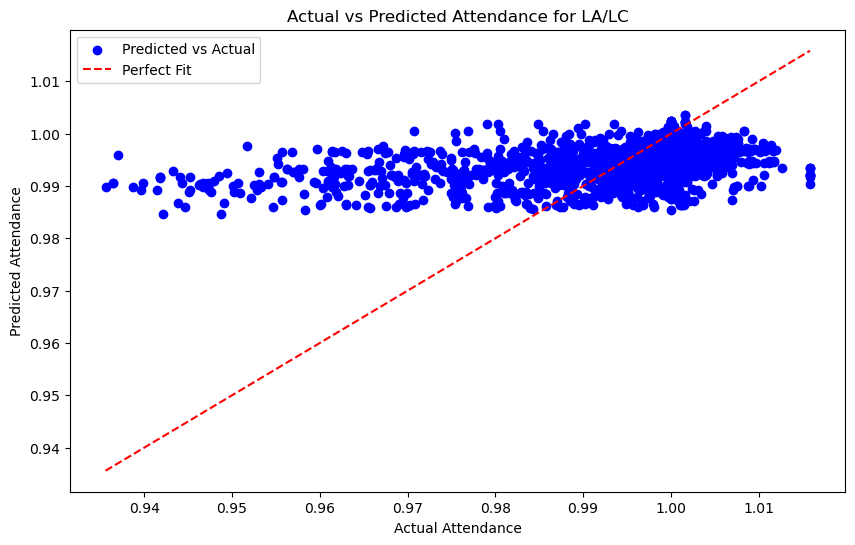

In [40]:
# Initialize the ElasticNet model with alpha (regularization strength) and l1_ratio (balance between Lasso and Ridge)
elastic_net = ElasticNet(alpha = 0.001, l1_ratio = 0.8, max_iter = 200000)

for dep in dependent_vars:
    X = df_att_feat.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att_feat[dep]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state = rand_seed)
    X_train_unscaled, X_test_unscaled, _, _ = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)

    # Fit the ElasticNet model
    elastic_net.fit(X_train, y_train)

    # get predictions
    y_train_pred = elastic_net.predict(X_train)
    y_test_pred = elastic_net.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)

    # Get the coefficients and variables with non-zero coefficients
    significant_vars = [feature for feature, coef in zip(X.columns, elastic_net.coef_) if coef != 0]
    
    print(f"ElasticNet regression - Variables with non-zero coefficients for {dep}: {significant_vars}\n")
    print(f"Train MSE: {train_mse}")
    print(f"Test MSE: {test_mse}\n")

    calc_mse_att(dep, X_train_unscaled, X_test_unscaled, y_train, y_test, y_train_pred, y_test_pred)

    # Calculate R-squared
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    print(f"Train R²: {train_r2:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

PCA Regression - MSE for A:
Train MSE: 2780535.087211615
Test MSE: 2845025.6467049127
Train R²: 0.4735
Test R²: 0.4379
Number of components used in PCA: 74

Train MSE Attendance: 2780535.087211615
Test MSE Attendance: 2845025.6467049127



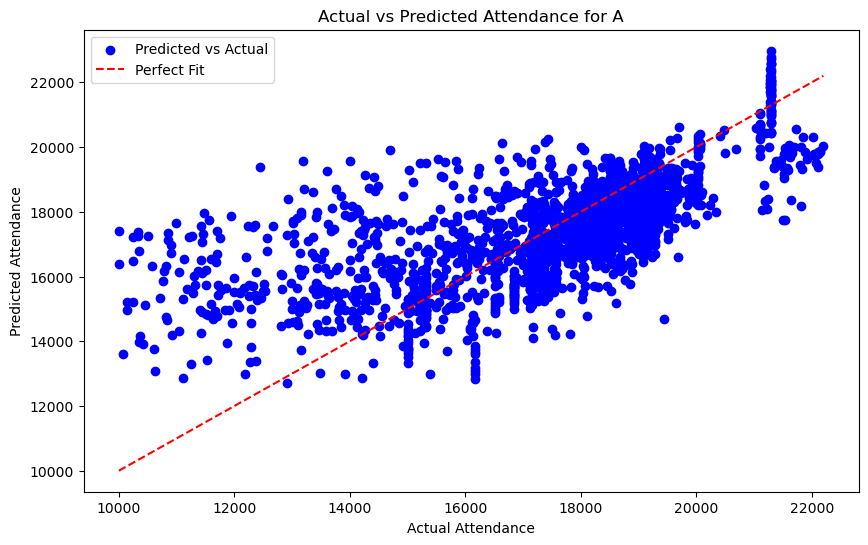

PCA Regression - MSE for LA:
Train MSE: 0.011942688202840173
Test MSE: 0.012120623904094444
Train R²: 0.4315
Test R²: 0.3938
Number of components used in PCA: 74

Train MSE Attendance: 2839479.288973699
Test MSE Attendance: 2925240.1302663055



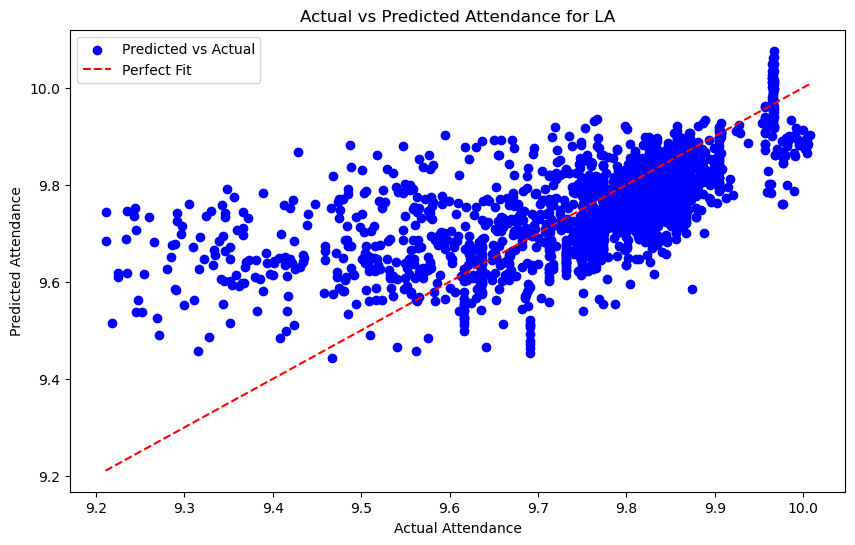

PCA Regression - MSE for PA:
Train MSE: 0.008390445311274327
Test MSE: 0.008559070535542161
Train R²: 0.2373
Test R²: 0.2046
Number of components used in PCA: 74

Train MSE Attendance: 2796794.1538970573
Test MSE Attendance: 2848829.8058846705



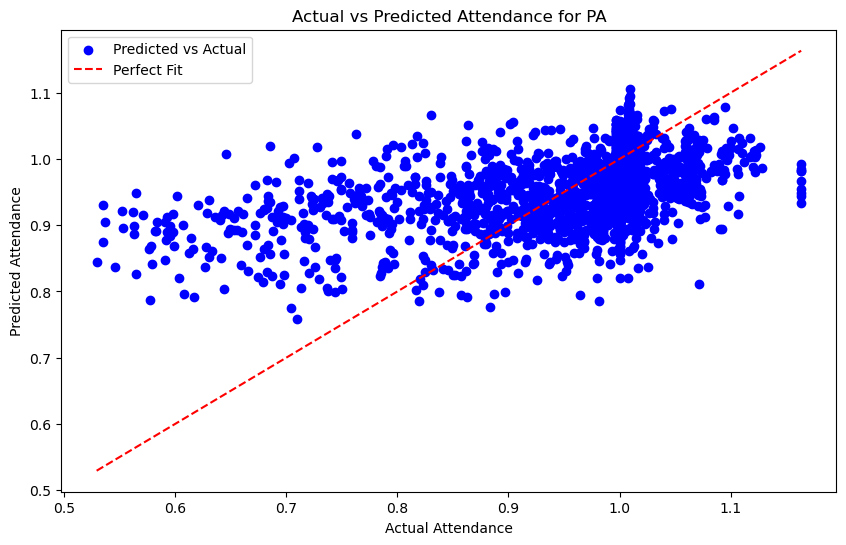

PCA Regression - MSE for LPA:
Train MSE: 0.011942688202840172
Test MSE: 0.012120623904094541
Train R²: 0.2285
Test R²: 0.1966
Number of components used in PCA: 74

Train MSE Attendance: 2838934.6447960646
Test MSE Attendance: 2913656.935869189



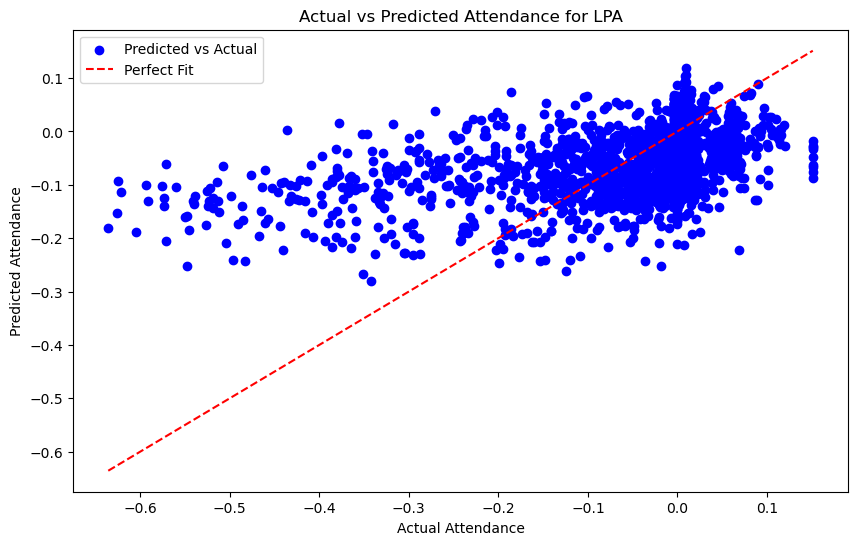

PCA Regression - MSE for LA/LC:
Train MSE: 0.00012419996988328303
Test MSE: 0.00012599248434752344
Train R²: 0.2286
Test R²: 0.1964
Number of components used in PCA: 74

Train MSE Attendance: 2830248.135674082
Test MSE Attendance: 2903976.521896939



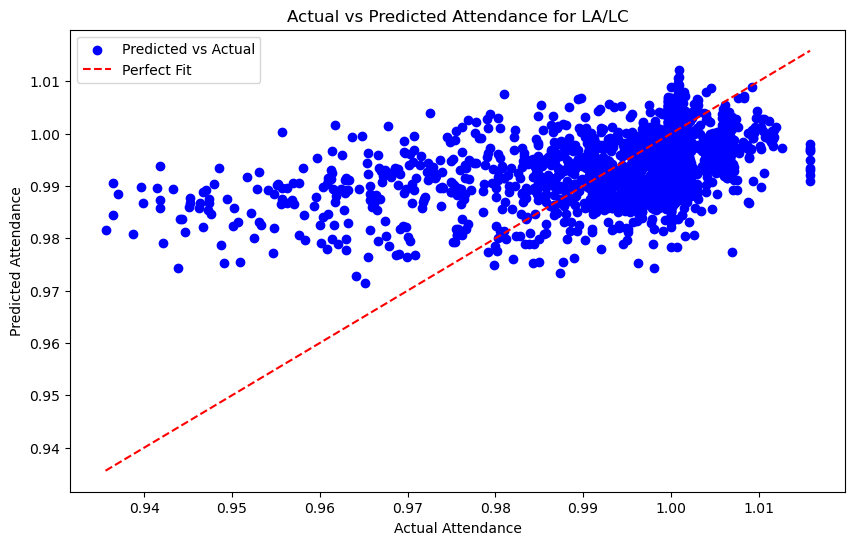

In [41]:
# Loop over dependent variables
for dep in dependent_vars:
    X = df_att.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att[dep]

    # Add constant (intercept) to the model
    X = sm.add_constant(X)

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rand_seed)
    X_train_unscaled, X_test_unscaled, _, _ = train_test_split(X, y, test_size=0.2, random_state=rand_seed)

    # Apply PCA to reduce dimensionality
    pca = PCA()
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    # Fit the linear regression model on the PCA components
    pcr_model = LinearRegression()
    pcr_model.fit(X_train_pca, y_train)

    # Get predictions
    y_train_pred = pcr_model.predict(X_train_pca)
    y_test_pred = pcr_model.predict(X_test_pca)

    # Calculate Mean Squared Error (MSE)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)

    # Print results
    print(f"PCA Regression - MSE for {dep}:")
    print(f"Train MSE: {train_mse}")
    print(f"Test MSE: {test_mse}")

    # Calculate R-squared
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    print(f"Train R²: {train_r2:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    # Get the number of components used
    explained_variance = pca.explained_variance_ratio_
    num_components = len([var for var in explained_variance if var > 0])  # Number of components explaining variance
    print(f"Number of components used in PCA: {num_components}\n")

    # You can calculate MSE for unscaled data (optional)
    calc_mse_att(dep, X_train_unscaled, X_test_unscaled, y_train, y_test, y_train_pred, y_test_pred)

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

PLS Regression - MSE for A:
Train MSE: 2792780.322673182
Test MSE: 2866372.9966256535
Train R²: 0.4711
Test R²: 0.4337
Train MSE Attendance: 2792780.322673182
Test MSE Attendance: 2866372.9966256535



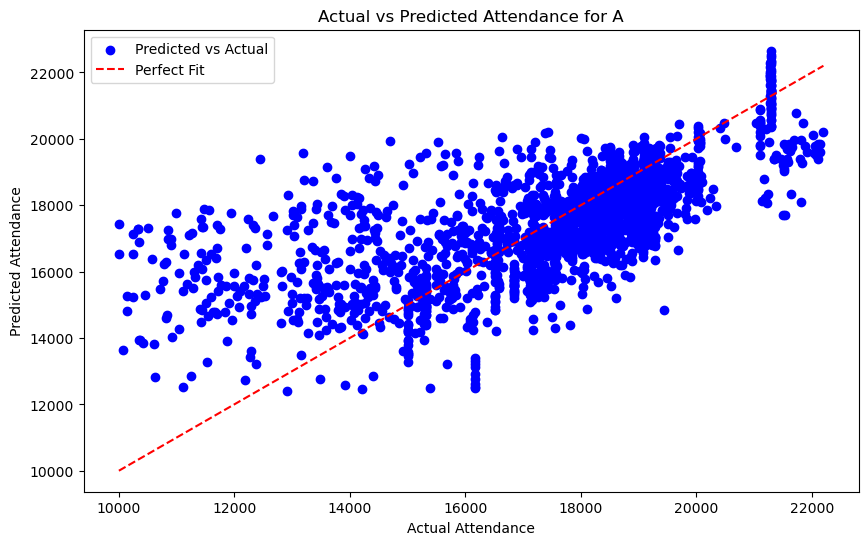

PLS Regression - MSE for LA:
Train MSE: 0.011979722459119475
Test MSE: 0.012178176978331342
Train R²: 0.4297
Test R²: 0.3909
Train MSE Attendance: 2848177.194372692
Test MSE Attendance: 2941202.0108701787



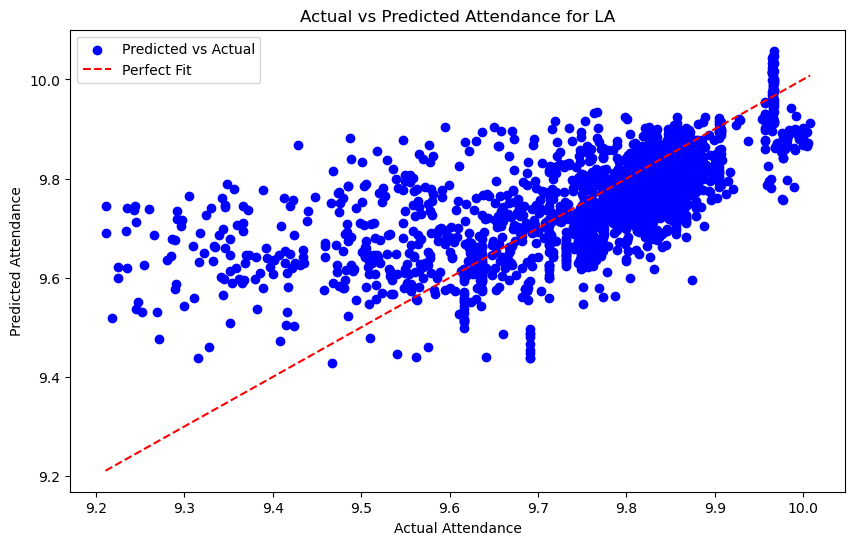

PLS Regression - MSE for PA:
Train MSE: 0.008419858893741689
Test MSE: 0.00861355421745627
Train R²: 0.2347
Test R²: 0.1996
Train MSE Attendance: 2806598.6079442506
Test MSE Attendance: 2866964.3377040676



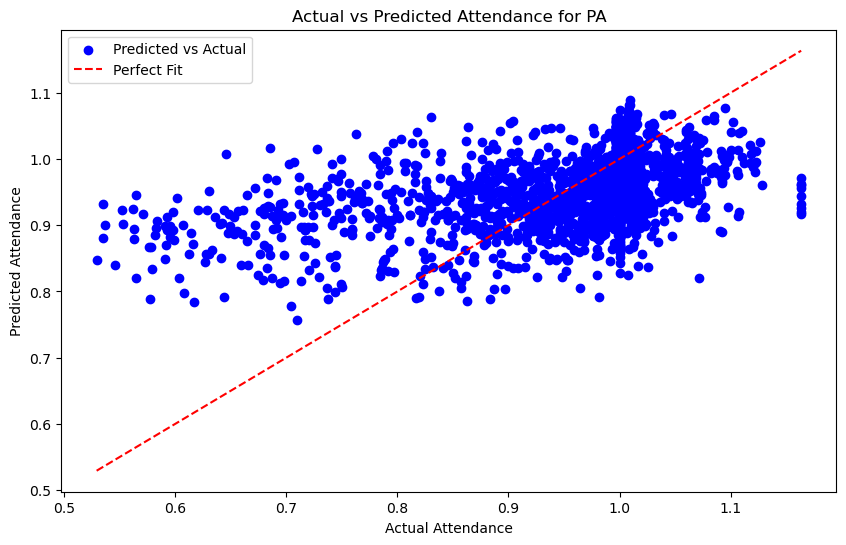

PLS Regression - MSE for LPA:
Train MSE: 0.011981910628972388
Test MSE: 0.012184969453109675
Train R²: 0.2260
Test R²: 0.1924
Train MSE Attendance: 2850974.5651232107
Test MSE Attendance: 2934542.4543273076



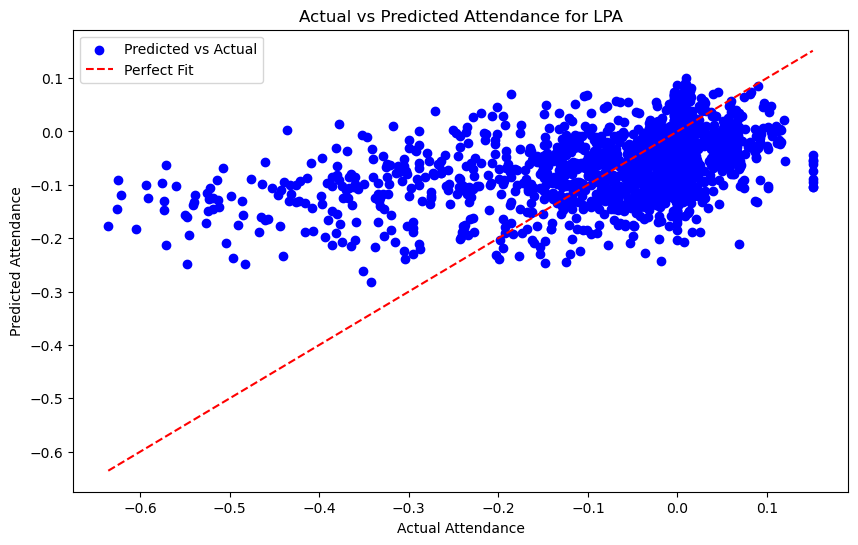

PLS Regression - MSE for LA/LC:
Train MSE: 0.00012460003792753676
Test MSE: 0.00012665279214948692
Train R²: 0.2261
Test R²: 0.1921
Train MSE Attendance: 2842115.3356654826
Test MSE Attendance: 2924642.1362805585



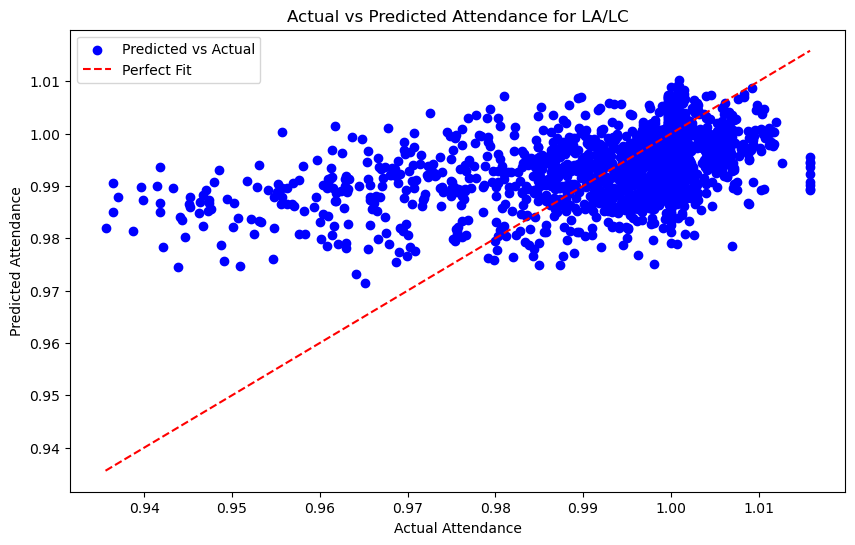

In [42]:
# Loop over dependent variables
for dep in dependent_vars:
    X = df_att.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att[dep]

    # Add constant (intercept) to the model
    X = sm.add_constant(X)

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=rand_seed)
    X_train_unscaled, X_test_unscaled, _, _ = train_test_split(X, y, test_size=0.2, random_state=rand_seed)

    # Initialize PLS model, choose n_components based on your dataset
    pls_model = PLSRegression(n_components=30)  # You can try different values for n_components
    pls_model.fit(X_train, y_train)

    # Get predictions
    y_train_pred = pls_model.predict(X_train)
    y_test_pred = pls_model.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)

    # Print results
    print(f"PLS Regression - MSE for {dep}:")
    print(f"Train MSE: {train_mse}")
    print(f"Test MSE: {test_mse}")

    # Calculate R-squared
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    print(f"Train R²: {train_r2:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    # You can calculate MSE for unscaled data (optional)
    calc_mse_att(dep, X_train_unscaled, X_test_unscaled, y_train, y_test, y_train_pred, y_test_pred)

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.464
Model:                            OLS   Adj. R-squared:                  0.460
Method:                 Least Squares   F-statistic:                     101.4
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        20:30:45   Log-Likelihood:                -71212.
No. Observations:                8023   AIC:                         1.426e+05
Df Residuals:                    7954   BIC:                         1.430e+05
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

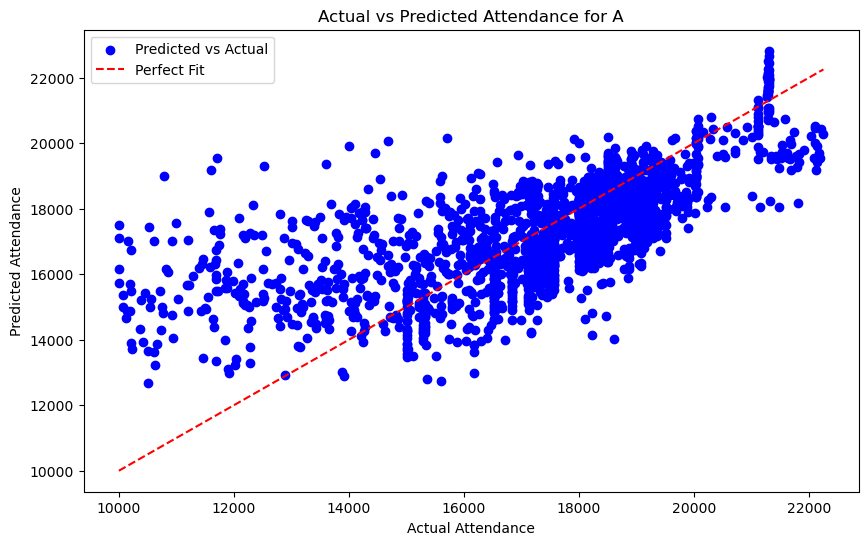

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.417
Method:                 Least Squares   F-statistic:                     85.38
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        20:30:45   Log-Likelihood:                 6082.8
No. Observations:                8023   AIC:                        -1.203e+04
Df Residuals:                    7954   BIC:                        -1.155e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

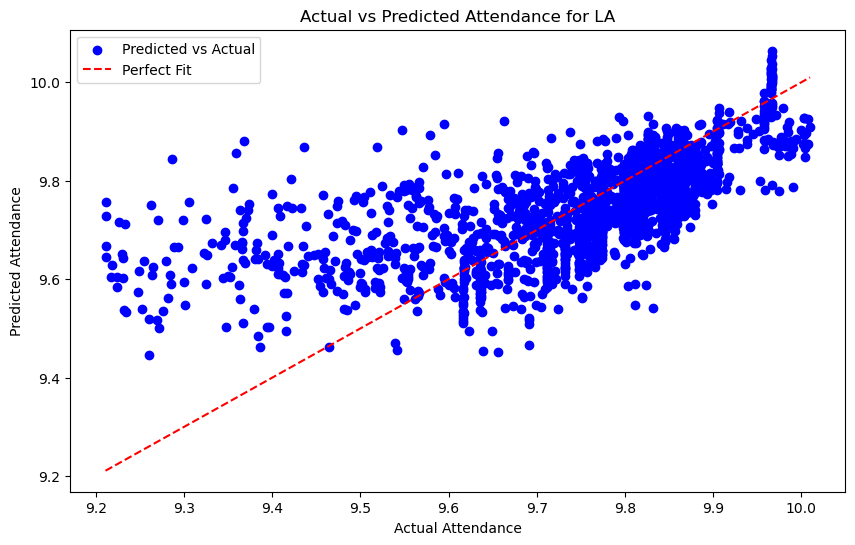

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.232
Model:                            OLS   Adj. R-squared:                  0.225
Method:                 Least Squares   F-statistic:                     35.25
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        20:30:46   Log-Likelihood:                 7499.4
No. Observations:                8023   AIC:                        -1.486e+04
Df Residuals:                    7954   BIC:                        -1.438e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

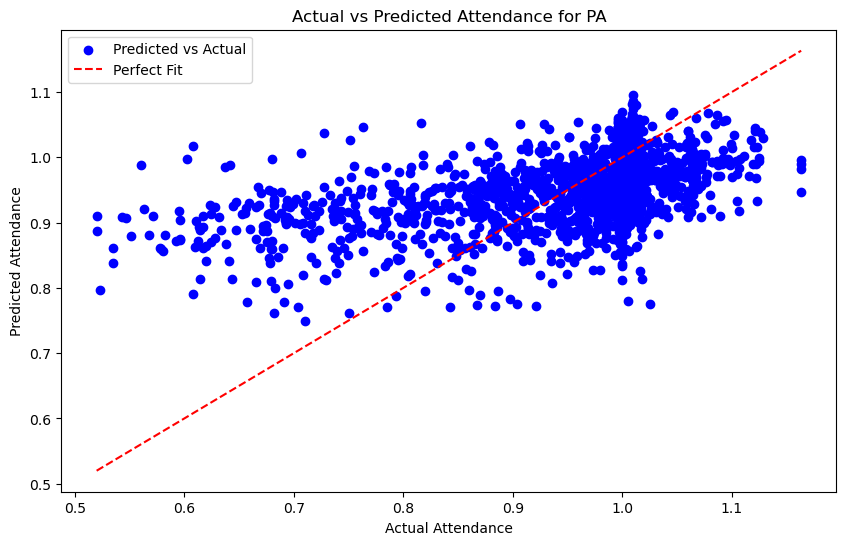

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.223
Model:                            OLS   Adj. R-squared:                  0.216
Method:                 Least Squares   F-statistic:                     33.52
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        20:30:46   Log-Likelihood:                 6082.8
No. Observations:                8023   AIC:                        -1.203e+04
Df Residuals:                    7954   BIC:                        -1.155e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

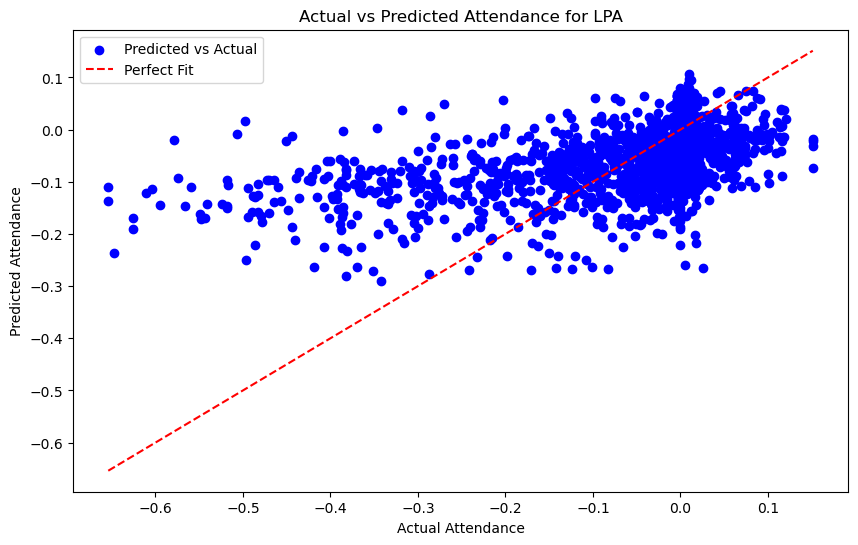

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.223
Model:                            OLS   Adj. R-squared:                  0.216
Method:                 Least Squares   F-statistic:                     33.51
Date:                Tue, 11 Mar 2025   Prob (F-statistic):               0.00
Time:                        20:30:46   Log-Likelihood:                 24401.
No. Observations:                8023   AIC:                        -4.866e+04
Df Residuals:                    7954   BIC:                        -4.818e+04
Df Model:                          68                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

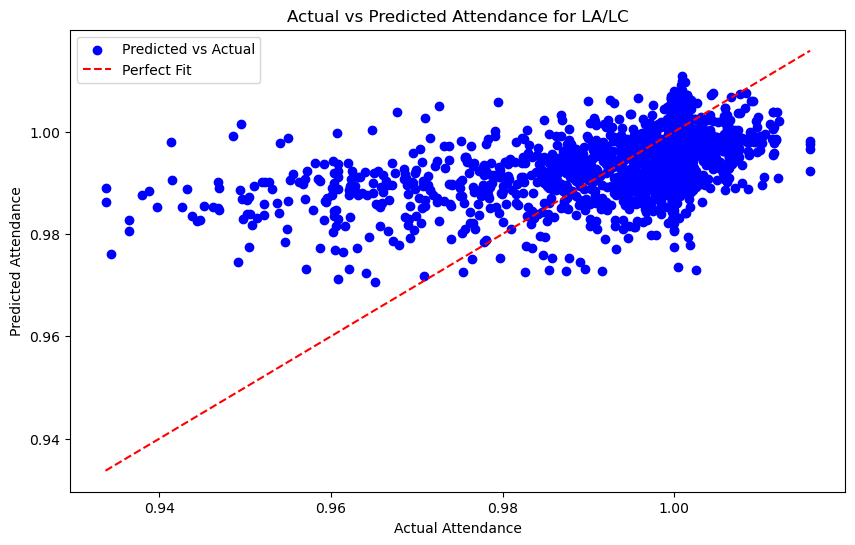

In [43]:
# remove teams that seem to misreport their attendance?
remove = ['Boston Bruins', 'Tampa Bay Lightning', 'Seattle Kraken']

df_att_remove = df_att[~df_att['H'].isin(remove)]

# run a linear regression with literally just all the variables lol
# define features (X) and target (y) with all columns except 'A' (attendance)

for dep in dependent_vars:
    X = df_att_remove.drop(columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
    y = df_att_remove[dep]

    # split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)

    # fit the OLS model on the training data
    model = sm.OLS(y_train, sm.add_constant(X_train)).fit()  # Add constant for intercept

    # print model summary
    print('-' * 60)
    print(model.summary())

    y_pred = model.predict(sm.add_constant(X_test))

    # Calculate MSE for test set
    mse_test = mean_squared_error(y_test, y_pred)
    print(f'\nMean Squared Error (MSE) for Test Set: {mse_test}\n')
    
    # variables with p < 0.05
    significant_vars = model.pvalues[model.pvalues < 0.05].index.tolist()
    print(f"Variables with p-value < 0.05:\n{significant_vars}\n")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Actual Attendance')
    plt.ylabel('Predicted Attendance')
    plt.title(f'Actual vs Predicted Attendance for {dep}')
    plt.legend()
    plt.show()


Running OLS for Chicago Blackhawks
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     30.60
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.99e-77
Time:                        12:50:23   Log-Likelihood:                -2350.0
No. Observations:                 292   AIC:                             4790.
Df Residuals:                     247   BIC:                             4955.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

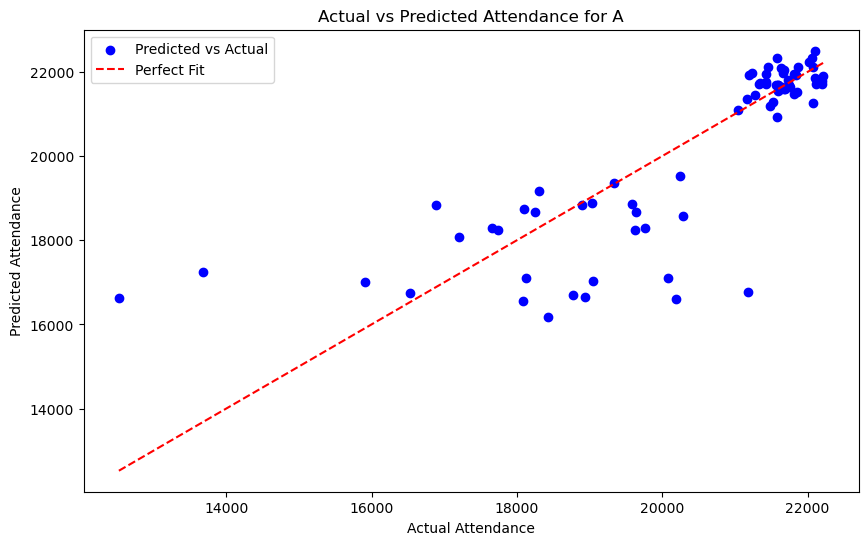

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     26.14
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.94e-70
Time:                        12:50:23   Log-Likelihood:                 505.65
No. Observations:                 292   AIC:                            -921.3
Df Residuals:                     247   BIC:                            -755.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

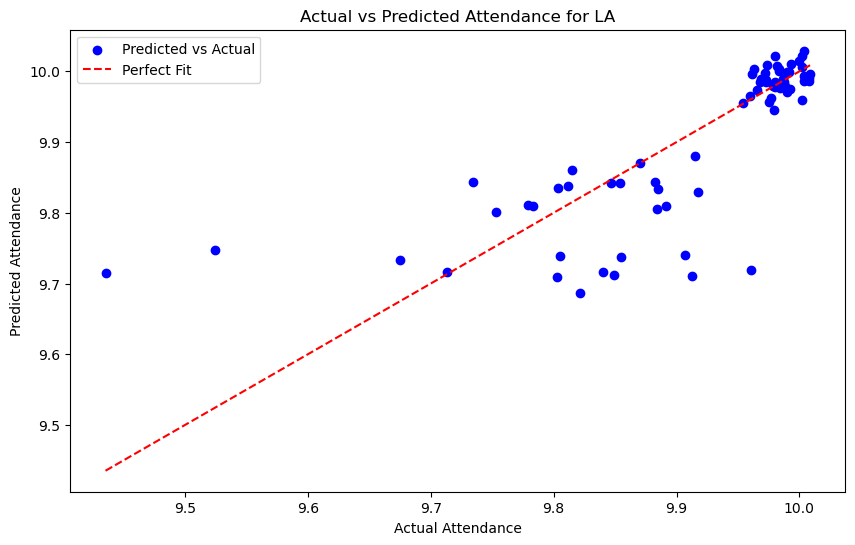

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     30.60
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.99e-77
Time:                        12:50:23   Log-Likelihood:                 537.68
No. Observations:                 292   AIC:                            -985.4
Df Residuals:                     247   BIC:                            -819.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

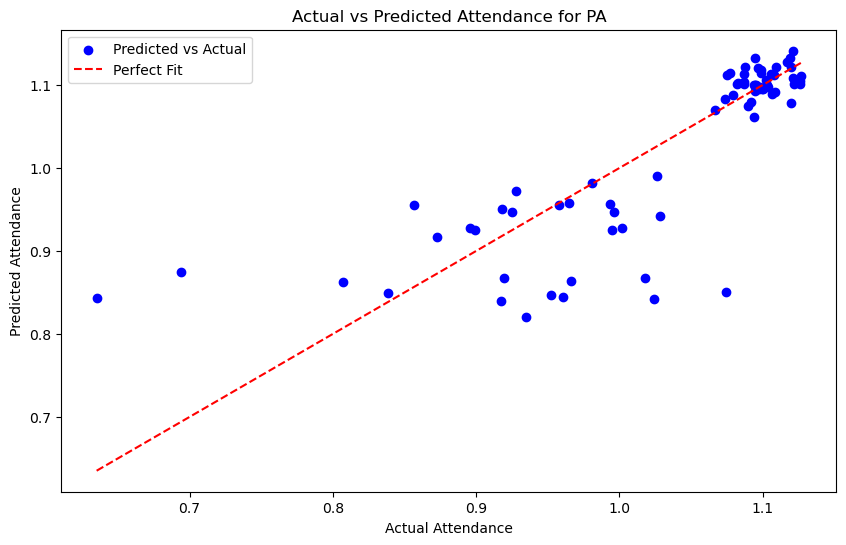

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     26.14
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.94e-70
Time:                        12:50:23   Log-Likelihood:                 505.65
No. Observations:                 292   AIC:                            -921.3
Df Residuals:                     247   BIC:                            -755.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

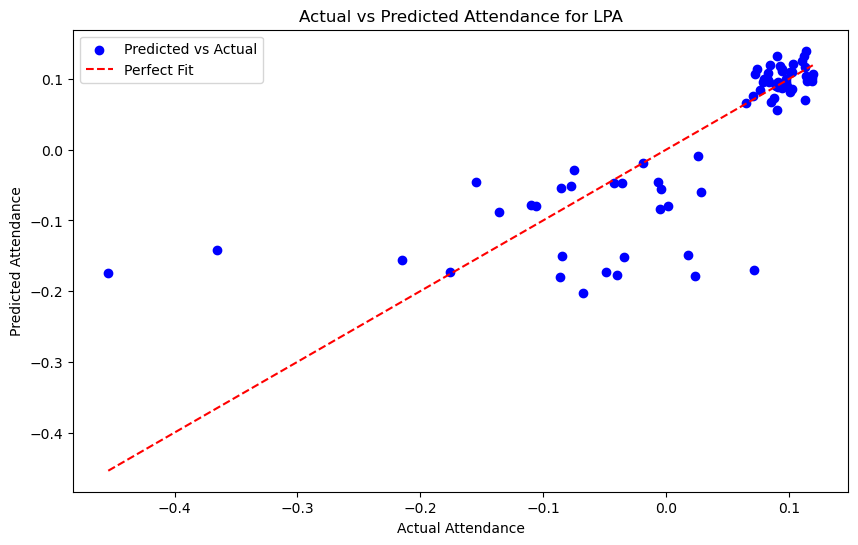

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     26.14
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.94e-70
Time:                        12:50:23   Log-Likelihood:                 1174.8
No. Observations:                 292   AIC:                            -2260.
Df Residuals:                     247   BIC:                            -2094.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

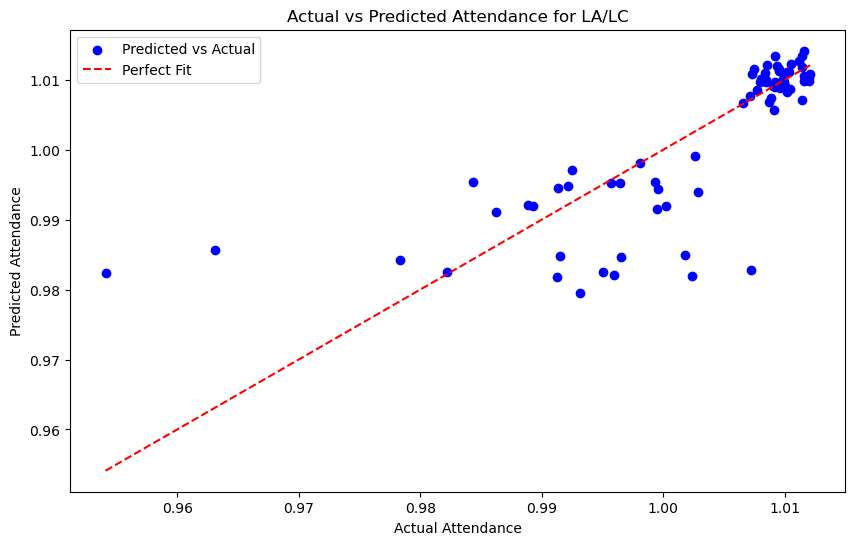


Running OLS for Edmonton Oilers
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     21.79
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.12e-61
Time:                        12:50:23   Log-Likelihood:                -2095.8
No. Observations:                 284   AIC:                             4282.
Df Residuals:                     239   BIC:                             4446.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t| 

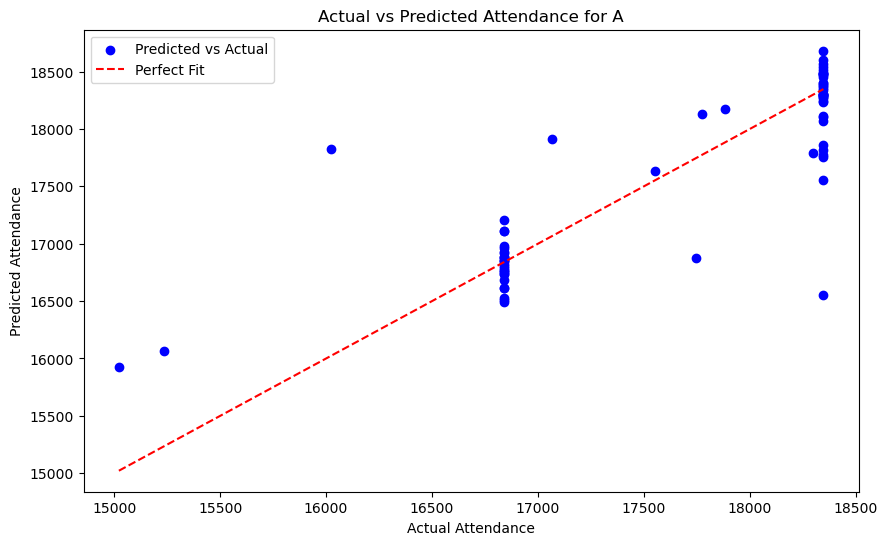

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.748
Method:                 Least Squares   F-statistic:                     20.09
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.81e-58
Time:                        12:50:24   Log-Likelihood:                 663.63
No. Observations:                 284   AIC:                            -1237.
Df Residuals:                     239   BIC:                            -1073.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

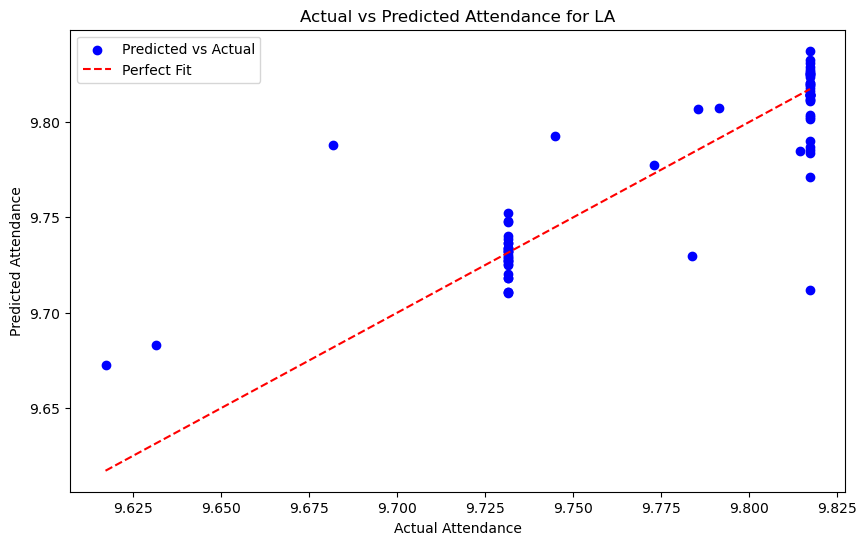

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.611
Method:                 Least Squares   F-statistic:                     11.09
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.40e-37
Time:                        12:50:24   Log-Likelihood:                 692.30
No. Observations:                 284   AIC:                            -1295.
Df Residuals:                     239   BIC:                            -1130.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

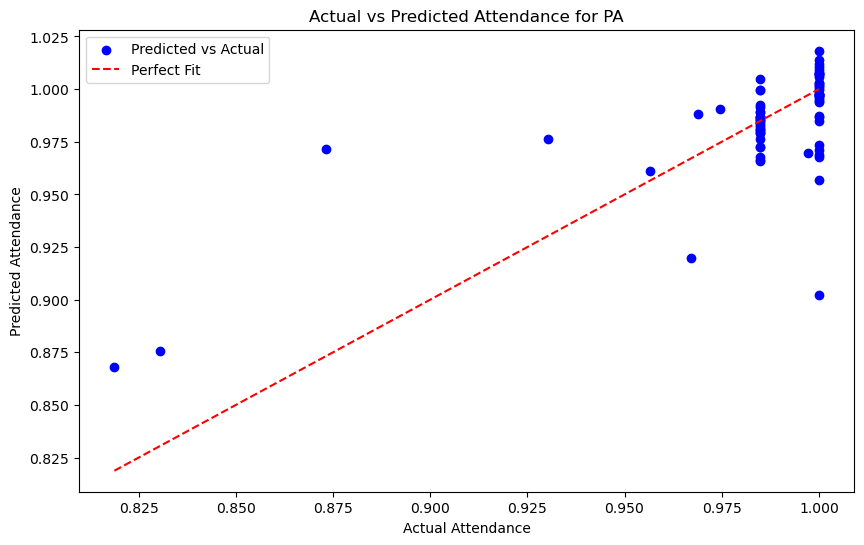

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     10.74
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.51e-36
Time:                        12:50:24   Log-Likelihood:                 663.63
No. Observations:                 284   AIC:                            -1237.
Df Residuals:                     239   BIC:                            -1073.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

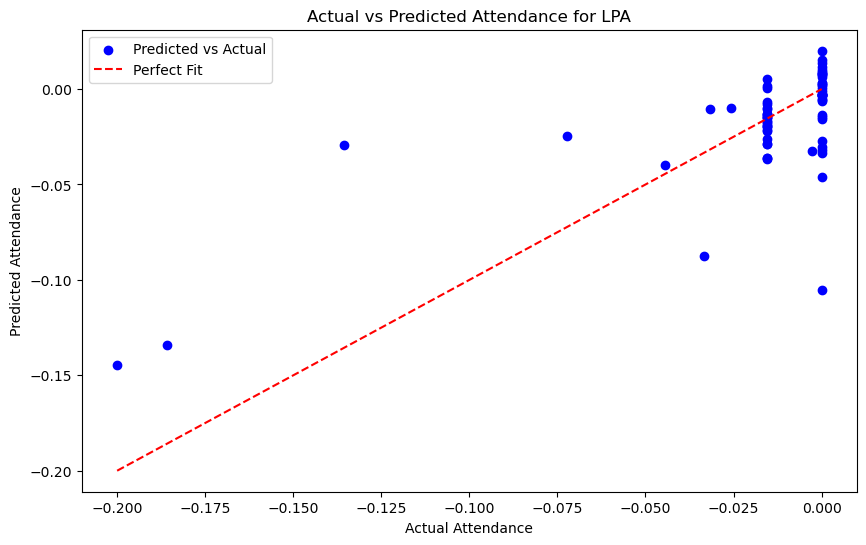

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     10.74
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.56e-36
Time:                        12:50:24   Log-Likelihood:                 1312.3
No. Observations:                 284   AIC:                            -2535.
Df Residuals:                     239   BIC:                            -2370.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

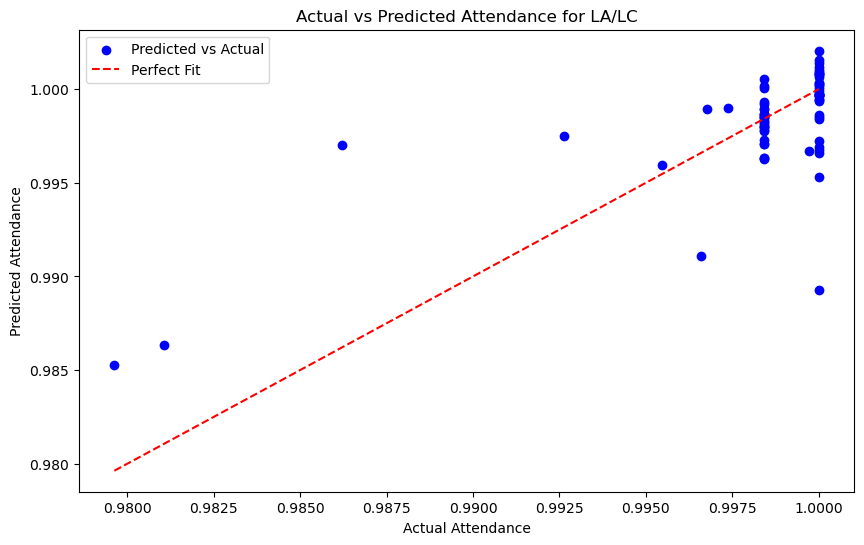


Running OLS for Montreal Canadiens
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.350
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     2.945
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           6.98e-08
Time:                        12:50:24   Log-Likelihood:                -2313.3
No. Observations:                 286   AIC:                             4717.
Df Residuals:                     241   BIC:                             4881.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

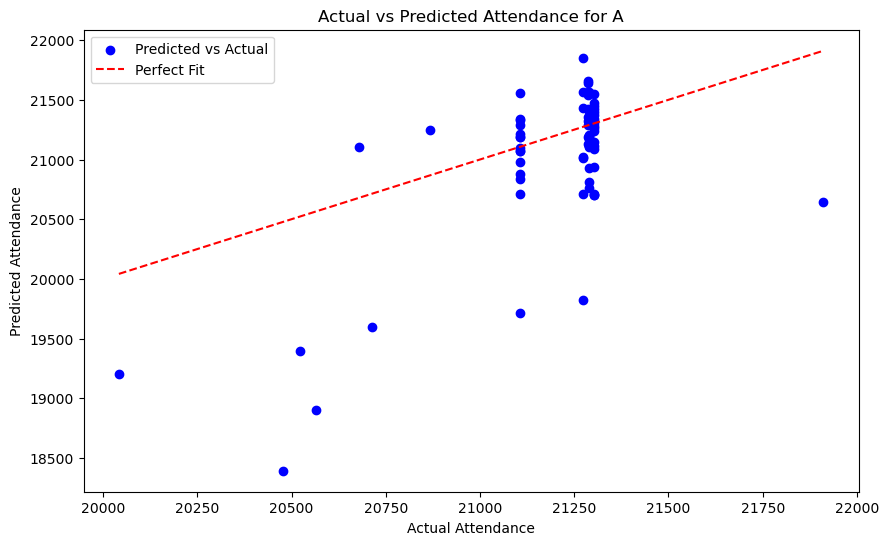

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.189
Method:                 Least Squares   F-statistic:                     2.512
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.68e-06
Time:                        12:50:24   Log-Likelihood:                 444.55
No. Observations:                 286   AIC:                            -799.1
Df Residuals:                     241   BIC:                            -634.6
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

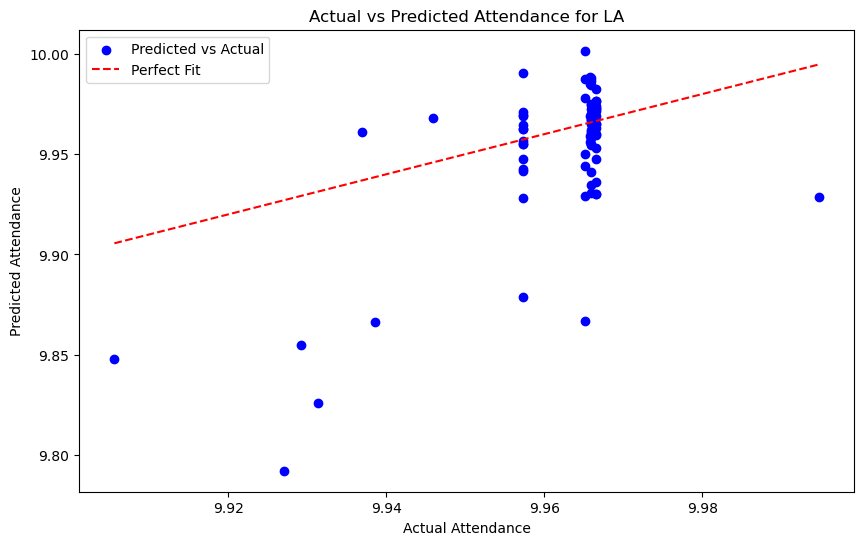

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.350
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     2.945
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           6.98e-08
Time:                        12:50:25   Log-Likelihood:                 534.49
No. Observations:                 286   AIC:                            -979.0
Df Residuals:                     241   BIC:                            -814.5
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

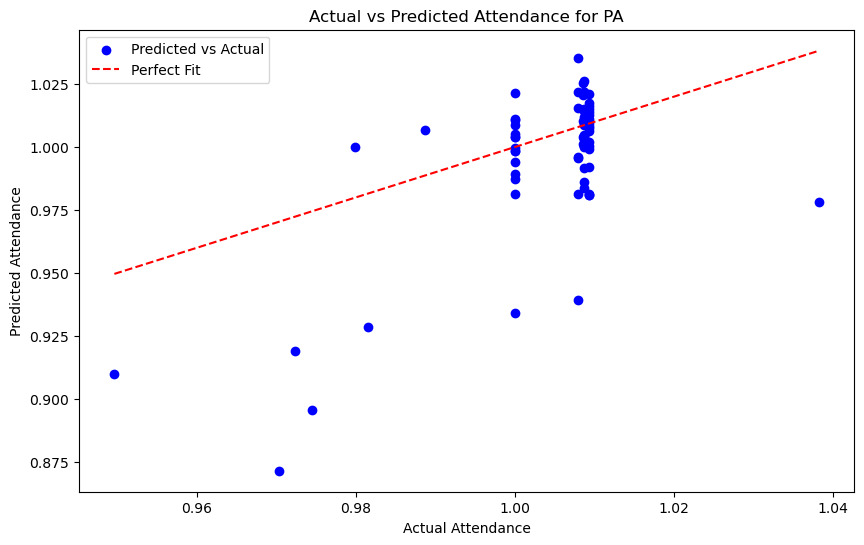

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.189
Method:                 Least Squares   F-statistic:                     2.512
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.68e-06
Time:                        12:50:25   Log-Likelihood:                 444.55
No. Observations:                 286   AIC:                            -799.1
Df Residuals:                     241   BIC:                            -634.6
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

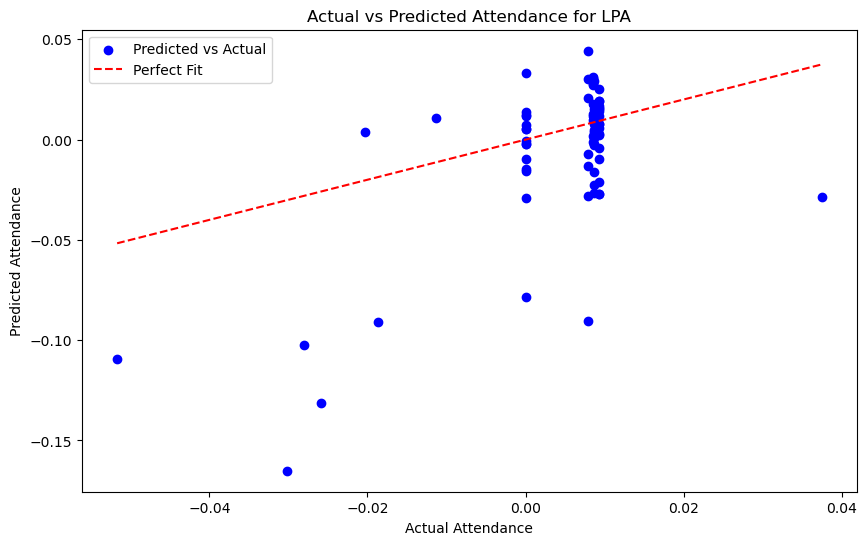

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.189
Method:                 Least Squares   F-statistic:                     2.512
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.68e-06
Time:                        12:50:25   Log-Likelihood:                 1101.9
No. Observations:                 286   AIC:                            -2114.
Df Residuals:                     241   BIC:                            -1949.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

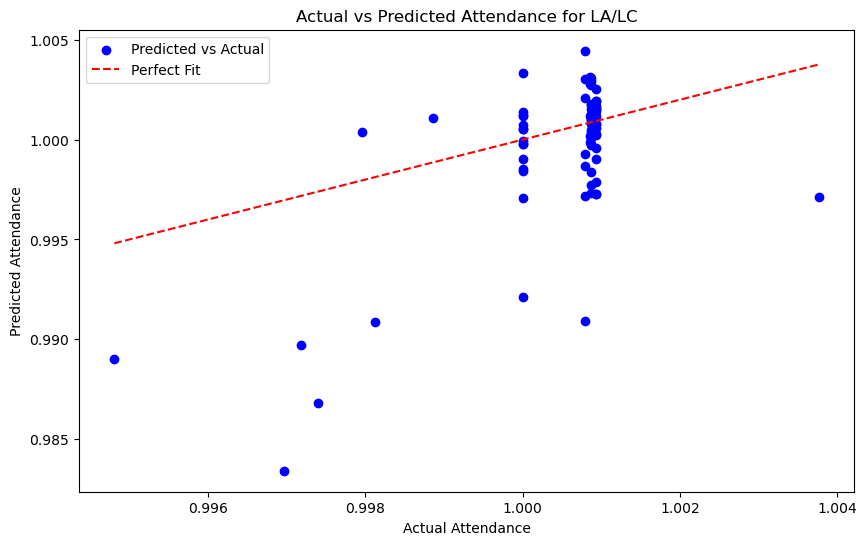


Running OLS for Colorado Avalanche
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.611
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     8.771
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.28e-30
Time:                        12:50:25   Log-Likelihood:                -2444.7
No. Observations:                 291   AIC:                             4979.
Df Residuals:                     246   BIC:                             5145.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

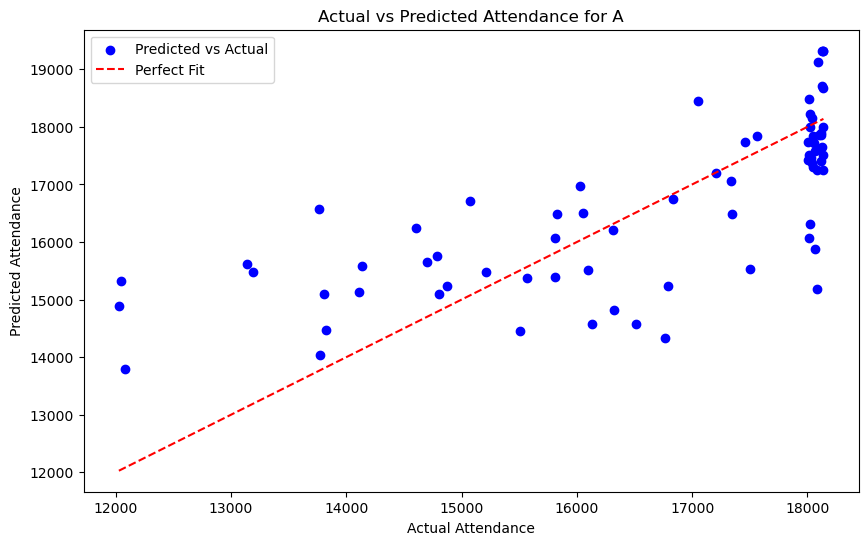

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     8.459
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.42e-29
Time:                        12:50:25   Log-Likelihood:                 361.32
No. Observations:                 291   AIC:                            -632.6
Df Residuals:                     246   BIC:                            -467.3
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

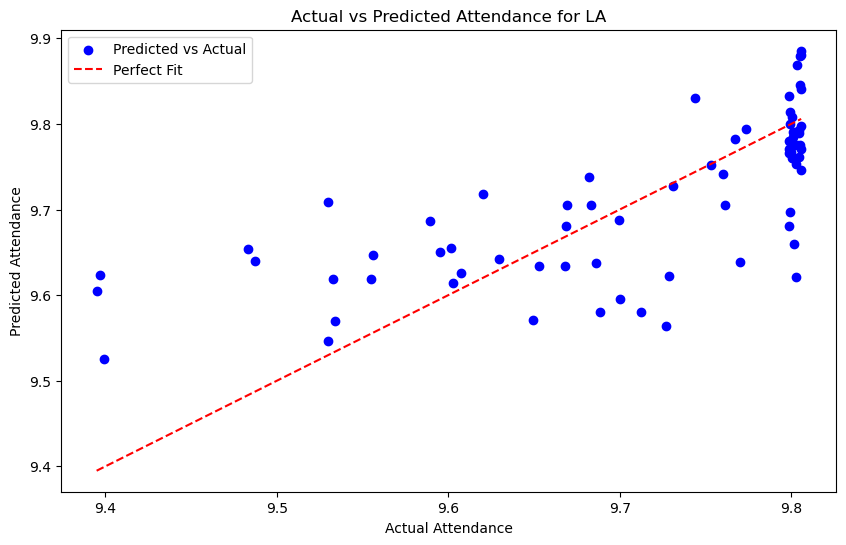

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.611
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     8.771
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.28e-30
Time:                        12:50:25   Log-Likelihood:                 403.44
No. Observations:                 291   AIC:                            -716.9
Df Residuals:                     246   BIC:                            -551.6
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

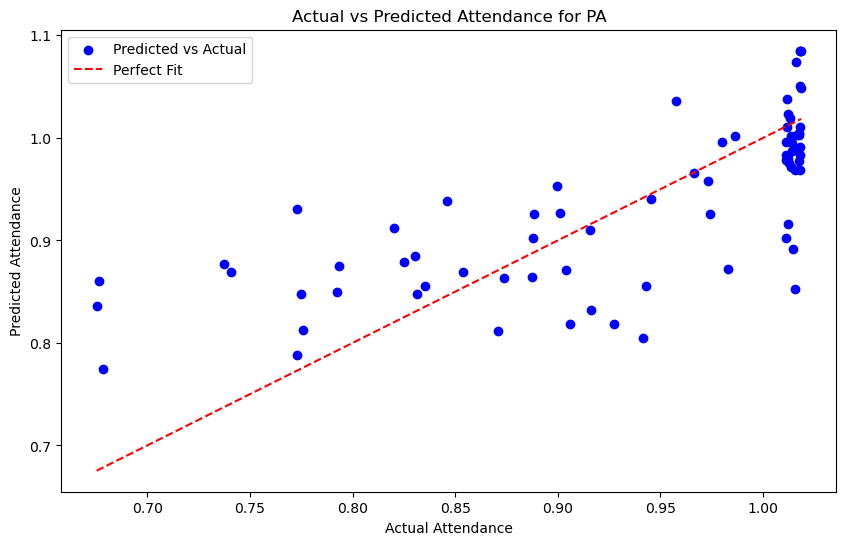

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     8.459
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.42e-29
Time:                        12:50:26   Log-Likelihood:                 361.32
No. Observations:                 291   AIC:                            -632.6
Df Residuals:                     246   BIC:                            -467.3
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

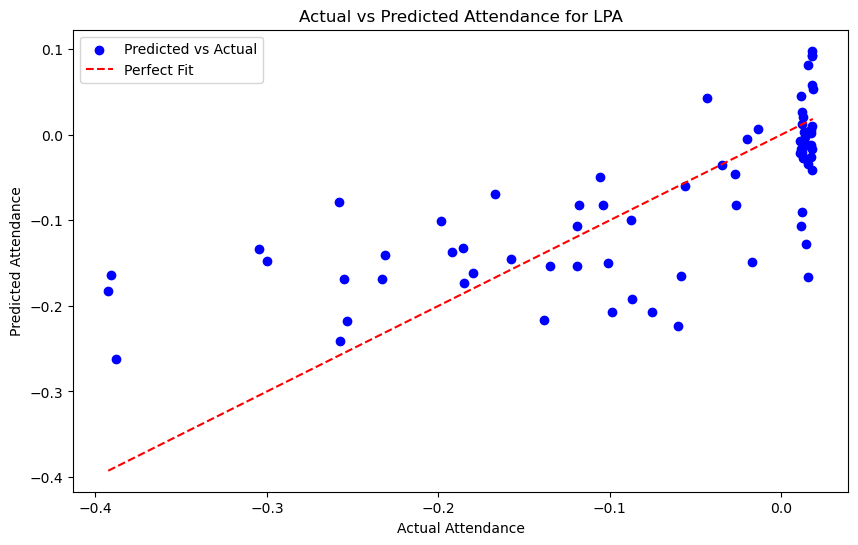

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     8.459
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.42e-29
Time:                        12:50:26   Log-Likelihood:                 1025.1
No. Observations:                 291   AIC:                            -1960.
Df Residuals:                     246   BIC:                            -1795.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

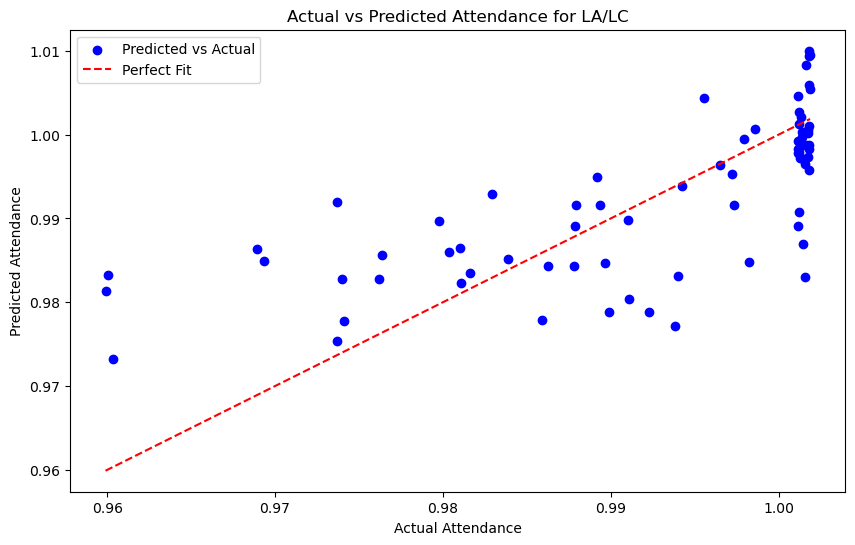


Running OLS for Detroit Red Wings
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.622
Method:                 Least Squares   F-statistic:                     9.842
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.06e-29
Time:                        12:50:26   Log-Likelihood:                -1817.8
No. Observations:                 227   AIC:                             3722.
Df Residuals:                     184   BIC:                             3869.
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t

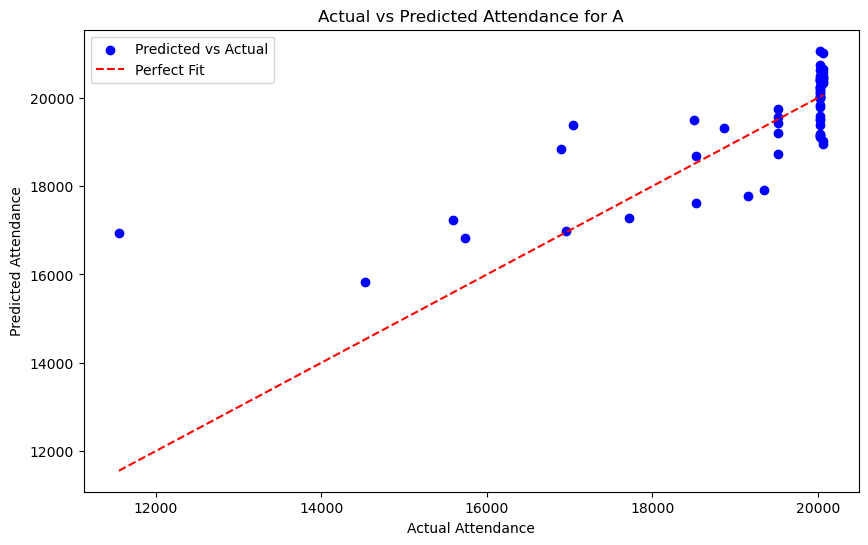

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     9.195
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.93e-27
Time:                        12:50:26   Log-Likelihood:                 397.32
No. Observations:                 227   AIC:                            -708.6
Df Residuals:                     184   BIC:                            -561.4
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

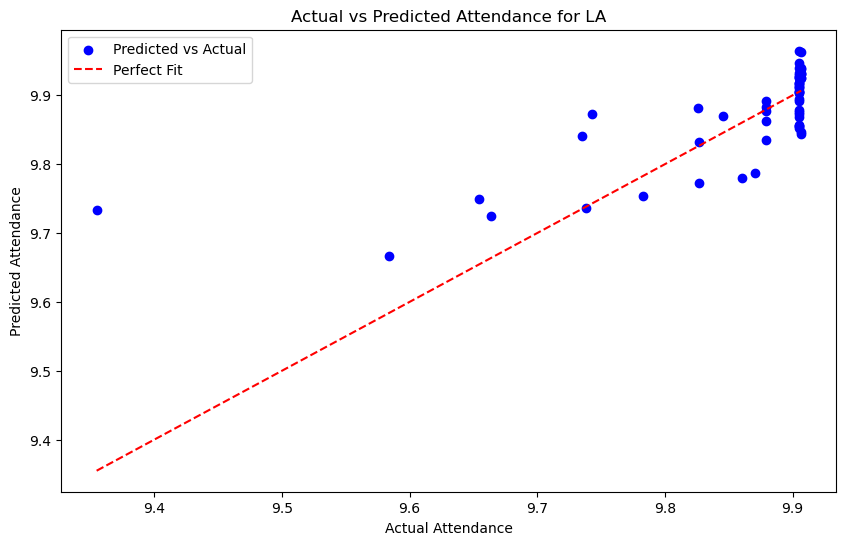

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     6.949
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.65e-21
Time:                        12:50:26   Log-Likelihood:                 424.73
No. Observations:                 227   AIC:                            -763.5
Df Residuals:                     184   BIC:                            -616.2
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

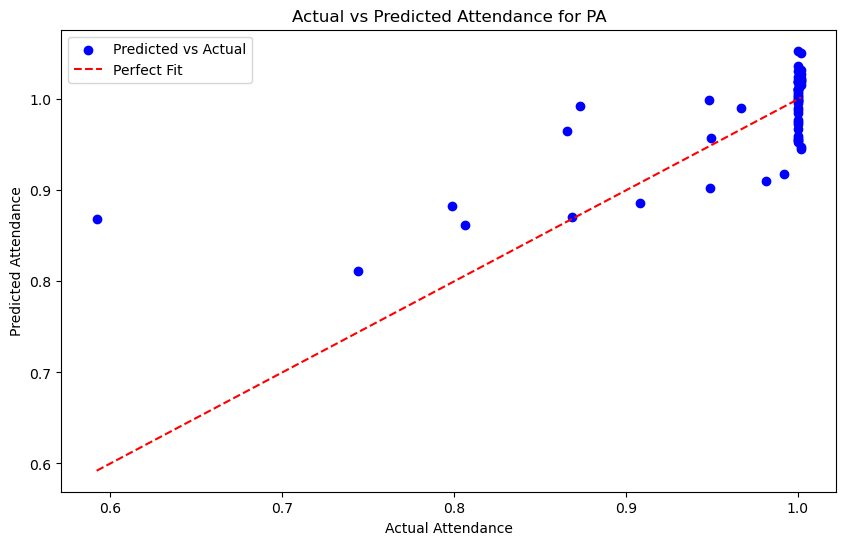

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.608
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     6.785
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.48e-20
Time:                        12:50:26   Log-Likelihood:                 397.32
No. Observations:                 227   AIC:                            -708.6
Df Residuals:                     184   BIC:                            -561.4
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

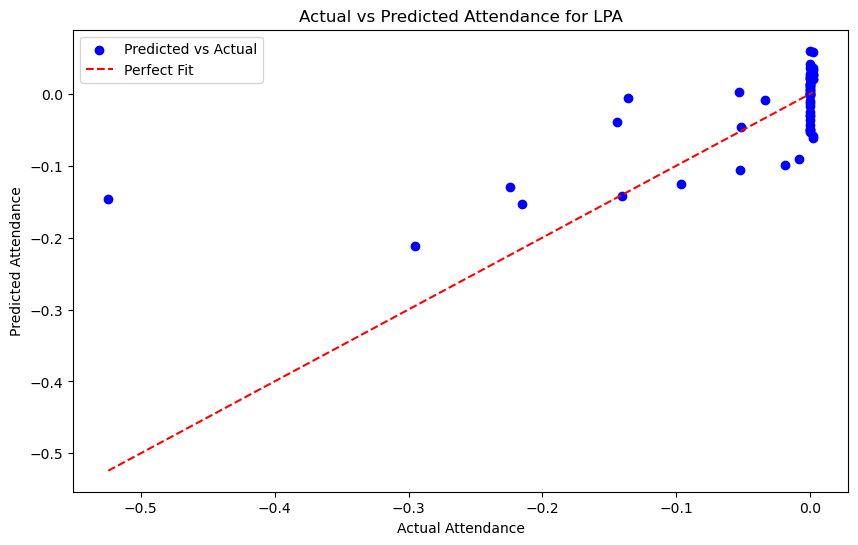

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.608
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     6.785
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.48e-20
Time:                        12:50:27   Log-Likelihood:                 917.24
No. Observations:                 227   AIC:                            -1748.
Df Residuals:                     184   BIC:                            -1601.
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

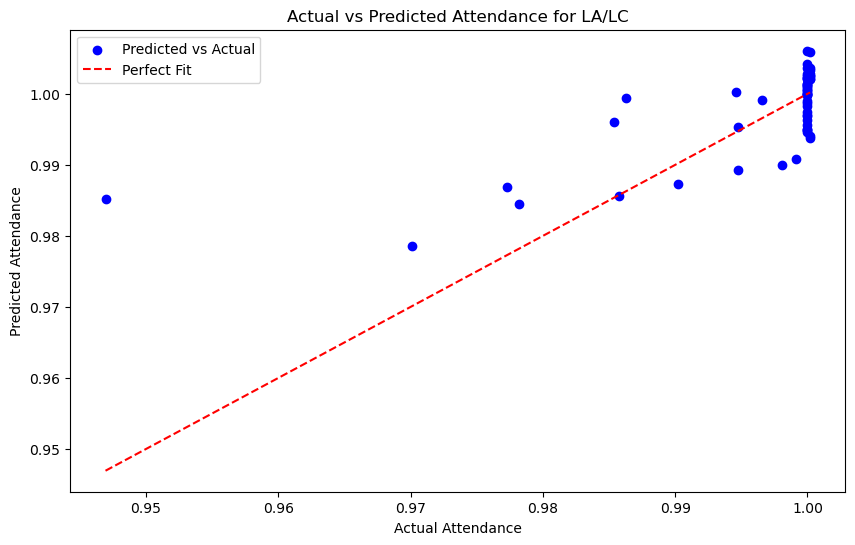


Running OLS for Philadelphia Flyers
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.562
Method:                 Least Squares   F-statistic:                     9.471
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.86e-33
Time:                        12:50:27   Log-Likelihood:                -2389.6
No. Observations:                 292   AIC:                             4869.
Df Residuals:                     247   BIC:                             5035.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>

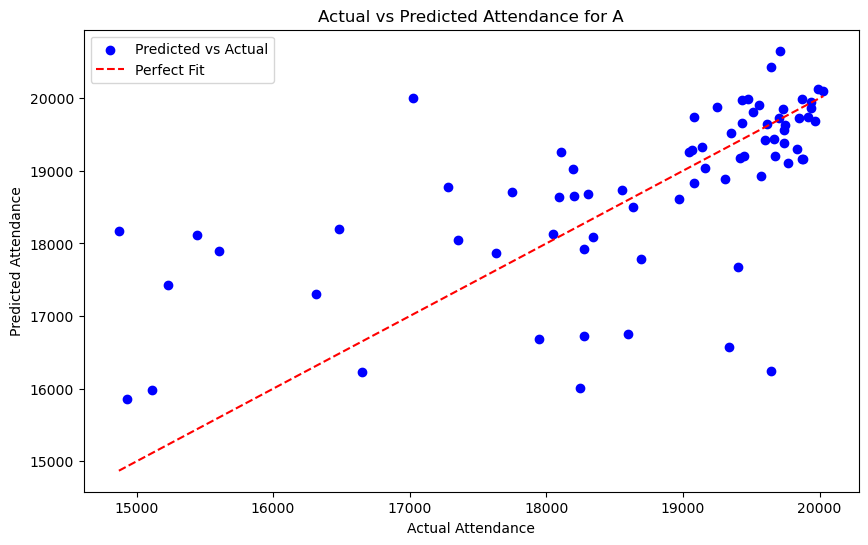

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.530
Method:                 Least Squares   F-statistic:                     8.473
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.14e-29
Time:                        12:50:27   Log-Likelihood:                 446.30
No. Observations:                 292   AIC:                            -802.6
Df Residuals:                     247   BIC:                            -637.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

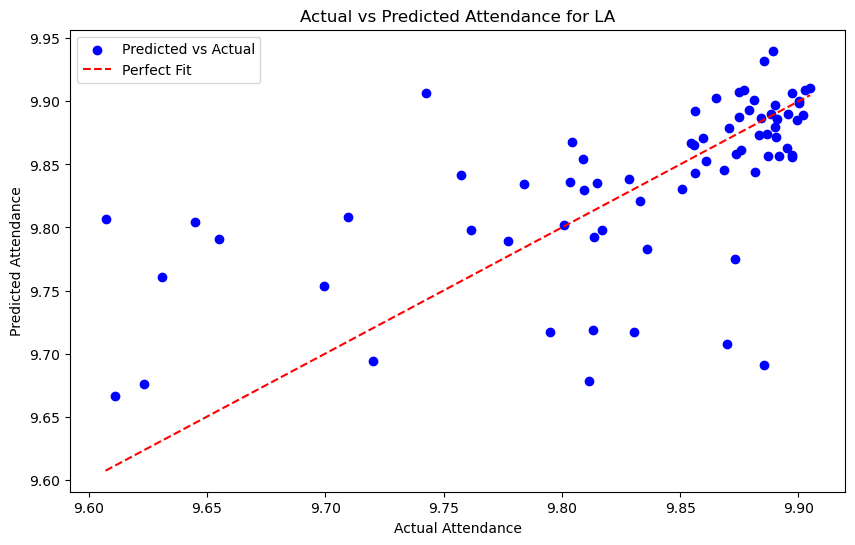

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.562
Method:                 Least Squares   F-statistic:                     9.471
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.86e-33
Time:                        12:50:27   Log-Likelihood:                 495.43
No. Observations:                 292   AIC:                            -900.9
Df Residuals:                     247   BIC:                            -735.4
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

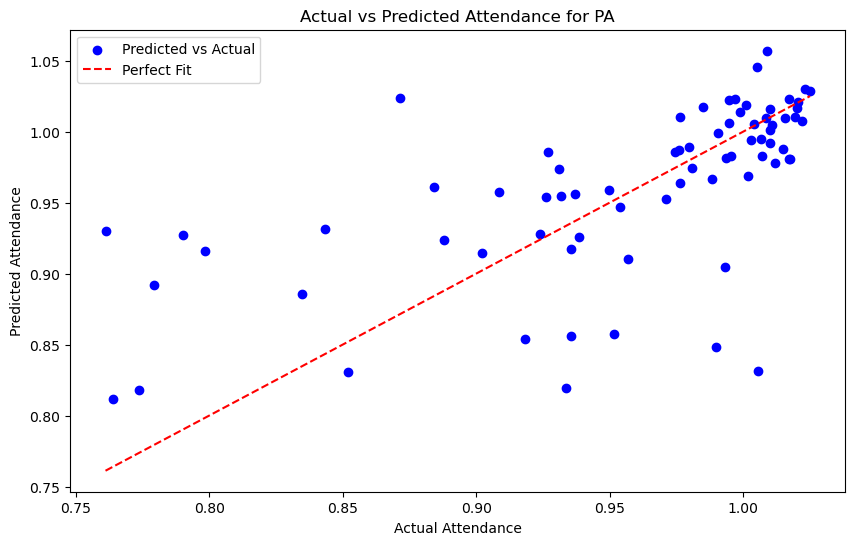

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.530
Method:                 Least Squares   F-statistic:                     8.473
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.14e-29
Time:                        12:50:27   Log-Likelihood:                 446.30
No. Observations:                 292   AIC:                            -802.6
Df Residuals:                     247   BIC:                            -637.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

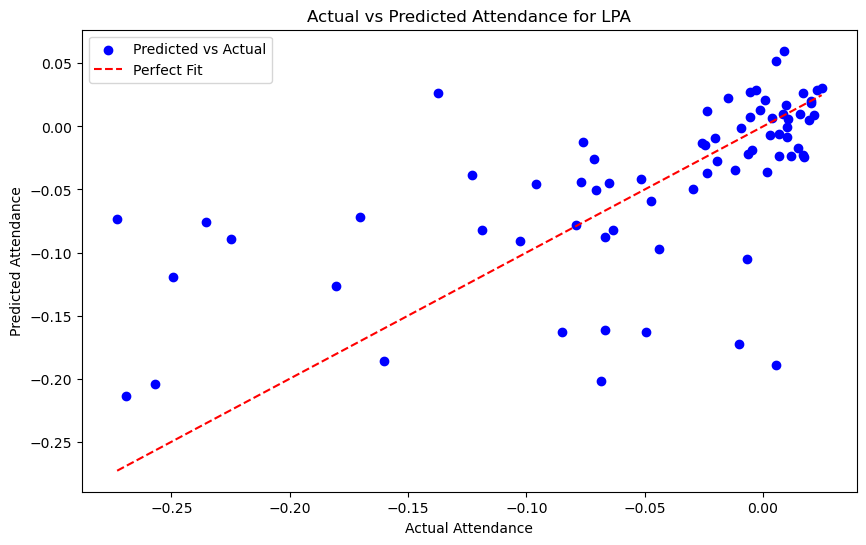

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.530
Method:                 Least Squares   F-statistic:                     8.473
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.14e-29
Time:                        12:50:27   Log-Likelihood:                 1115.1
No. Observations:                 292   AIC:                            -2140.
Df Residuals:                     247   BIC:                            -1975.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

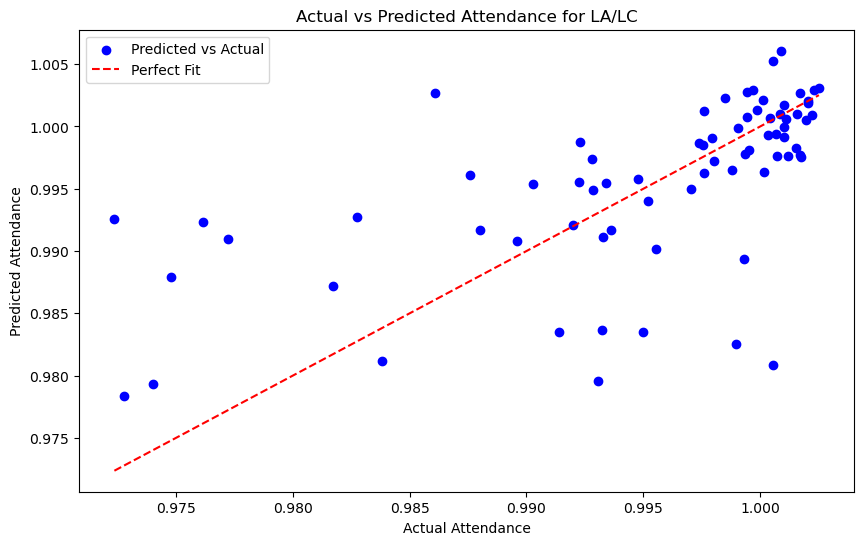


Running OLS for Dallas Stars
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                     9.605
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.88e-33
Time:                        12:50:27   Log-Likelihood:                -2308.9
No. Observations:                 290   AIC:                             4708.
Df Residuals:                     245   BIC:                             4873.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|    

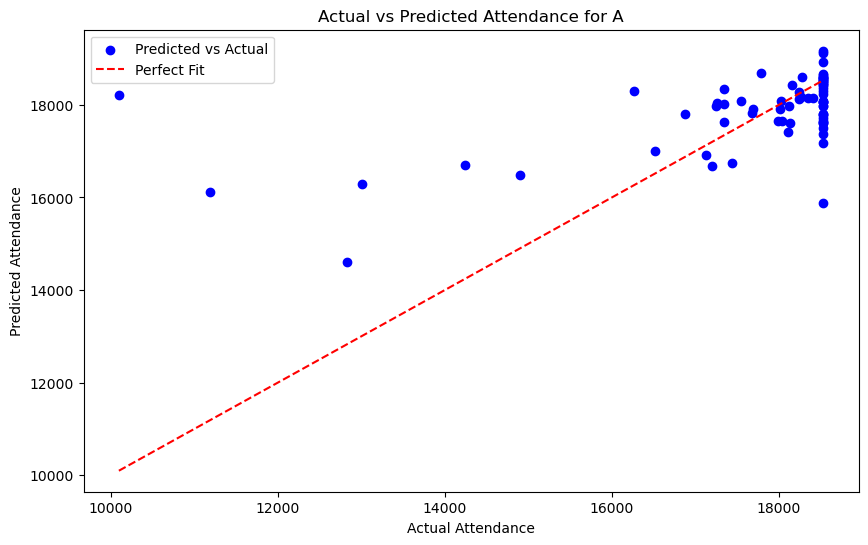

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     9.247
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.02e-32
Time:                        12:50:28   Log-Likelihood:                 498.55
No. Observations:                 290   AIC:                            -907.1
Df Residuals:                     245   BIC:                            -741.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

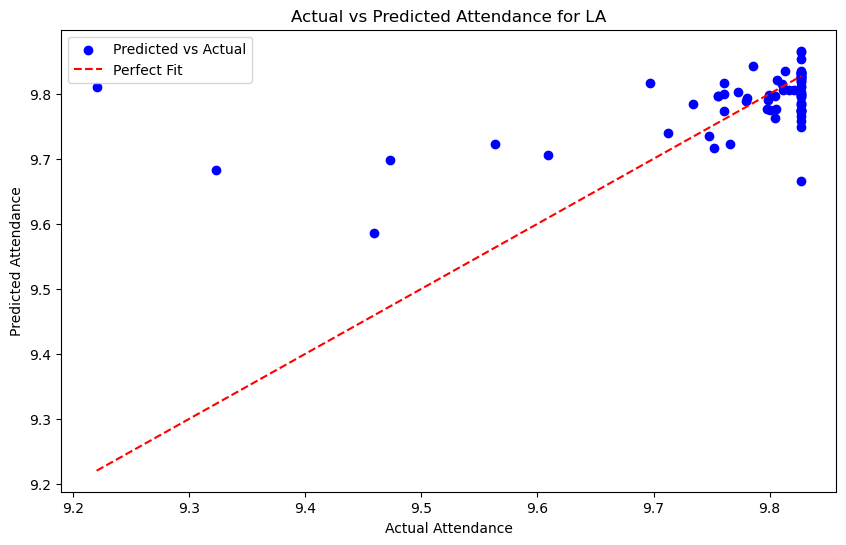

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                     9.605
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.88e-33
Time:                        12:50:28   Log-Likelihood:                 541.00
No. Observations:                 290   AIC:                            -992.0
Df Residuals:                     245   BIC:                            -826.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

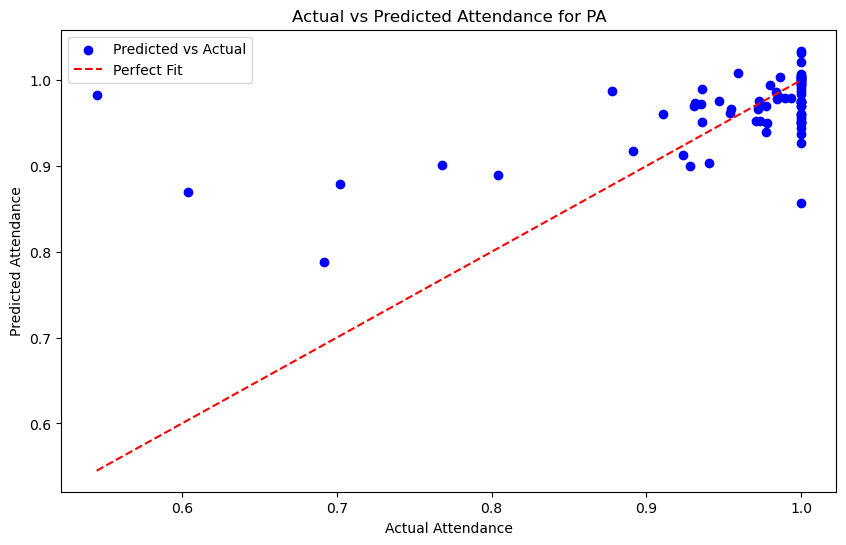

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     9.247
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.02e-32
Time:                        12:50:28   Log-Likelihood:                 498.55
No. Observations:                 290   AIC:                            -907.1
Df Residuals:                     245   BIC:                            -741.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

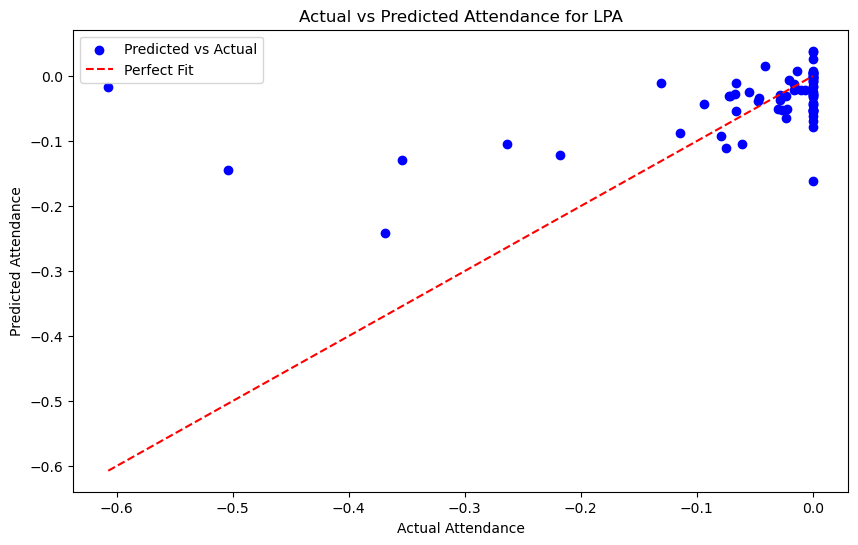

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     9.247
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.02e-32
Time:                        12:50:28   Log-Likelihood:                 1161.2
No. Observations:                 290   AIC:                            -2232.
Df Residuals:                     245   BIC:                            -2067.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

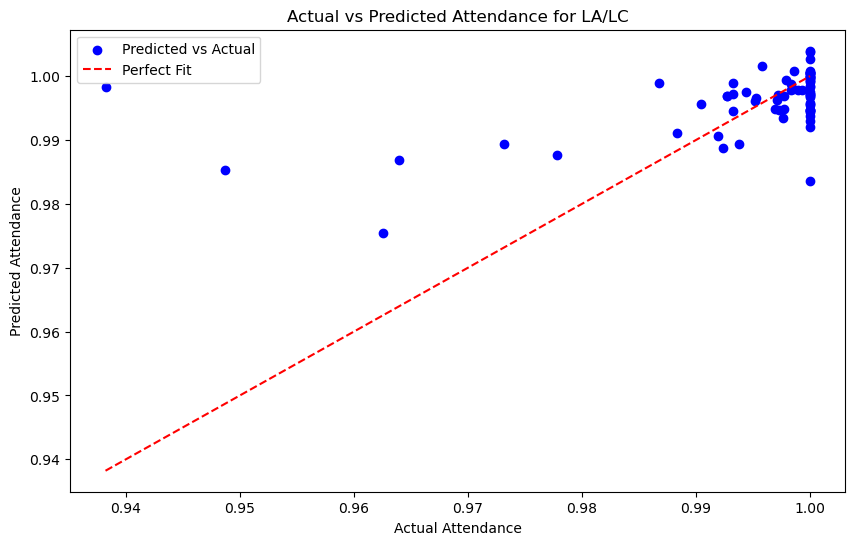


Running OLS for Minnesota Wild
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.429
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     4.170
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.69e-13
Time:                        12:50:28   Log-Likelihood:                -2189.4
No. Observations:                 289   AIC:                             4469.
Df Residuals:                     244   BIC:                             4634.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|  

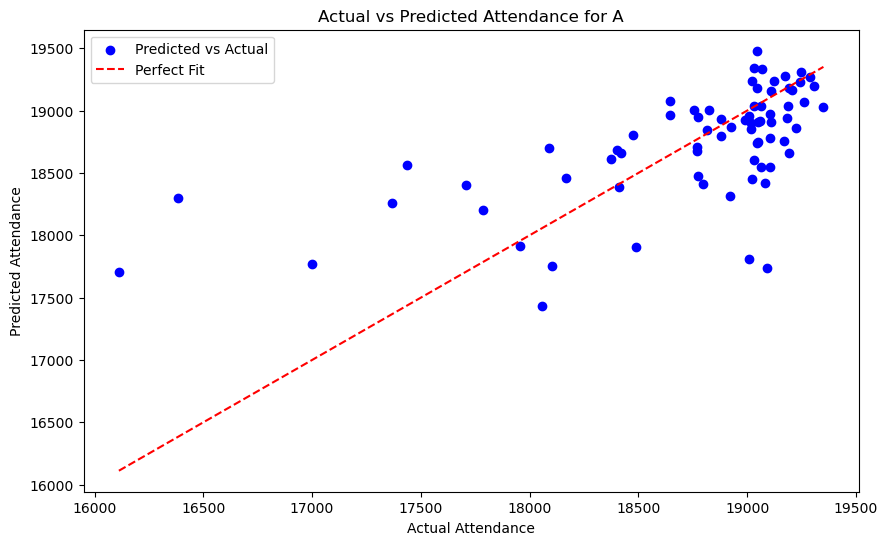

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.318
Method:                 Least Squares   F-statistic:                     4.057
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.12e-12
Time:                        12:50:28   Log-Likelihood:                 638.14
No. Observations:                 289   AIC:                            -1186.
Df Residuals:                     244   BIC:                            -1021.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

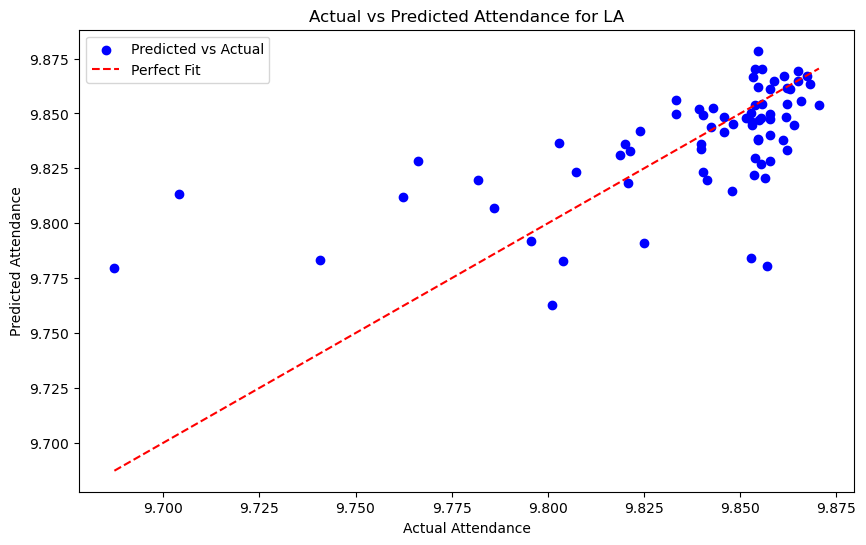

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.429
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     4.170
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.69e-13
Time:                        12:50:29   Log-Likelihood:                 641.55
No. Observations:                 289   AIC:                            -1193.
Df Residuals:                     244   BIC:                            -1028.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

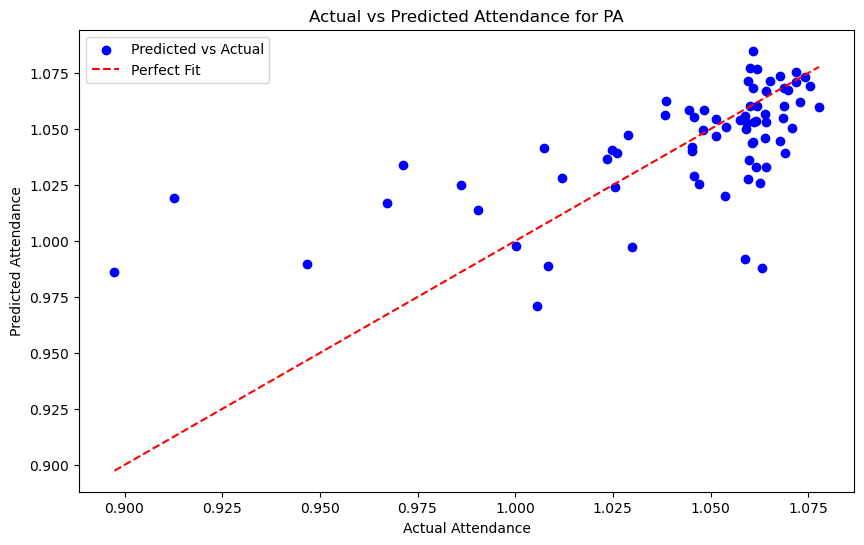

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.318
Method:                 Least Squares   F-statistic:                     4.057
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.12e-12
Time:                        12:50:29   Log-Likelihood:                 638.14
No. Observations:                 289   AIC:                            -1186.
Df Residuals:                     244   BIC:                            -1021.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

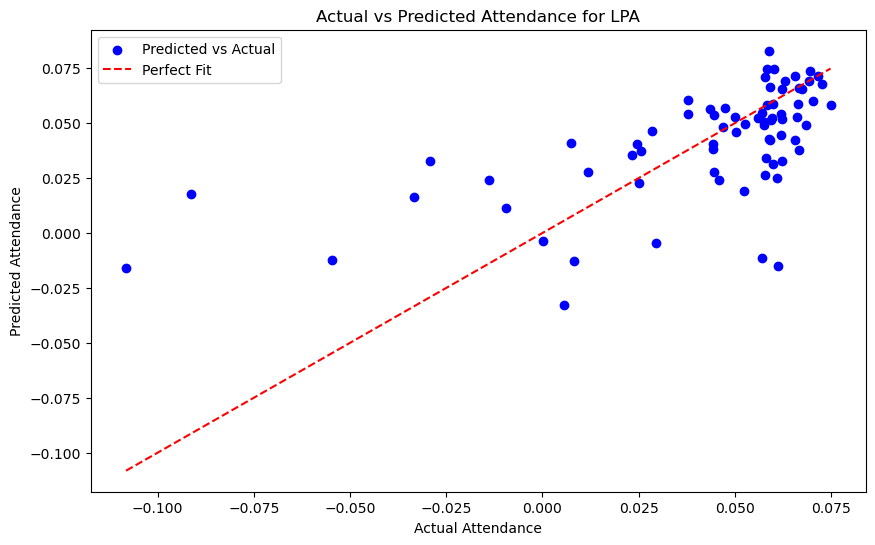

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.318
Method:                 Least Squares   F-statistic:                     4.057
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.12e-12
Time:                        12:50:29   Log-Likelihood:                 1297.6
No. Observations:                 289   AIC:                            -2505.
Df Residuals:                     244   BIC:                            -2340.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

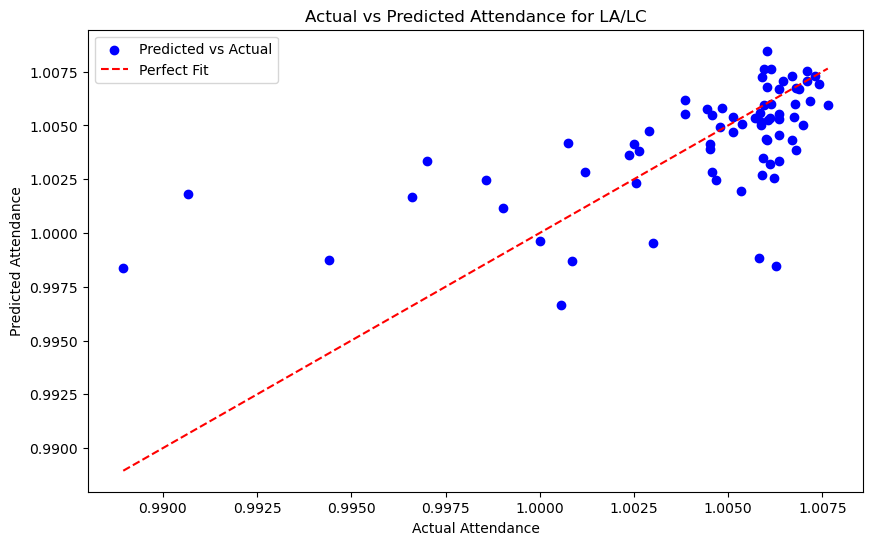


Running OLS for Phoenix Coyotes
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.698
Model:                            OLS   Adj. R-squared:                 -0.558
Method:                 Least Squares   F-statistic:                    0.5560
Date:                Wed, 12 Mar 2025   Prob (F-statistic):              0.860
Time:                        12:50:29   Log-Likelihood:                -272.70
No. Observations:                  32   AIC:                             597.4
Df Residuals:                       6   BIC:                             635.5
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t| 

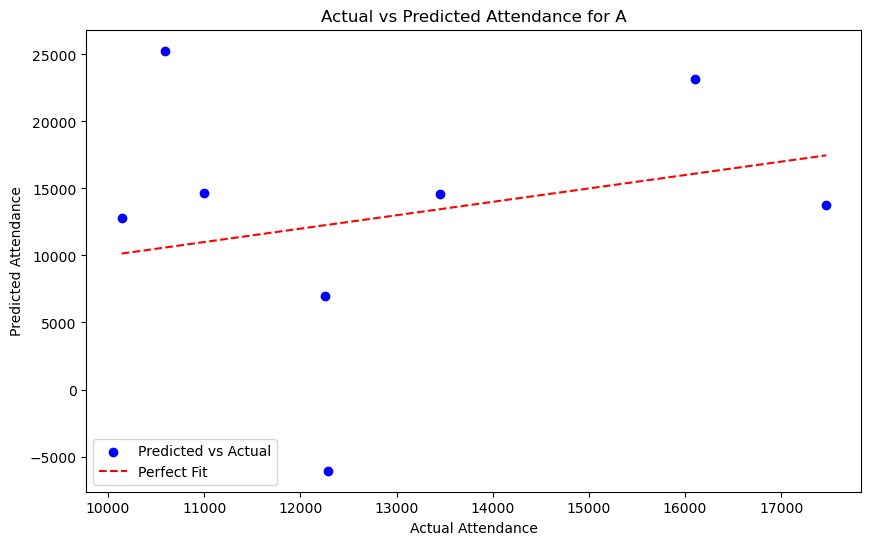

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.691
Model:                            OLS   Adj. R-squared:                 -0.595
Method:                 Least Squares   F-statistic:                    0.5374
Date:                Wed, 12 Mar 2025   Prob (F-statistic):              0.872
Time:                        12:50:29   Log-Likelihood:                 31.674
No. Observations:                  32   AIC:                            -11.35
Df Residuals:                       6   BIC:                             26.76
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

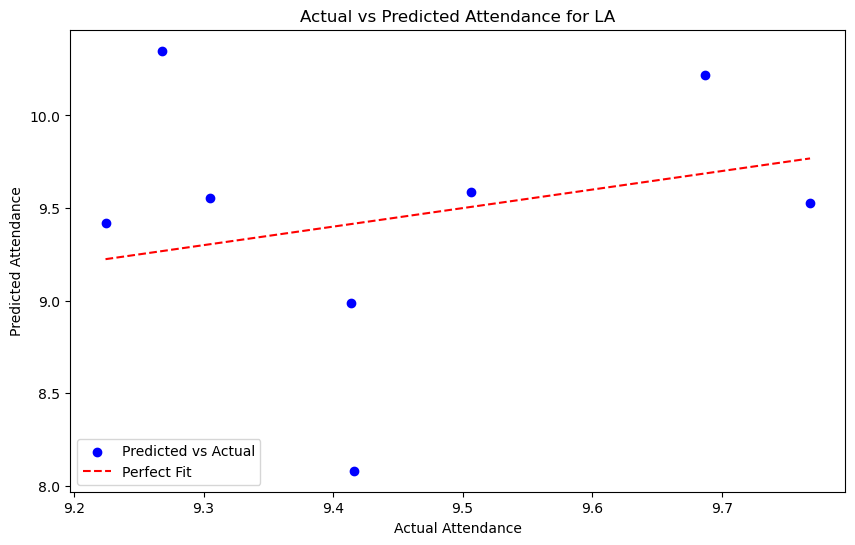

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.698
Model:                            OLS   Adj. R-squared:                 -0.558
Method:                 Least Squares   F-statistic:                    0.5560
Date:                Wed, 12 Mar 2025   Prob (F-statistic):              0.860
Time:                        12:50:29   Log-Likelihood:                 39.242
No. Observations:                  32   AIC:                            -26.48
Df Residuals:                       6   BIC:                             11.62
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

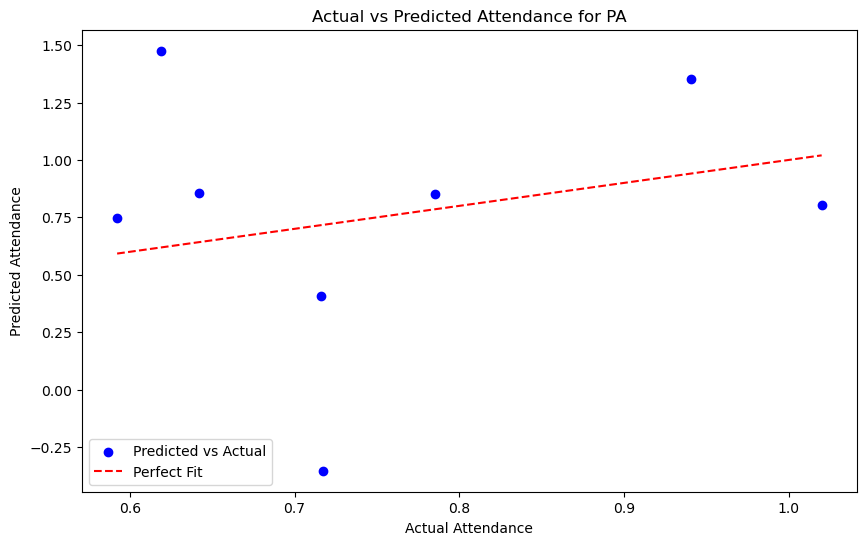

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.691
Model:                            OLS   Adj. R-squared:                 -0.595
Method:                 Least Squares   F-statistic:                    0.5374
Date:                Wed, 12 Mar 2025   Prob (F-statistic):              0.872
Time:                        12:50:29   Log-Likelihood:                 31.674
No. Observations:                  32   AIC:                            -11.35
Df Residuals:                       6   BIC:                             26.76
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

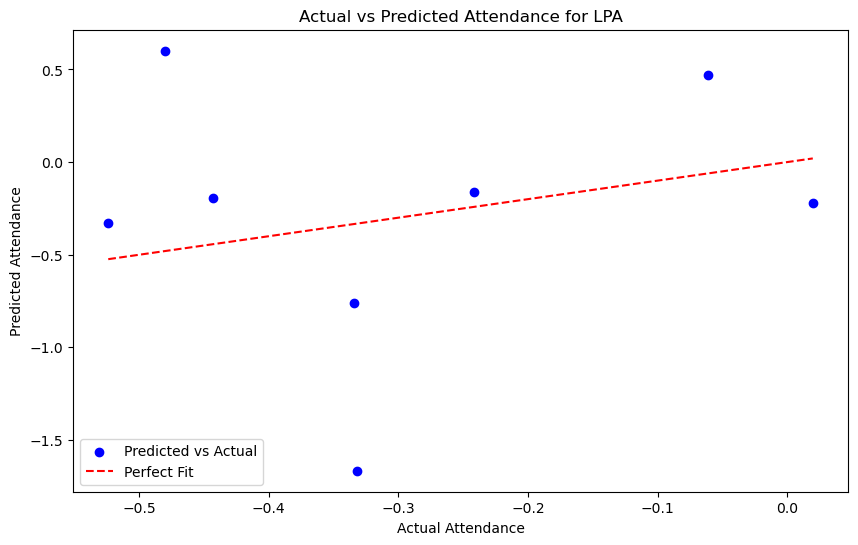

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.691
Model:                            OLS   Adj. R-squared:                 -0.595
Method:                 Least Squares   F-statistic:                    0.5374
Date:                Wed, 12 Mar 2025   Prob (F-statistic):              0.872
Time:                        12:50:29   Log-Likelihood:                 104.54
No. Observations:                  32   AIC:                            -157.1
Df Residuals:                       6   BIC:                            -119.0
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

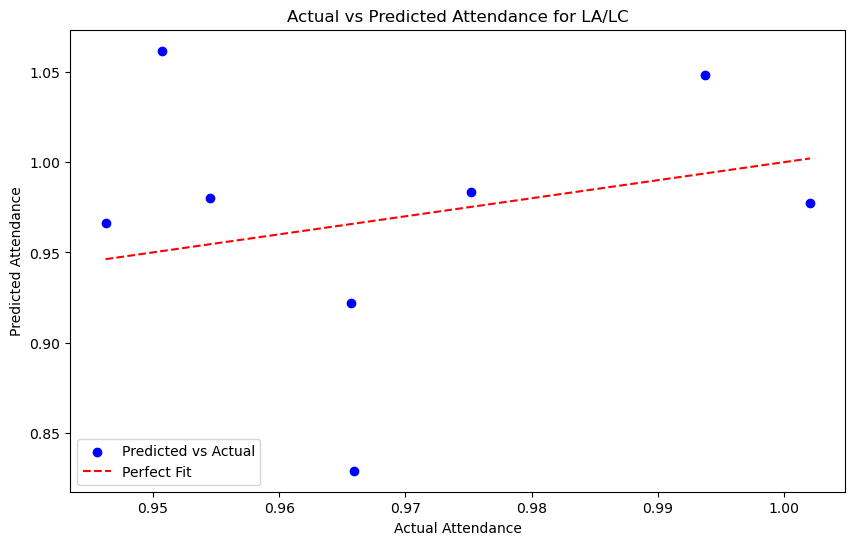


Running OLS for Pittsburgh Penguins
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.555
Model:                            OLS   Adj. R-squared:                  0.476
Method:                 Least Squares   F-statistic:                     7.003
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.75e-24
Time:                        12:50:30   Log-Likelihood:                -2136.9
No. Observations:                 292   AIC:                             4364.
Df Residuals:                     247   BIC:                             4529.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>

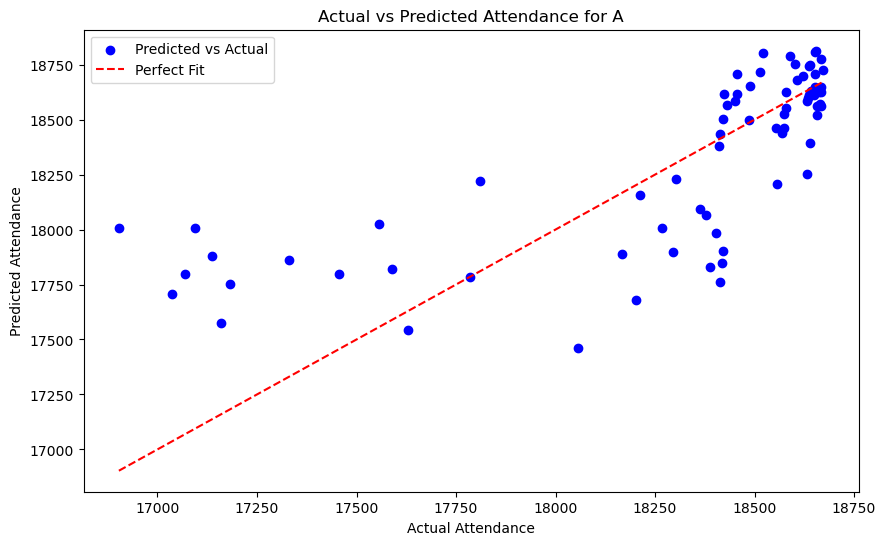

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.539
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     6.560
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.88e-23
Time:                        12:50:30   Log-Likelihood:                 711.20
No. Observations:                 292   AIC:                            -1332.
Df Residuals:                     247   BIC:                            -1167.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

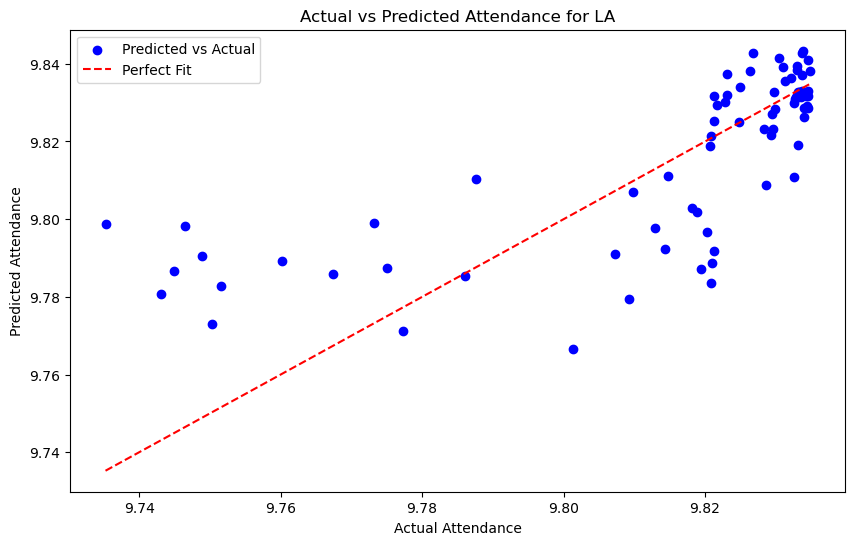

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.555
Model:                            OLS   Adj. R-squared:                  0.476
Method:                 Least Squares   F-statistic:                     7.003
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.75e-24
Time:                        12:50:30   Log-Likelihood:                 730.41
No. Observations:                 292   AIC:                            -1371.
Df Residuals:                     247   BIC:                            -1205.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

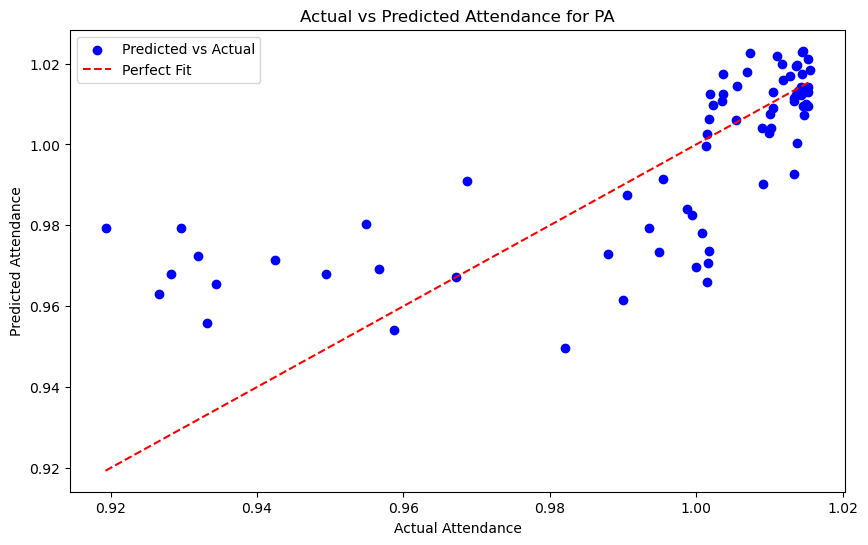

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.539
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     6.560
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.88e-23
Time:                        12:50:30   Log-Likelihood:                 711.20
No. Observations:                 292   AIC:                            -1332.
Df Residuals:                     247   BIC:                            -1167.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

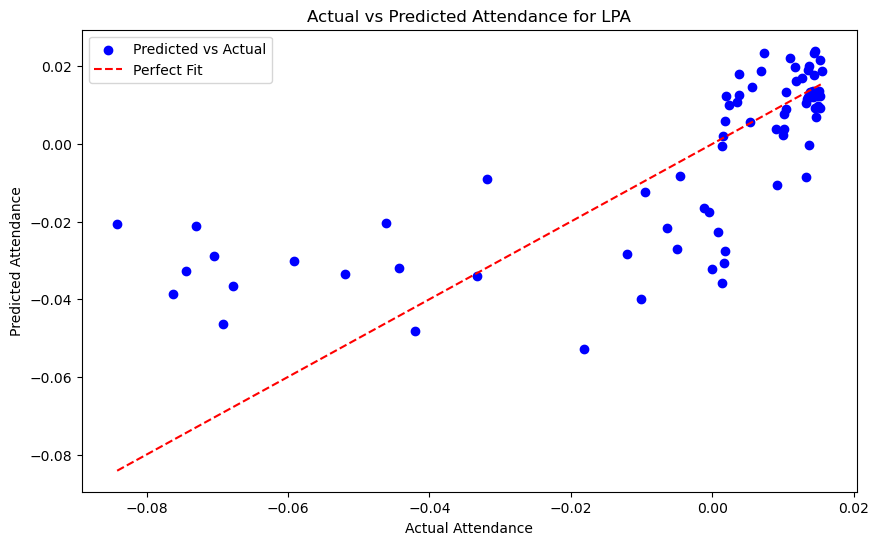

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.539
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     6.560
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.88e-23
Time:                        12:50:30   Log-Likelihood:                 1378.2
No. Observations:                 292   AIC:                            -2666.
Df Residuals:                     247   BIC:                            -2501.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

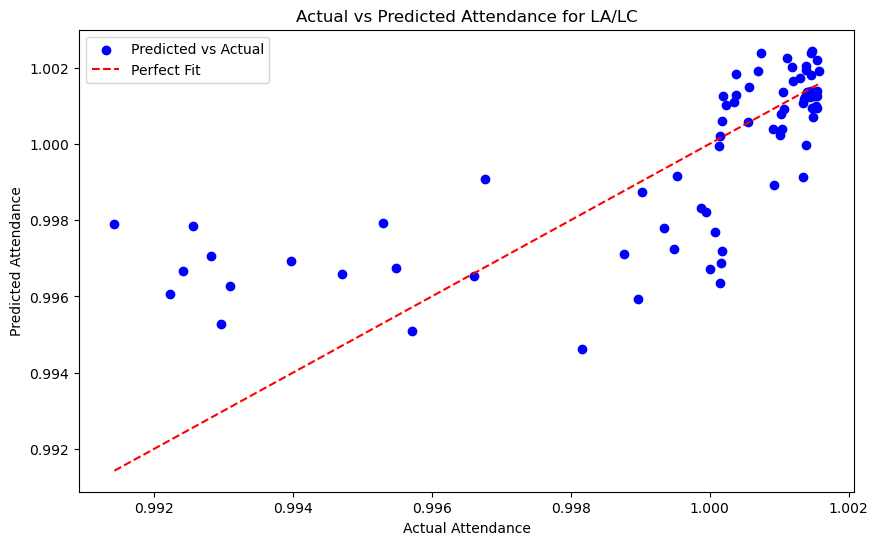


Running OLS for San Jose Sharks
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.748
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     16.50
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.07e-51
Time:                        12:50:30   Log-Likelihood:                -2471.2
No. Observations:                 290   AIC:                             5032.
Df Residuals:                     245   BIC:                             5198.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t| 

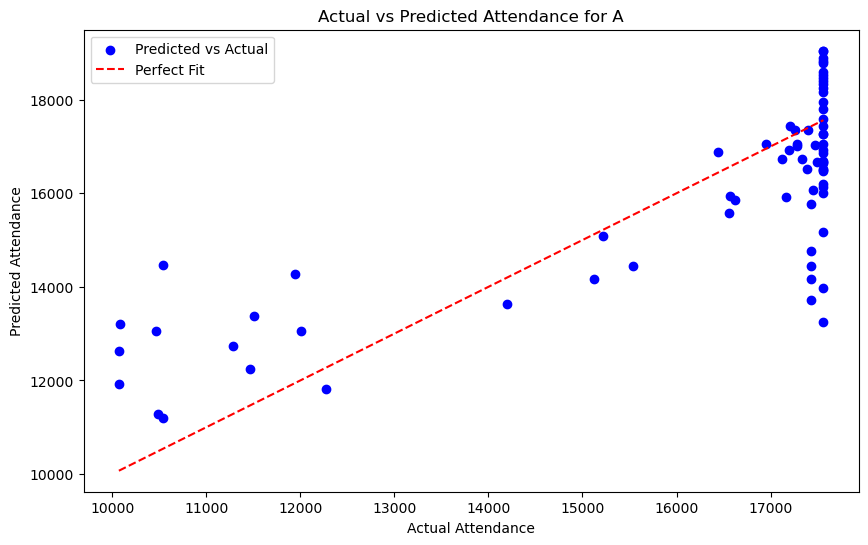

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.683
Method:                 Least Squares   F-statistic:                     15.18
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.31e-48
Time:                        12:50:31   Log-Likelihood:                 290.62
No. Observations:                 290   AIC:                            -491.2
Df Residuals:                     245   BIC:                            -326.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

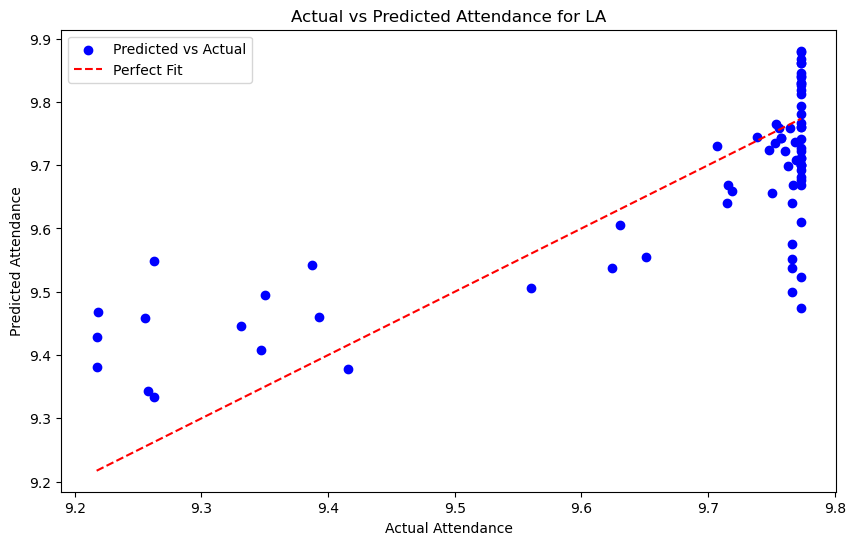

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.748
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     16.50
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.07e-51
Time:                        12:50:31   Log-Likelihood:                 360.97
No. Observations:                 290   AIC:                            -631.9
Df Residuals:                     245   BIC:                            -466.8
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

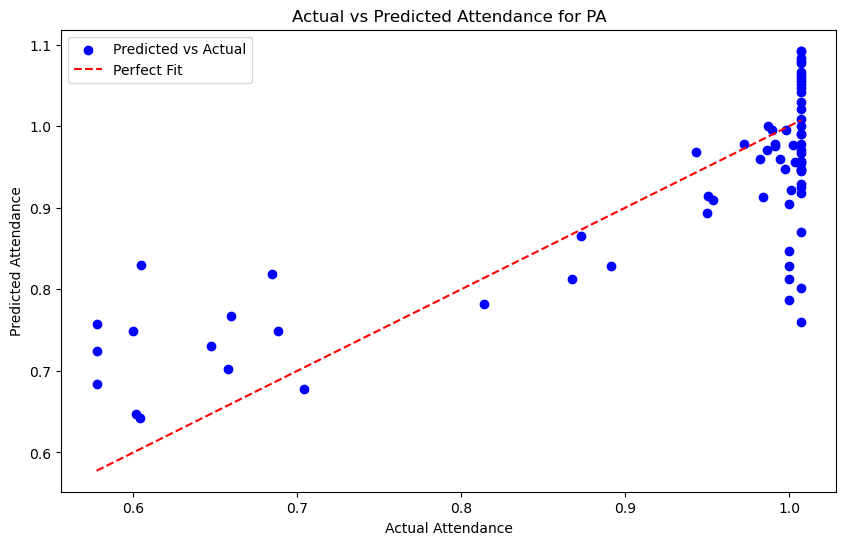

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.683
Method:                 Least Squares   F-statistic:                     15.18
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.31e-48
Time:                        12:50:31   Log-Likelihood:                 290.62
No. Observations:                 290   AIC:                            -491.2
Df Residuals:                     245   BIC:                            -326.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

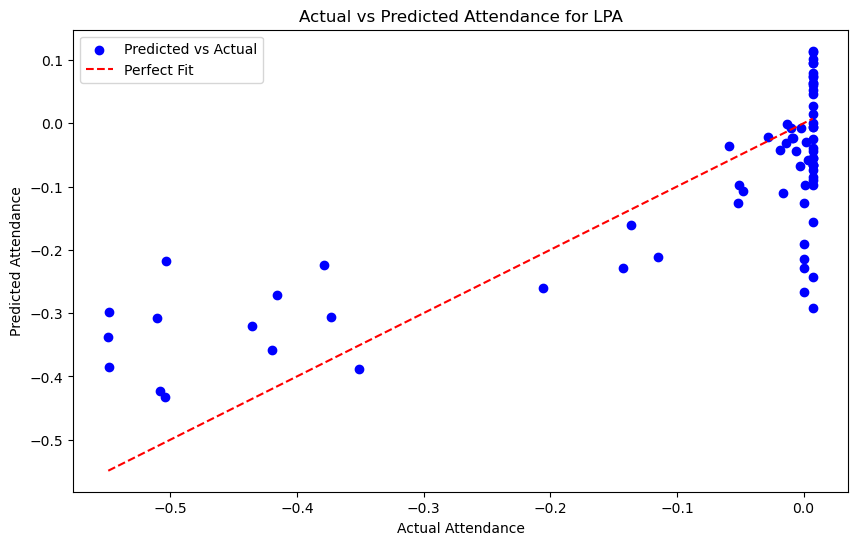

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.683
Method:                 Least Squares   F-statistic:                     15.18
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.31e-48
Time:                        12:50:31   Log-Likelihood:                 951.51
No. Observations:                 290   AIC:                            -1813.
Df Residuals:                     245   BIC:                            -1648.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

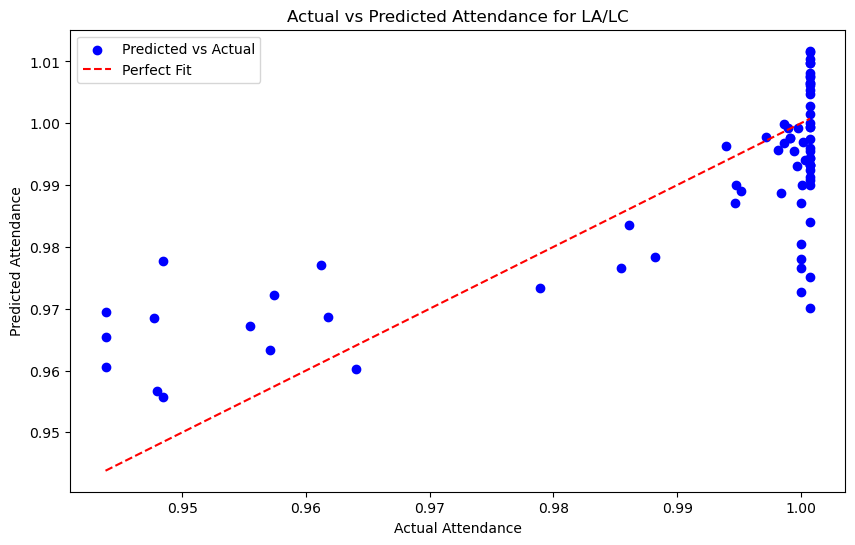


Running OLS for St. Louis Blues
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.346
Model:                            OLS   Adj. R-squared:                  0.230
Method:                 Least Squares   F-statistic:                     2.971
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.89e-08
Time:                        12:50:31   Log-Likelihood:                -2381.8
No. Observations:                 292   AIC:                             4854.
Df Residuals:                     247   BIC:                             5019.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t| 

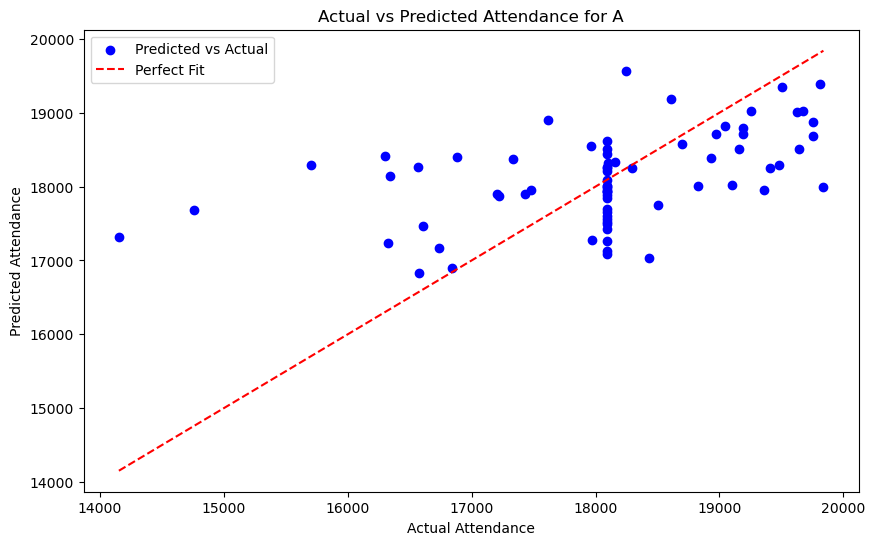

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.221
Method:                 Least Squares   F-statistic:                     2.879
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.22e-07
Time:                        12:50:32   Log-Likelihood:                 470.71
No. Observations:                 292   AIC:                            -851.4
Df Residuals:                     247   BIC:                            -686.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

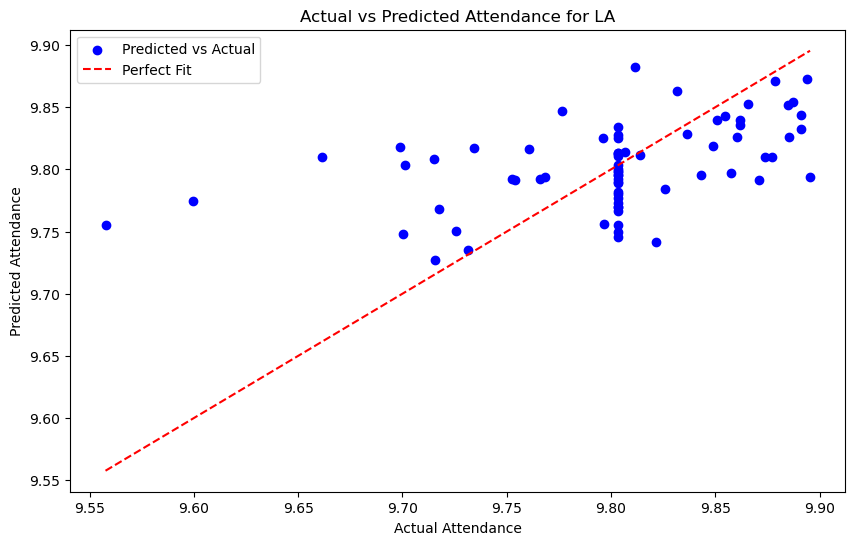

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.346
Model:                            OLS   Adj. R-squared:                  0.230
Method:                 Least Squares   F-statistic:                     2.971
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.89e-08
Time:                        12:50:32   Log-Likelihood:                 480.82
No. Observations:                 292   AIC:                            -871.6
Df Residuals:                     247   BIC:                            -706.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

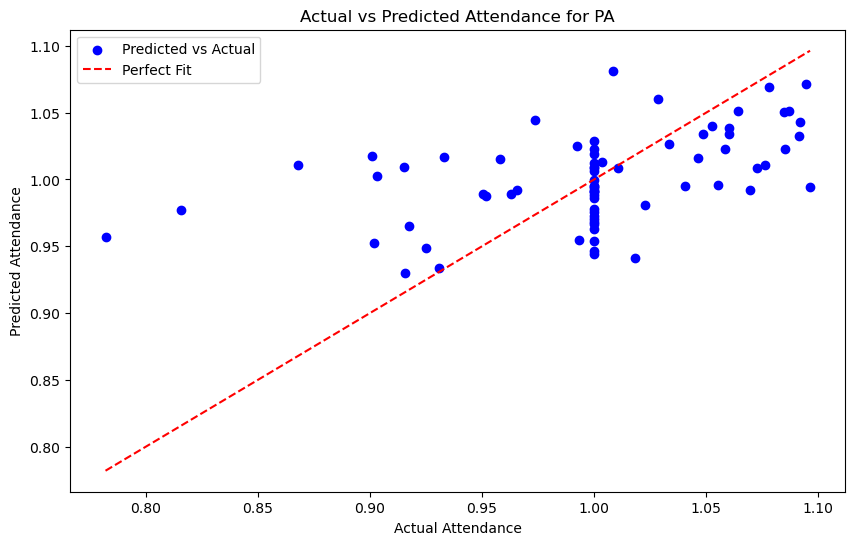

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.221
Method:                 Least Squares   F-statistic:                     2.879
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.22e-07
Time:                        12:50:32   Log-Likelihood:                 470.71
No. Observations:                 292   AIC:                            -851.4
Df Residuals:                     247   BIC:                            -686.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

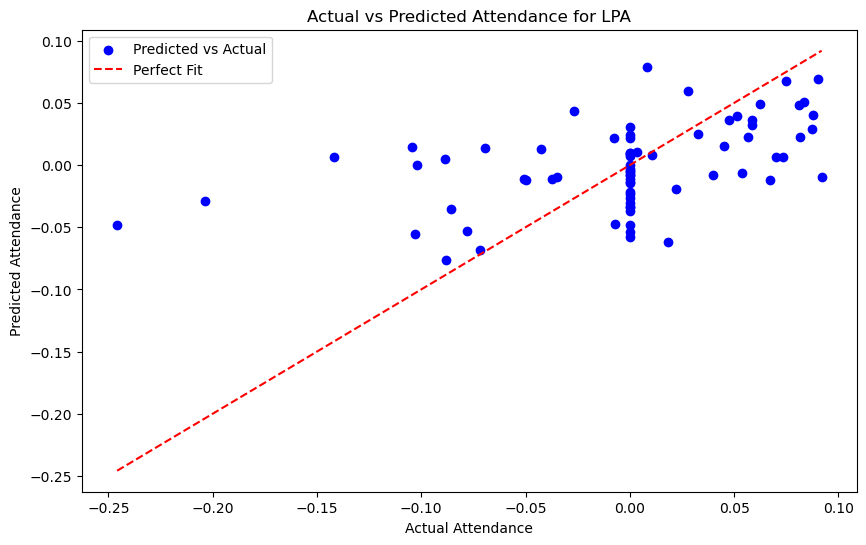

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.221
Method:                 Least Squares   F-statistic:                     2.879
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.22e-07
Time:                        12:50:32   Log-Likelihood:                 1137.3
No. Observations:                 292   AIC:                            -2185.
Df Residuals:                     247   BIC:                            -2019.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

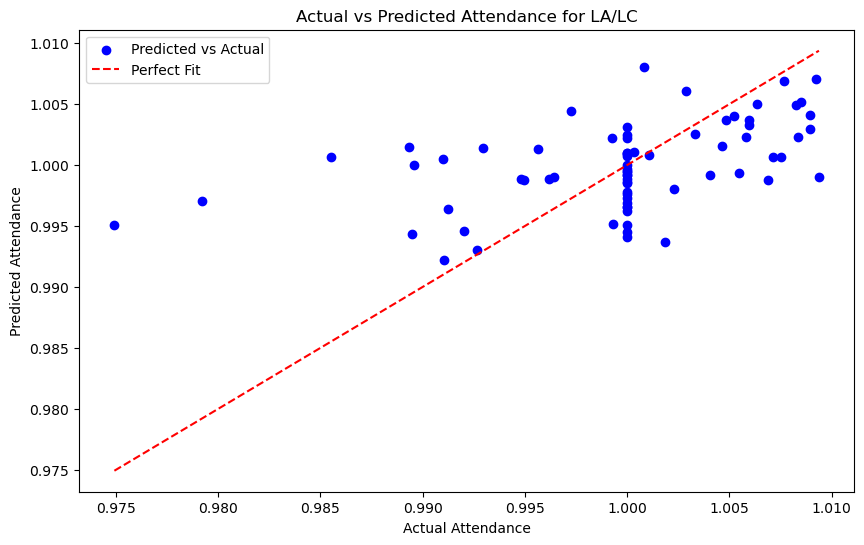


Running OLS for Washington Capitals
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.447
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     4.534
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           9.61e-15
Time:                        12:50:32   Log-Likelihood:                -2080.2
No. Observations:                 292   AIC:                             4250.
Df Residuals:                     247   BIC:                             4416.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>

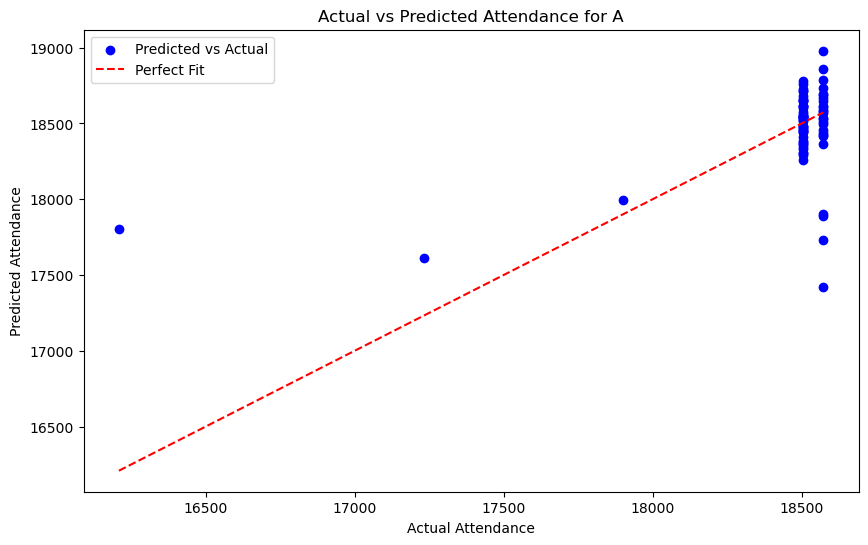

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.444
Model:                            OLS   Adj. R-squared:                  0.345
Method:                 Least Squares   F-statistic:                     4.491
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.47e-14
Time:                        12:50:33   Log-Likelihood:                 770.38
No. Observations:                 292   AIC:                            -1451.
Df Residuals:                     247   BIC:                            -1285.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

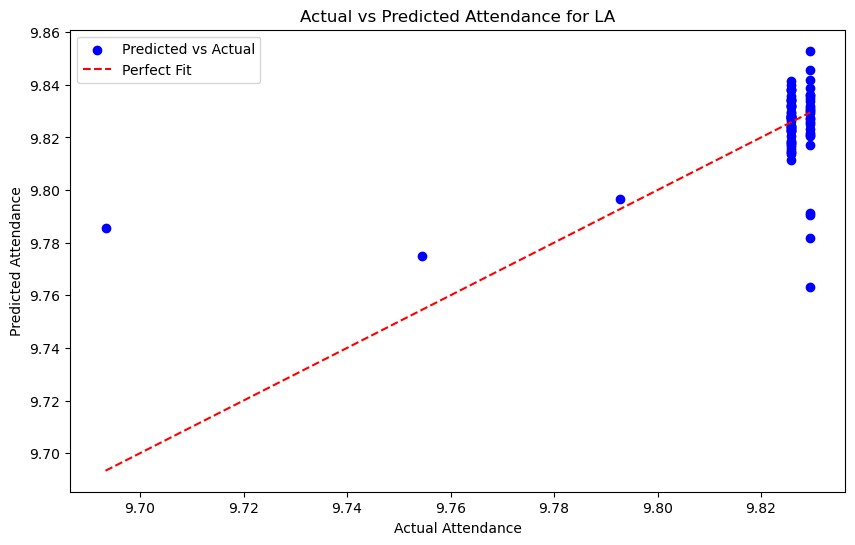

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.447
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     4.534
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           9.61e-15
Time:                        12:50:33   Log-Likelihood:                 789.99
No. Observations:                 292   AIC:                            -1490.
Df Residuals:                     247   BIC:                            -1325.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

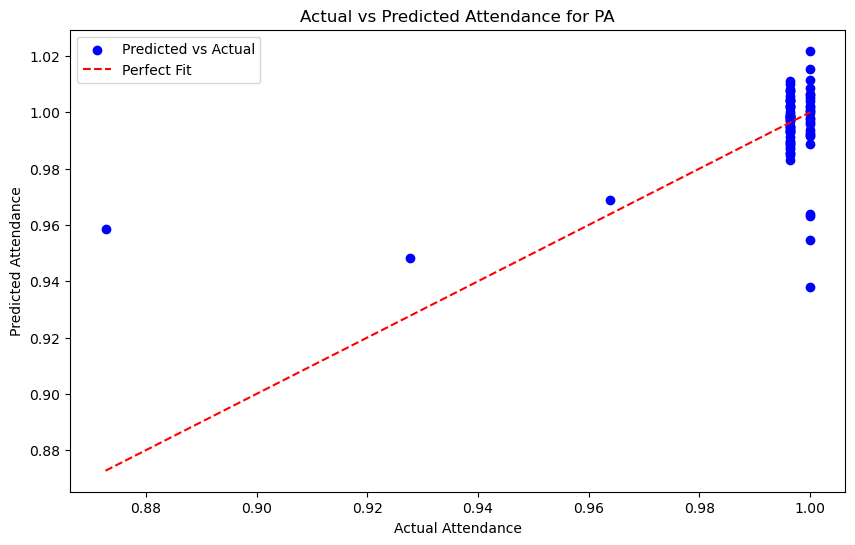

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.444
Model:                            OLS   Adj. R-squared:                  0.345
Method:                 Least Squares   F-statistic:                     4.491
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.47e-14
Time:                        12:50:33   Log-Likelihood:                 770.38
No. Observations:                 292   AIC:                            -1451.
Df Residuals:                     247   BIC:                            -1285.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

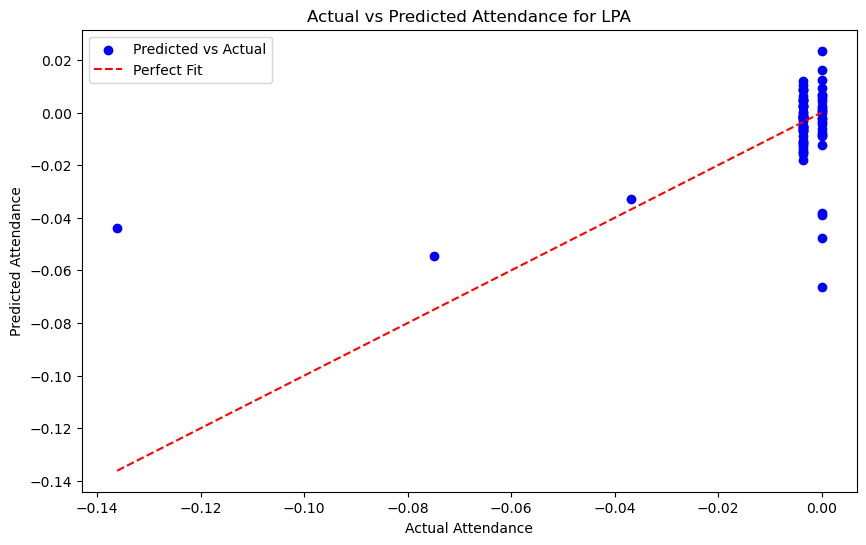

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.444
Model:                            OLS   Adj. R-squared:                  0.345
Method:                 Least Squares   F-statistic:                     4.491
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.47e-14
Time:                        12:50:33   Log-Likelihood:                 1437.7
No. Observations:                 292   AIC:                            -2785.
Df Residuals:                     247   BIC:                            -2620.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

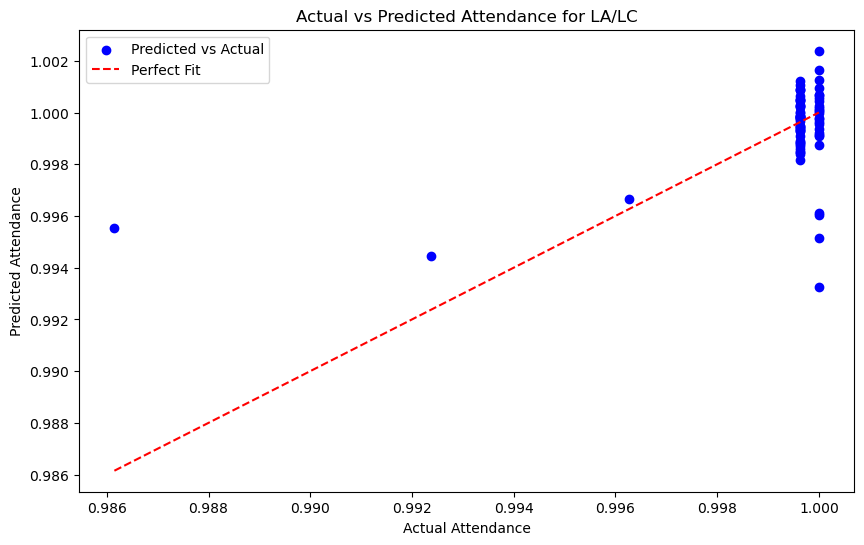


Running OLS for Buffalo Sabres
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     7.048
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.23e-23
Time:                        12:50:33   Log-Likelihood:                -2278.0
No. Observations:                 267   AIC:                             4646.
Df Residuals:                     222   BIC:                             4808.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|  

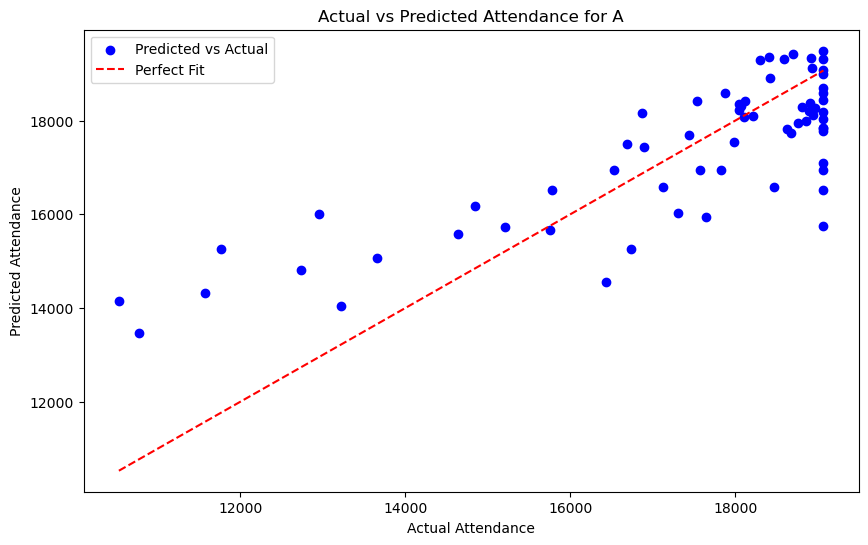

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.579
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     6.944
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.83e-23
Time:                        12:50:33   Log-Likelihood:                 299.03
No. Observations:                 267   AIC:                            -508.1
Df Residuals:                     222   BIC:                            -346.6
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

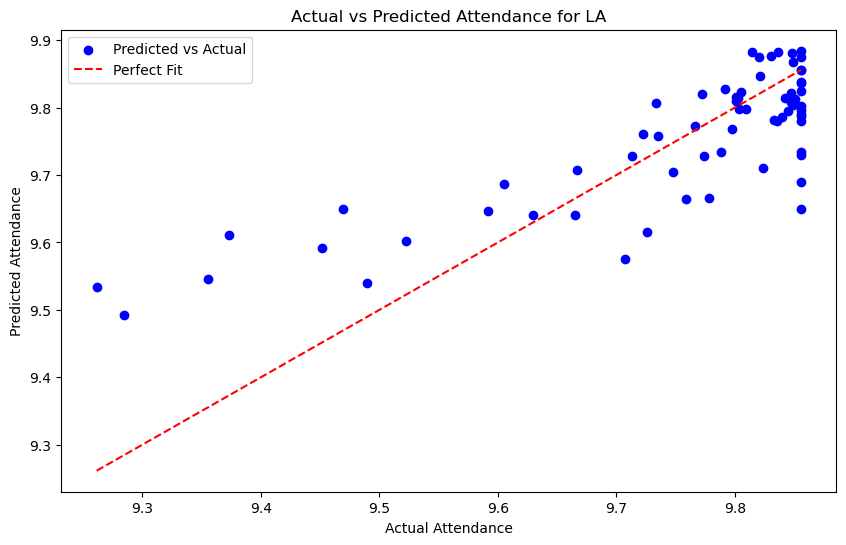

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     7.048
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.23e-23
Time:                        12:50:34   Log-Likelihood:                 353.48
No. Observations:                 267   AIC:                            -617.0
Df Residuals:                     222   BIC:                            -455.5
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

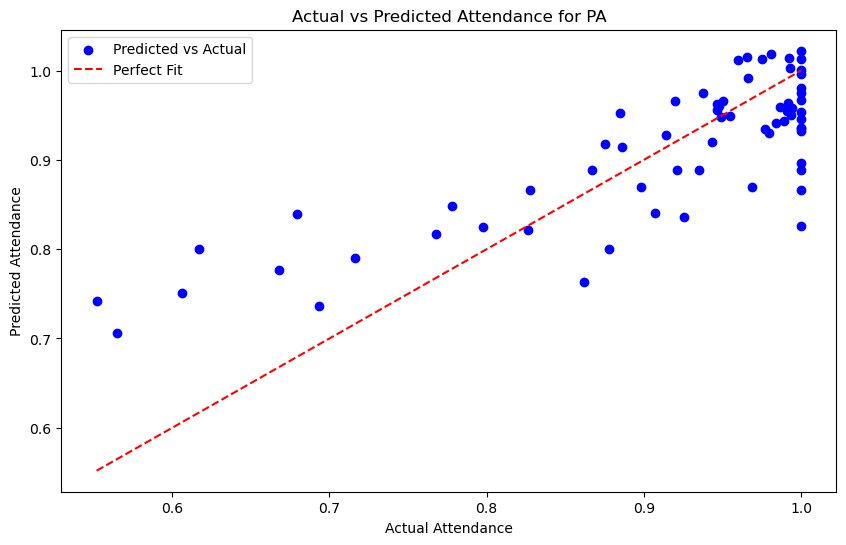

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.579
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     6.944
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.83e-23
Time:                        12:50:34   Log-Likelihood:                 299.03
No. Observations:                 267   AIC:                            -508.1
Df Residuals:                     222   BIC:                            -346.6
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

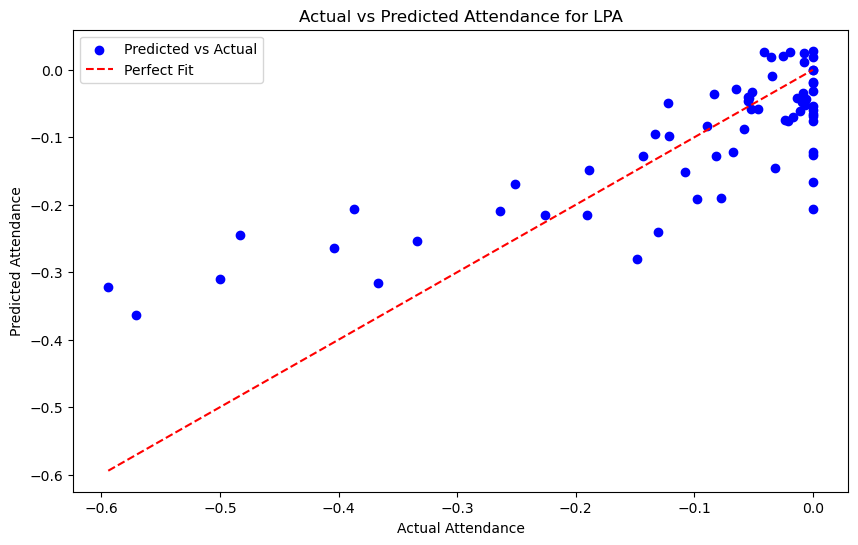

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.579
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     6.944
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.83e-23
Time:                        12:50:34   Log-Likelihood:                 909.95
No. Observations:                 267   AIC:                            -1730.
Df Residuals:                     222   BIC:                            -1568.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

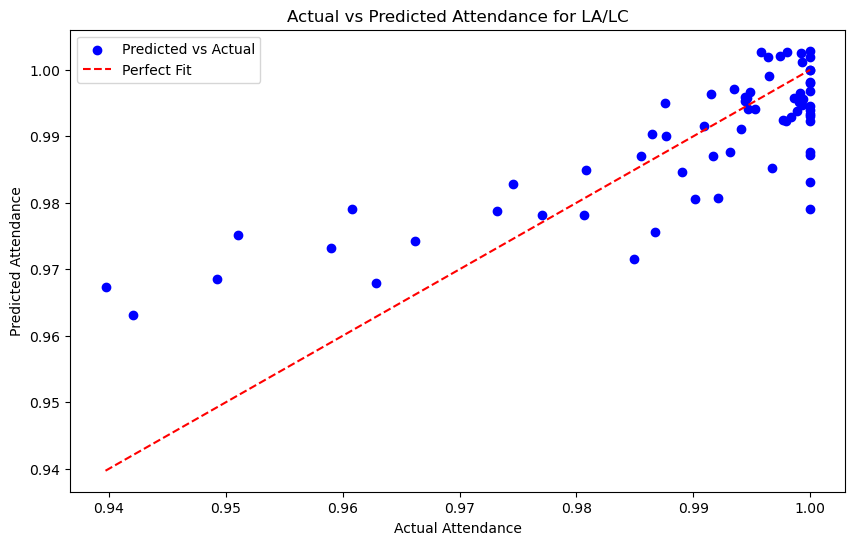


Running OLS for Carolina Hurricanes
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.705
Model:                            OLS   Adj. R-squared:                  0.648
Method:                 Least Squares   F-statistic:                     12.40
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.89e-40
Time:                        12:50:34   Log-Likelihood:                -2406.0
No. Observations:                 273   AIC:                             4902.
Df Residuals:                     228   BIC:                             5064.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>

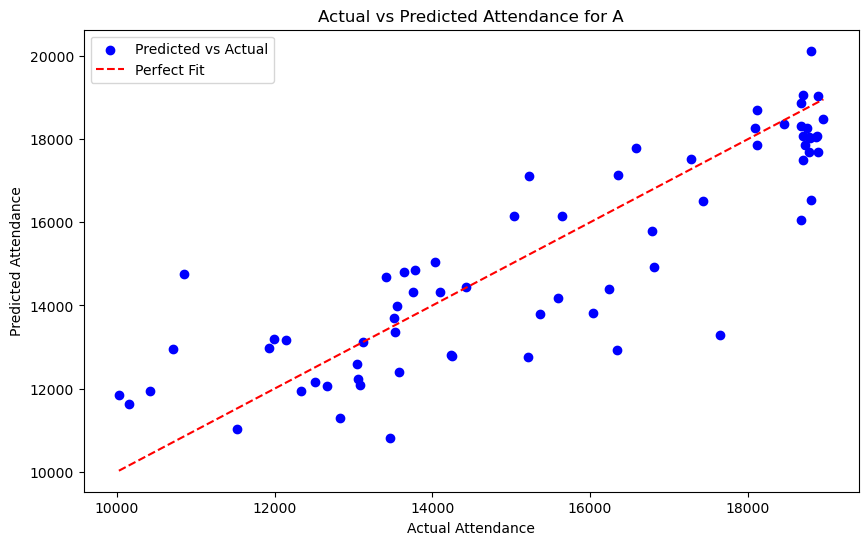

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     11.23
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           6.58e-37
Time:                        12:50:34   Log-Likelihood:                 201.78
No. Observations:                 273   AIC:                            -313.6
Df Residuals:                     228   BIC:                            -151.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

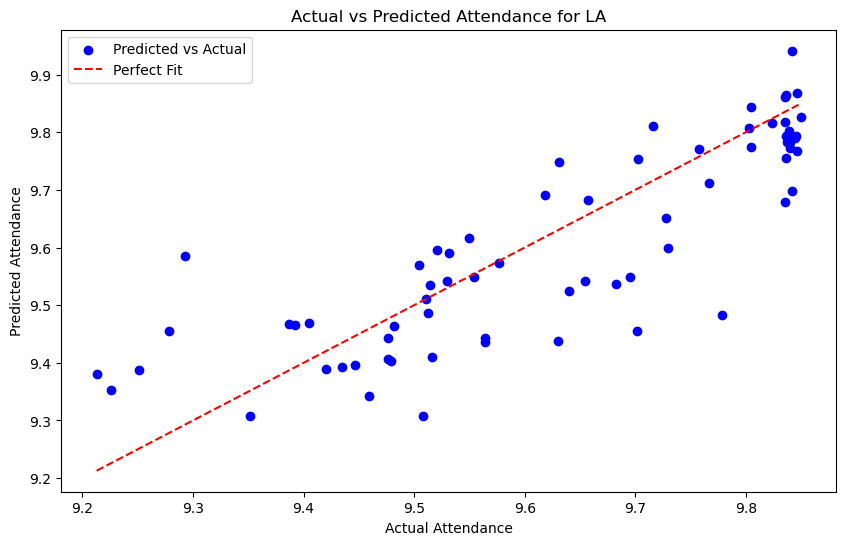

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.705
Model:                            OLS   Adj. R-squared:                  0.648
Method:                 Least Squares   F-statistic:                     12.40
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.89e-40
Time:                        12:50:34   Log-Likelihood:                 279.27
No. Observations:                 273   AIC:                            -468.5
Df Residuals:                     228   BIC:                            -306.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

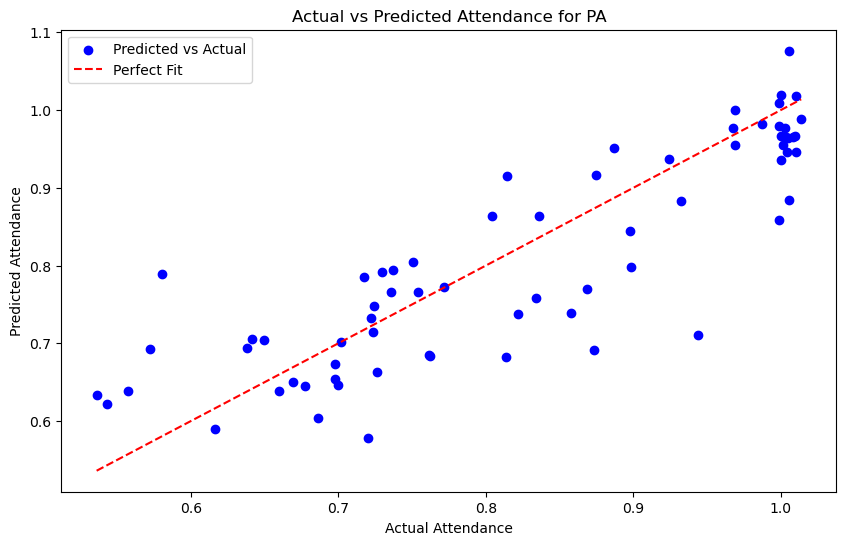

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     11.23
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           6.58e-37
Time:                        12:50:35   Log-Likelihood:                 201.78
No. Observations:                 273   AIC:                            -313.6
Df Residuals:                     228   BIC:                            -151.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

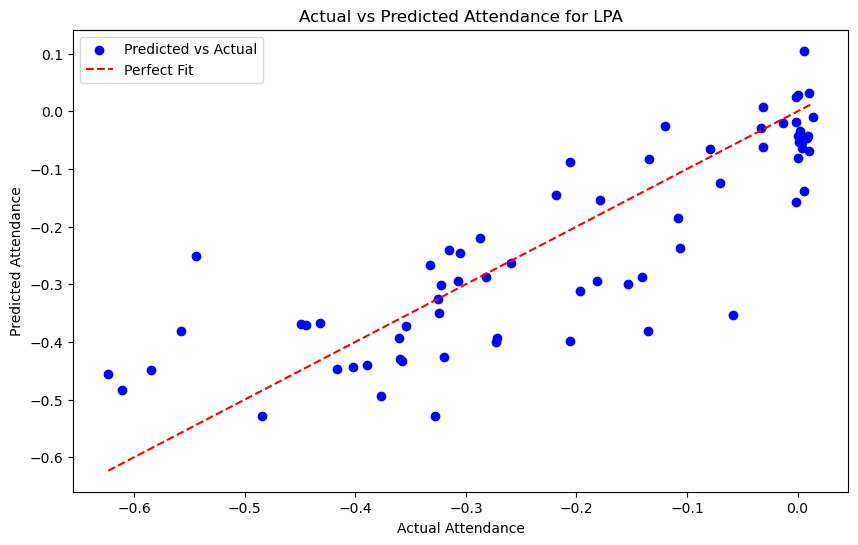

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     11.23
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           6.58e-37
Time:                        12:50:35   Log-Likelihood:                 825.88
No. Observations:                 273   AIC:                            -1562.
Df Residuals:                     228   BIC:                            -1399.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

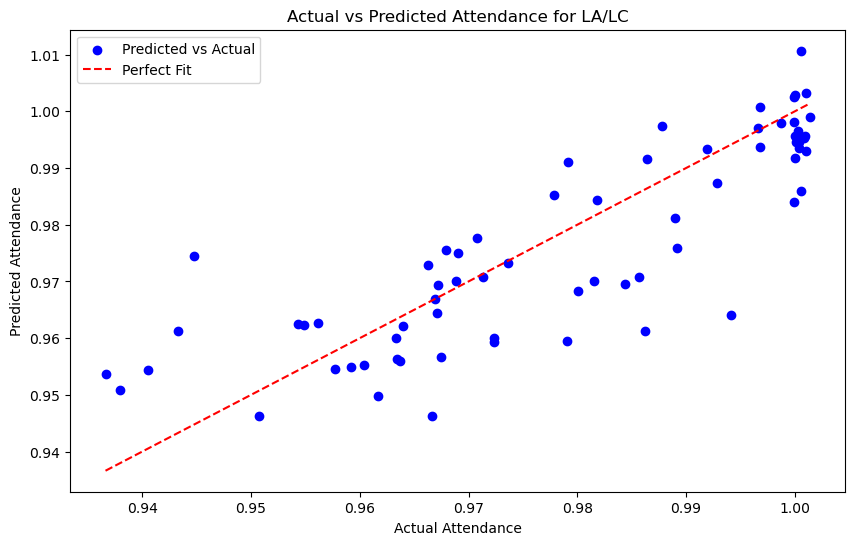


Running OLS for Columbus Blue Jackets
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.480
Model:                            OLS   Adj. R-squared:                  0.388
Method:                 Least Squares   F-statistic:                     5.188
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.90e-17
Time:                        12:50:35   Log-Likelihood:                -2551.0
No. Observations:                 292   AIC:                             5192.
Df Residuals:                     247   BIC:                             5358.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      

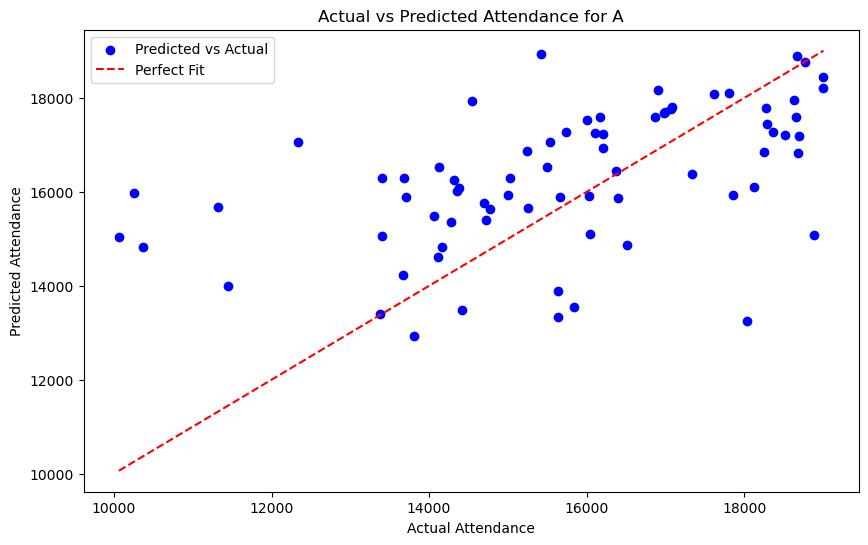

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.476
Model:                            OLS   Adj. R-squared:                  0.382
Method:                 Least Squares   F-statistic:                     5.094
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.60e-17
Time:                        12:50:35   Log-Likelihood:                 262.72
No. Observations:                 292   AIC:                            -435.4
Df Residuals:                     247   BIC:                            -270.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

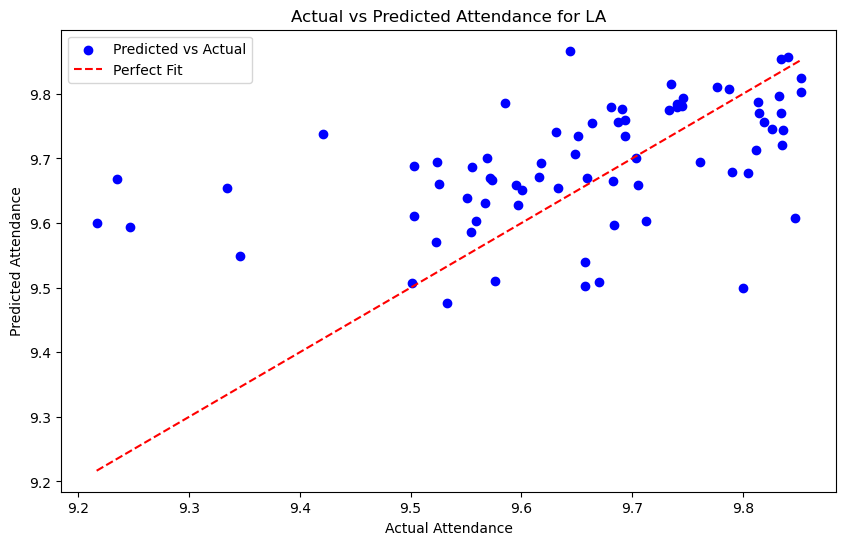

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.480
Model:                            OLS   Adj. R-squared:                  0.388
Method:                 Least Squares   F-statistic:                     5.188
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.90e-17
Time:                        12:50:35   Log-Likelihood:                 312.35
No. Observations:                 292   AIC:                            -534.7
Df Residuals:                     247   BIC:                            -369.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

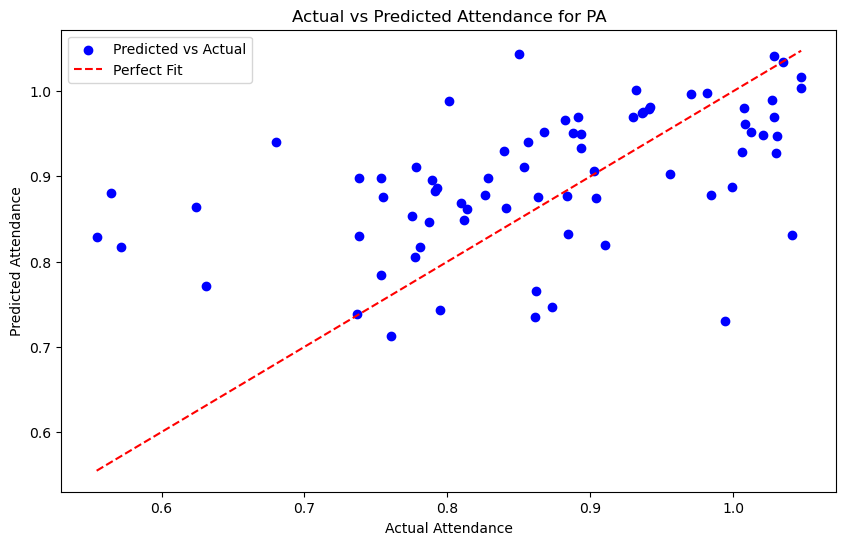

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.476
Model:                            OLS   Adj. R-squared:                  0.382
Method:                 Least Squares   F-statistic:                     5.094
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.60e-17
Time:                        12:50:35   Log-Likelihood:                 262.72
No. Observations:                 292   AIC:                            -435.4
Df Residuals:                     247   BIC:                            -270.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

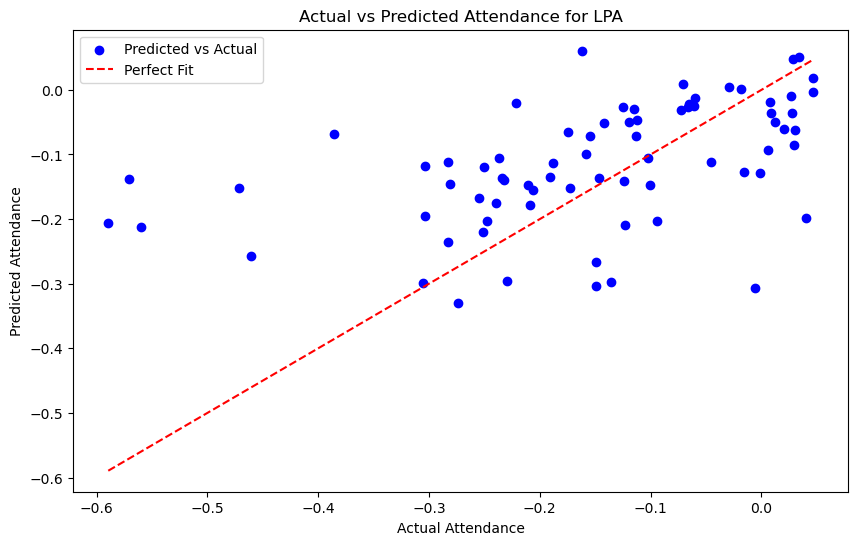

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.476
Model:                            OLS   Adj. R-squared:                  0.382
Method:                 Least Squares   F-statistic:                     5.094
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.60e-17
Time:                        12:50:35   Log-Likelihood:                 929.35
No. Observations:                 292   AIC:                            -1769.
Df Residuals:                     247   BIC:                            -1603.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

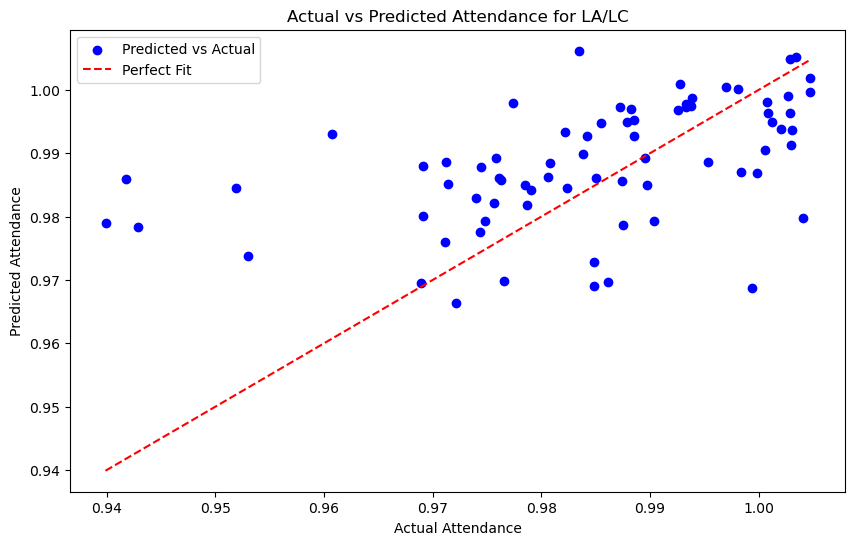


Running OLS for New Jersey Devils
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     3.853
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.76e-12
Time:                        12:50:36   Log-Likelihood:                -2488.5
No. Observations:                 291   AIC:                             5067.
Df Residuals:                     246   BIC:                             5232.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t

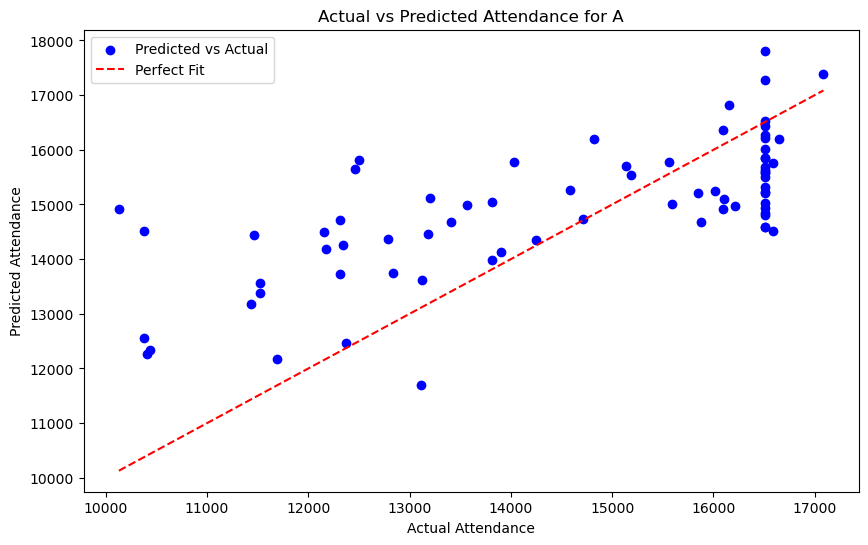

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     3.849
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           8.08e-12
Time:                        12:50:36   Log-Likelihood:                 292.33
No. Observations:                 291   AIC:                            -494.7
Df Residuals:                     246   BIC:                            -329.4
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

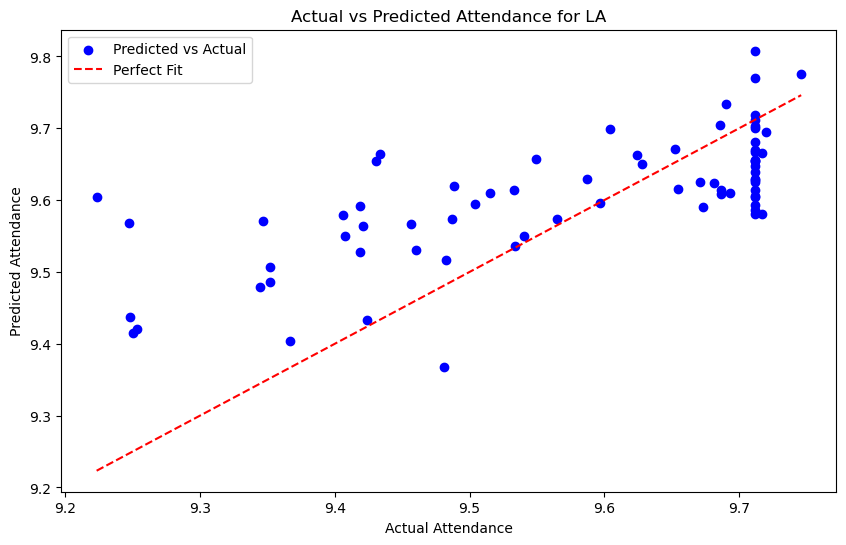

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     3.853
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.76e-12
Time:                        12:50:36   Log-Likelihood:                 337.67
No. Observations:                 291   AIC:                            -585.3
Df Residuals:                     246   BIC:                            -420.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

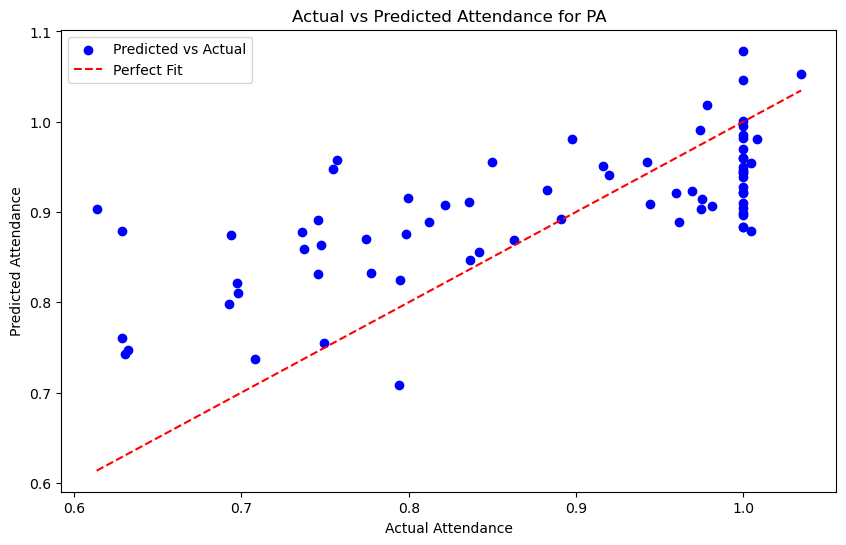

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     3.849
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           8.08e-12
Time:                        12:50:36   Log-Likelihood:                 292.33
No. Observations:                 291   AIC:                            -494.7
Df Residuals:                     246   BIC:                            -329.4
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

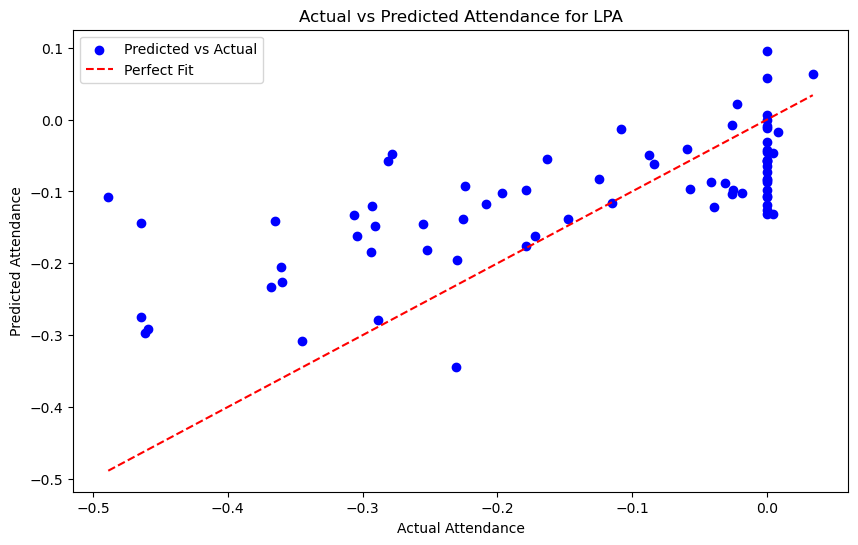

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     3.849
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           8.08e-12
Time:                        12:50:36   Log-Likelihood:                 953.88
No. Observations:                 291   AIC:                            -1818.
Df Residuals:                     246   BIC:                            -1652.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

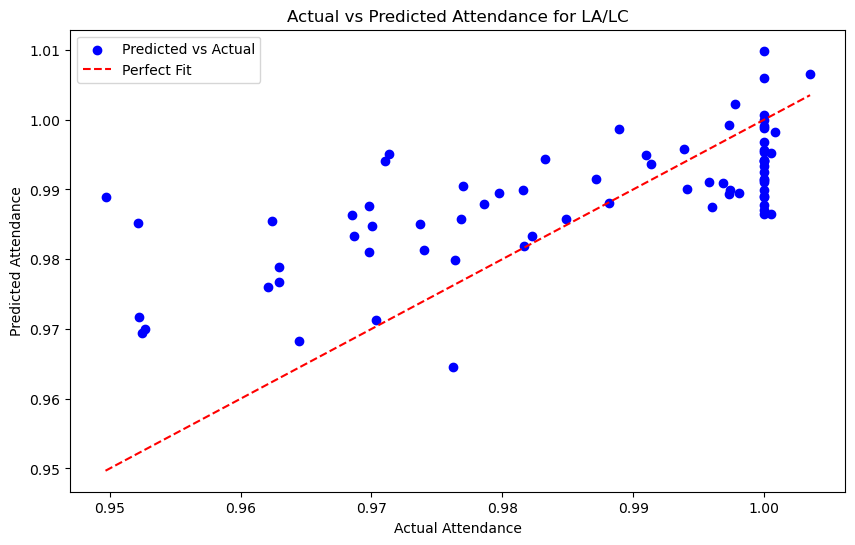


Running OLS for Winnipeg Jets
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.694
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     12.47
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.96e-41
Time:                        12:50:37   Log-Likelihood:                -2194.5
No. Observations:                 287   AIC:                             4479.
Df Residuals:                     242   BIC:                             4644.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|   

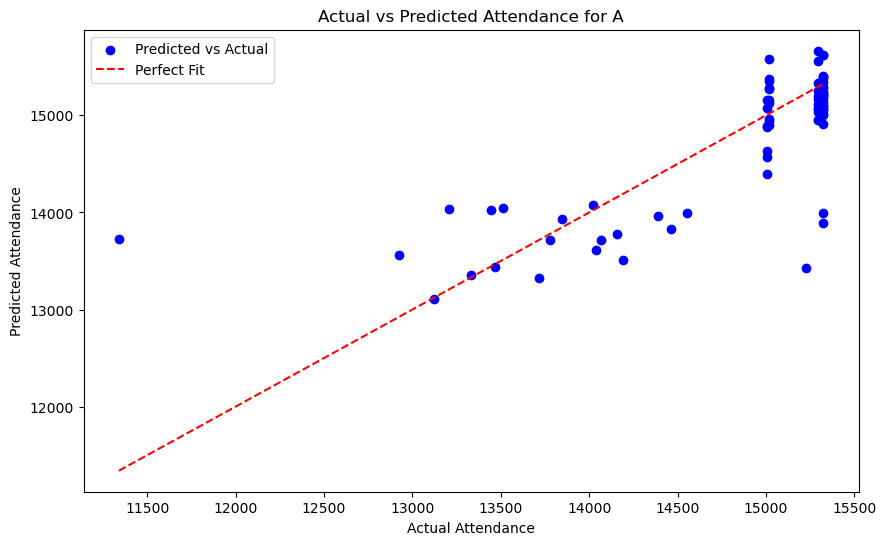

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     11.44
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.48e-38
Time:                        12:50:37   Log-Likelihood:                 533.05
No. Observations:                 287   AIC:                            -976.1
Df Residuals:                     242   BIC:                            -811.4
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

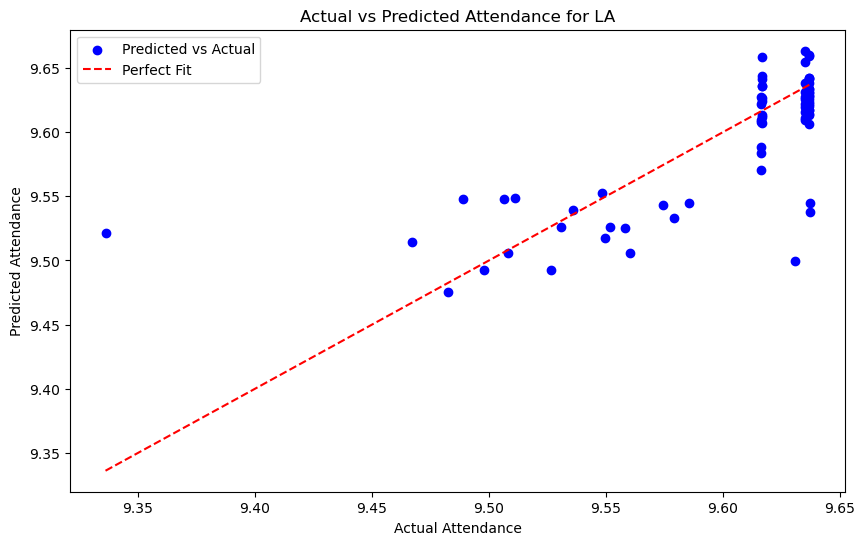

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.694
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     12.47
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.96e-41
Time:                        12:50:37   Log-Likelihood:                 571.31
No. Observations:                 287   AIC:                            -1053.
Df Residuals:                     242   BIC:                            -887.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

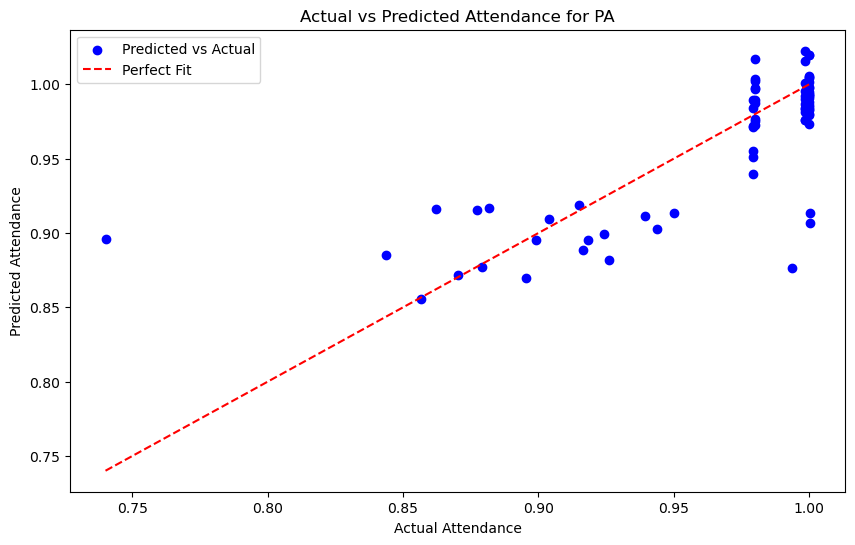

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     11.44
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.48e-38
Time:                        12:50:37   Log-Likelihood:                 533.05
No. Observations:                 287   AIC:                            -976.1
Df Residuals:                     242   BIC:                            -811.4
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

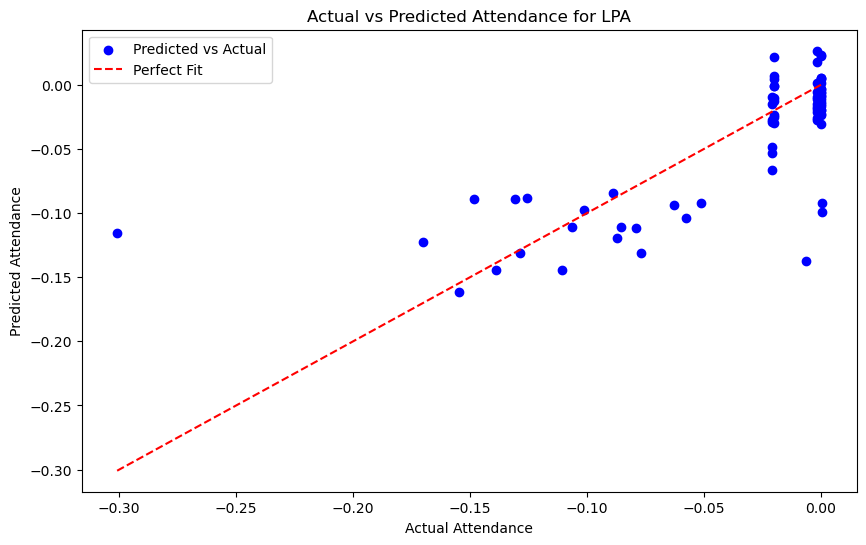

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     11.44
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.48e-38
Time:                        12:50:37   Log-Likelihood:                 1183.3
No. Observations:                 287   AIC:                            -2277.
Df Residuals:                     242   BIC:                            -2112.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

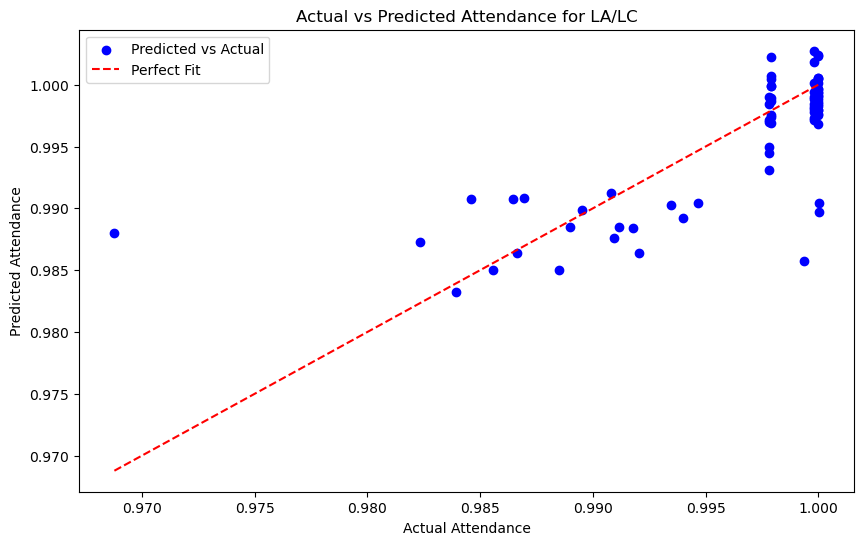


Running OLS for New York Islanders
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.731
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                     13.77
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.33e-43
Time:                        12:50:37   Log-Likelihood:                -2270.1
No. Observations:                 268   AIC:                             4630.
Df Residuals:                     223   BIC:                             4792.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

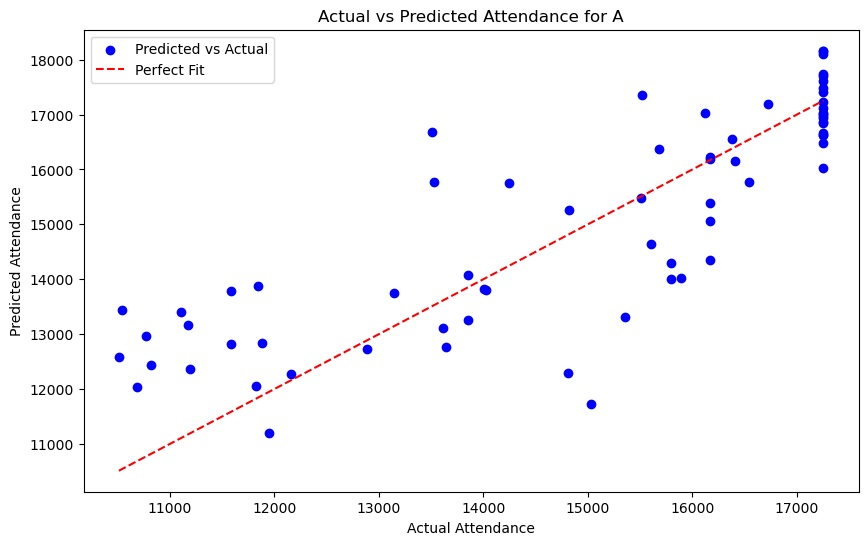

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.650
Method:                 Least Squares   F-statistic:                     12.27
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.83e-39
Time:                        12:50:37   Log-Likelihood:                 276.29
No. Observations:                 268   AIC:                            -462.6
Df Residuals:                     223   BIC:                            -301.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

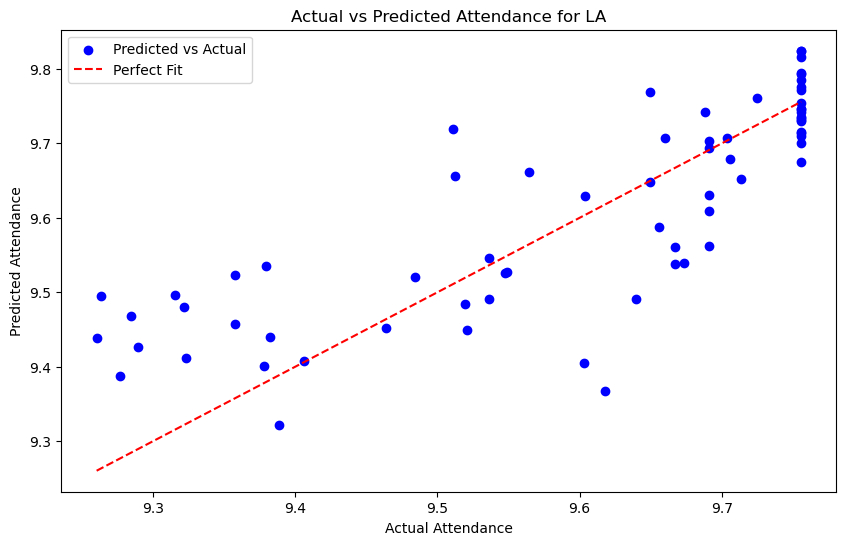

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.614
Method:                 Least Squares   F-statistic:                     10.64
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           6.82e-35
Time:                        12:50:38   Log-Likelihood:                 309.39
No. Observations:                 268   AIC:                            -528.8
Df Residuals:                     223   BIC:                            -367.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

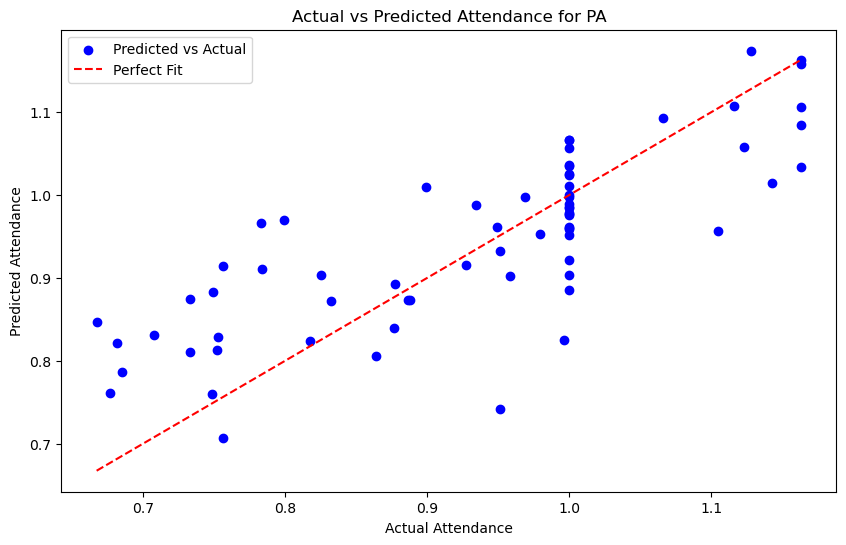

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.668
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                     10.21
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.13e-33
Time:                        12:50:38   Log-Likelihood:                 276.29
No. Observations:                 268   AIC:                            -462.6
Df Residuals:                     223   BIC:                            -301.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

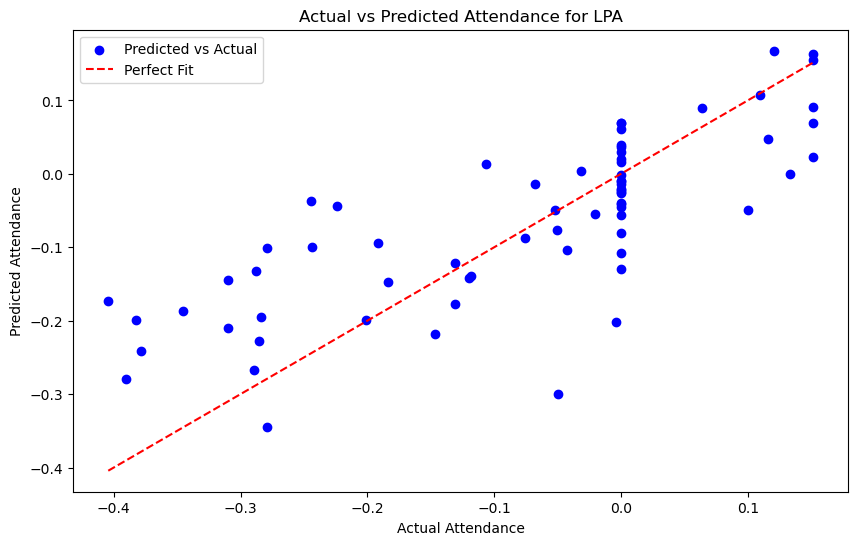

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.668
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     10.19
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.35e-33
Time:                        12:50:38   Log-Likelihood:                 883.21
No. Observations:                 268   AIC:                            -1676.
Df Residuals:                     223   BIC:                            -1515.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

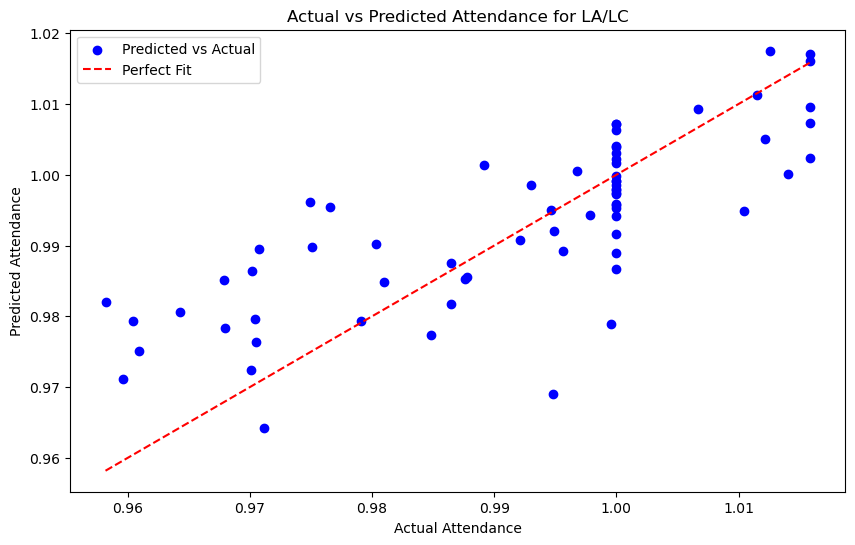


Running OLS for Toronto Maple Leafs
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     10.66
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.05e-36
Time:                        12:50:38   Log-Likelihood:                -1963.4
No. Observations:                 286   AIC:                             4017.
Df Residuals:                     241   BIC:                             4181.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>

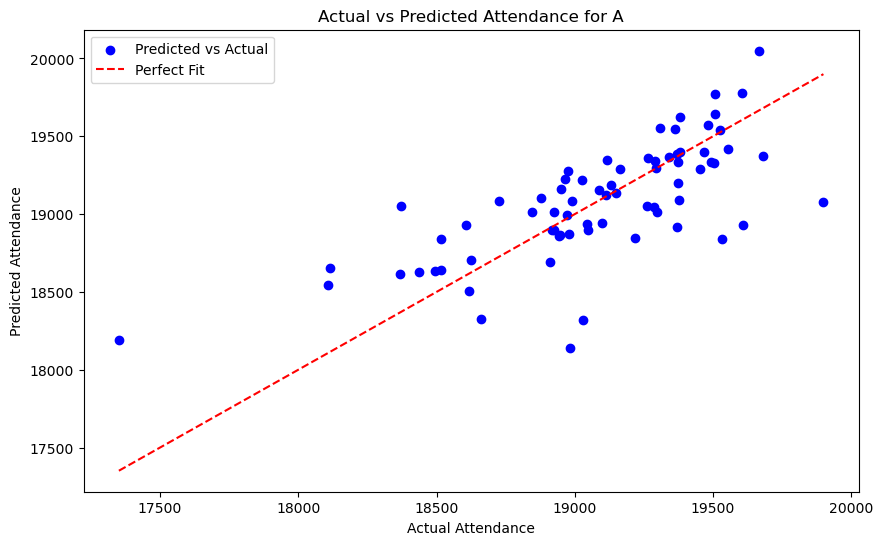

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.595
Method:                 Least Squares   F-statistic:                     10.53
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.34e-36
Time:                        12:50:38   Log-Likelihood:                 851.28
No. Observations:                 286   AIC:                            -1613.
Df Residuals:                     241   BIC:                            -1448.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

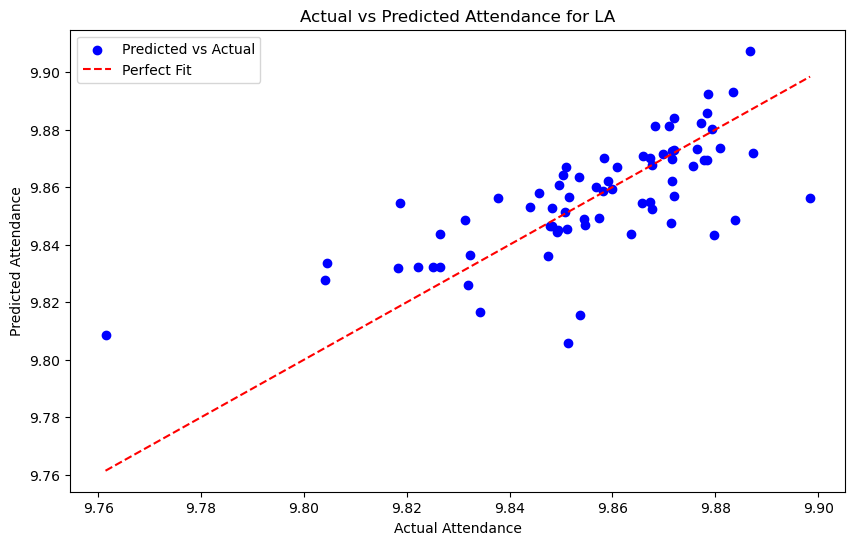

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     10.66
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.05e-36
Time:                        12:50:38   Log-Likelihood:                 851.33
No. Observations:                 286   AIC:                            -1613.
Df Residuals:                     241   BIC:                            -1448.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

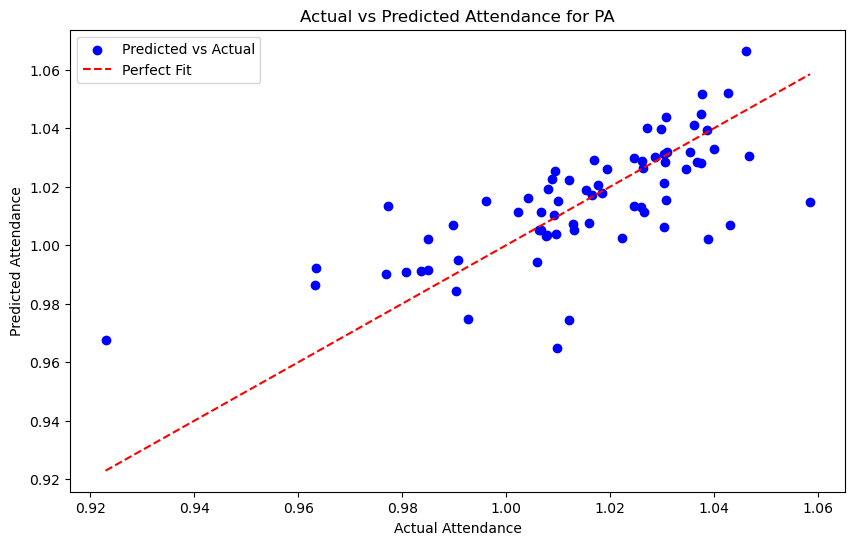

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.595
Method:                 Least Squares   F-statistic:                     10.53
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.34e-36
Time:                        12:50:38   Log-Likelihood:                 851.28
No. Observations:                 286   AIC:                            -1613.
Df Residuals:                     241   BIC:                            -1448.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

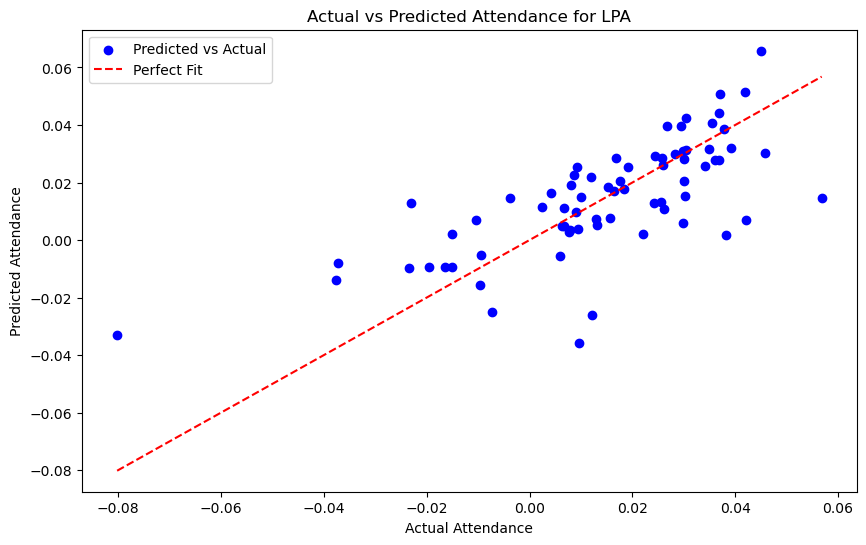

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.595
Method:                 Least Squares   F-statistic:                     10.53
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.34e-36
Time:                        12:50:39   Log-Likelihood:                 1505.2
No. Observations:                 286   AIC:                            -2920.
Df Residuals:                     241   BIC:                            -2756.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

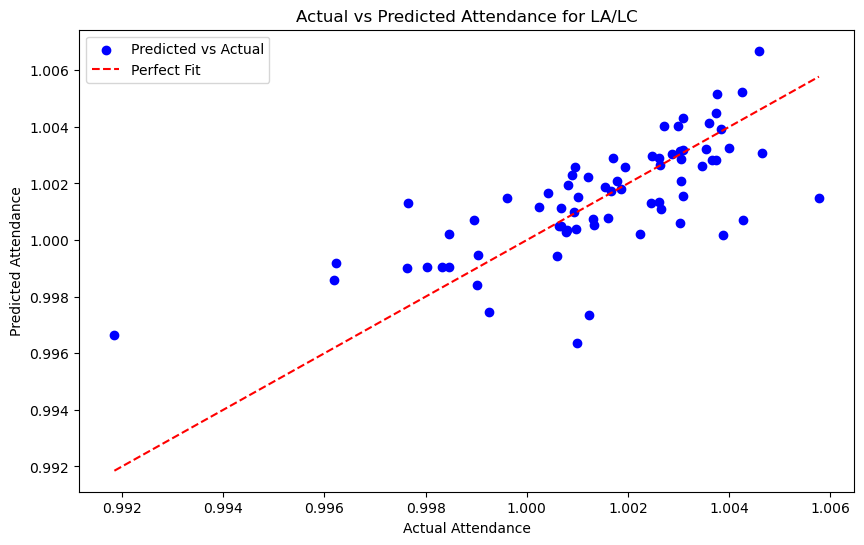


Running OLS for Vancouver Canucks
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.364
Method:                 Least Squares   F-statistic:                     4.714
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.24e-15
Time:                        12:50:39   Log-Likelihood:                -2097.2
No. Observations:                 286   AIC:                             4284.
Df Residuals:                     241   BIC:                             4449.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t

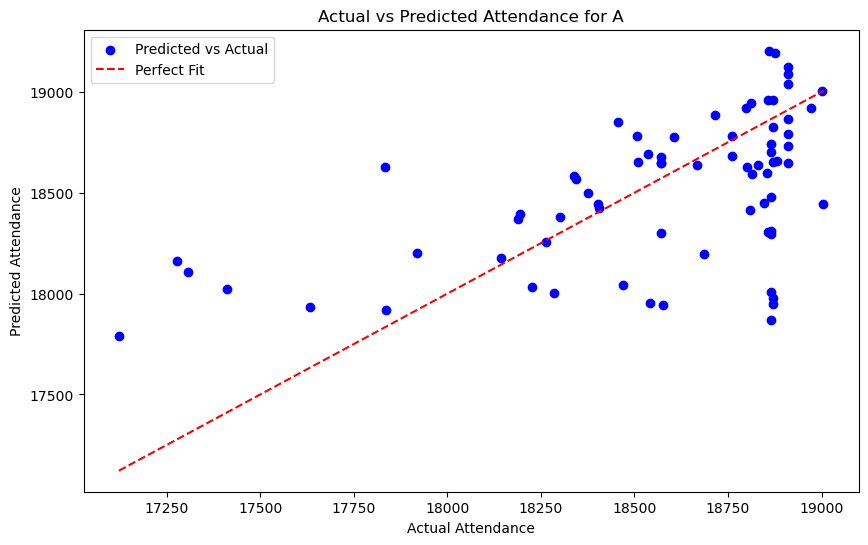

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.357
Method:                 Least Squares   F-statistic:                     4.591
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.22e-15
Time:                        12:50:39   Log-Likelihood:                 702.16
No. Observations:                 286   AIC:                            -1314.
Df Residuals:                     241   BIC:                            -1150.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

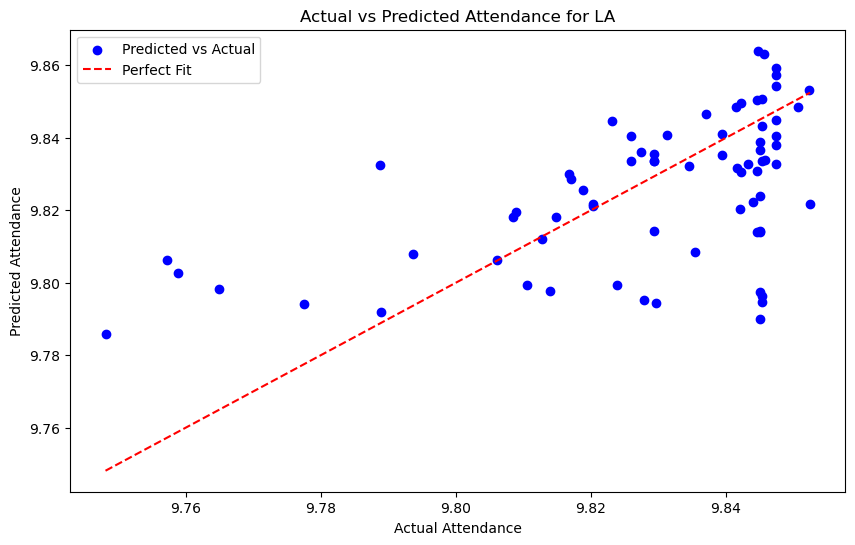

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.364
Method:                 Least Squares   F-statistic:                     4.714
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.24e-15
Time:                        12:50:39   Log-Likelihood:                 719.17
No. Observations:                 286   AIC:                            -1348.
Df Residuals:                     241   BIC:                            -1184.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

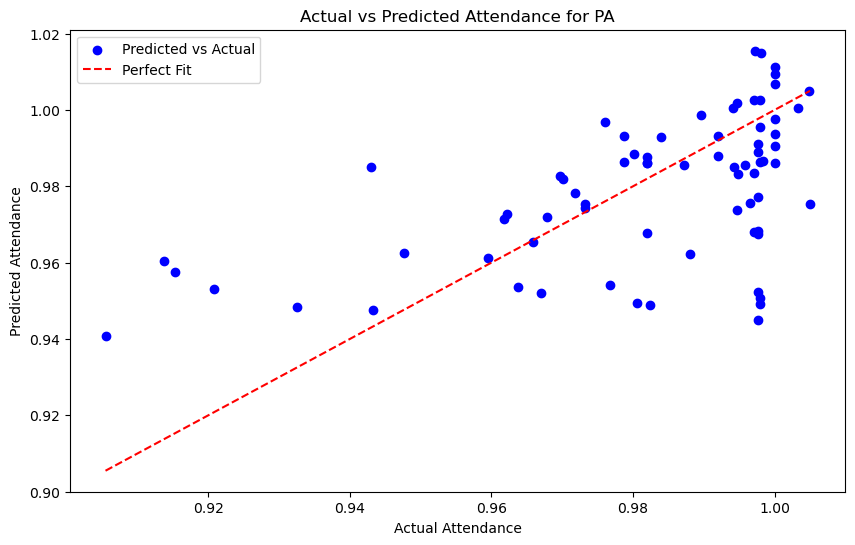

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.357
Method:                 Least Squares   F-statistic:                     4.591
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.22e-15
Time:                        12:50:39   Log-Likelihood:                 702.16
No. Observations:                 286   AIC:                            -1314.
Df Residuals:                     241   BIC:                            -1150.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

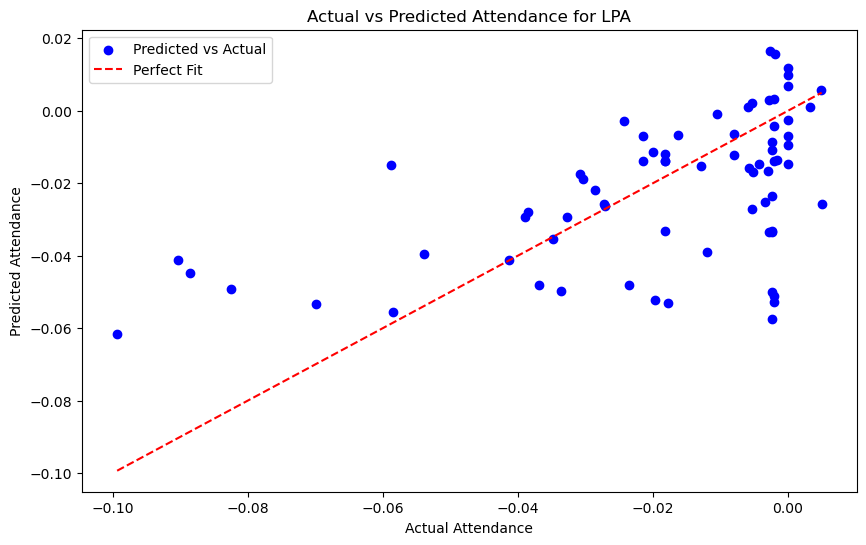

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.357
Method:                 Least Squares   F-statistic:                     4.591
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           7.22e-15
Time:                        12:50:40   Log-Likelihood:                 1356.3
No. Observations:                 286   AIC:                            -2623.
Df Residuals:                     241   BIC:                            -2458.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

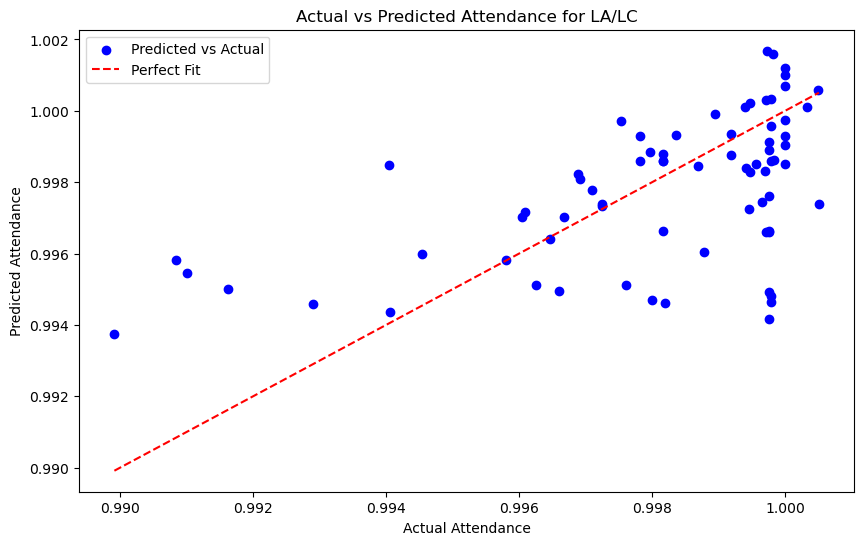


Running OLS for Calgary Flames
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.729
Method:                 Least Squares   F-statistic:                     18.20
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.45e-54
Time:                        12:50:40   Log-Likelihood:                -2165.2
No. Observations:                 283   AIC:                             4420.
Df Residuals:                     238   BIC:                             4584.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|  

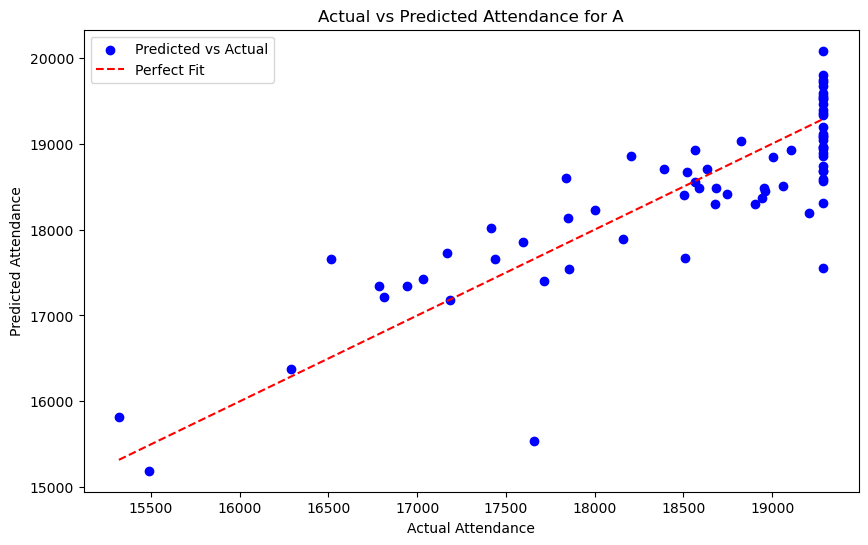

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     18.52
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.21e-55
Time:                        12:50:40   Log-Likelihood:                 604.04
No. Observations:                 283   AIC:                            -1118.
Df Residuals:                     238   BIC:                            -954.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

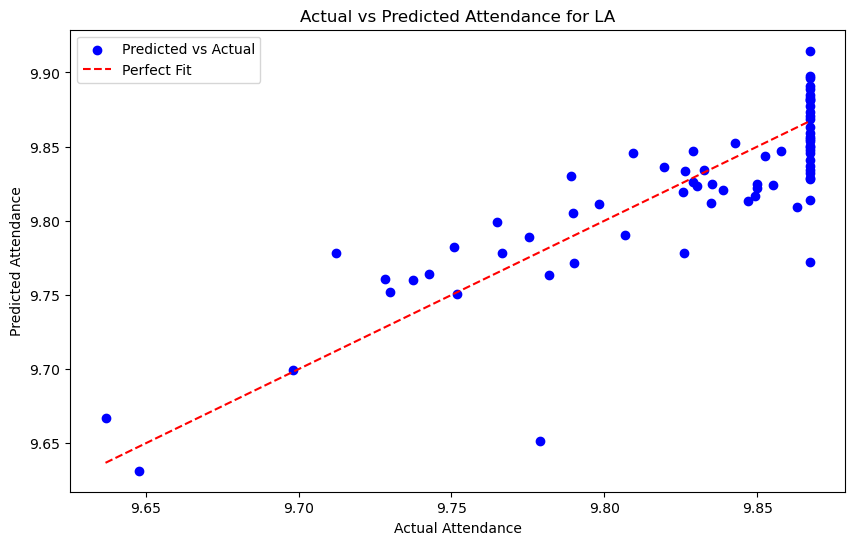

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.729
Method:                 Least Squares   F-statistic:                     18.20
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.45e-54
Time:                        12:50:40   Log-Likelihood:                 627.28
No. Observations:                 283   AIC:                            -1165.
Df Residuals:                     238   BIC:                            -1001.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

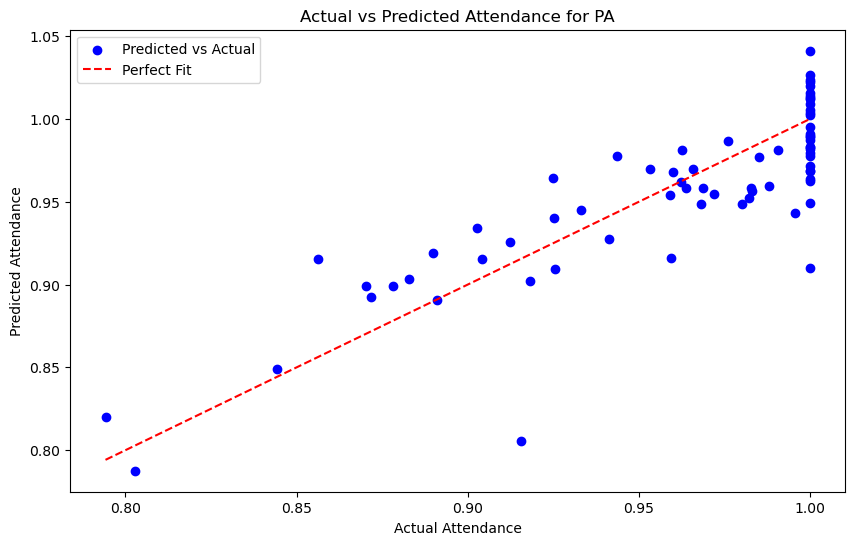

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     18.52
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.21e-55
Time:                        12:50:40   Log-Likelihood:                 604.04
No. Observations:                 283   AIC:                            -1118.
Df Residuals:                     238   BIC:                            -954.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

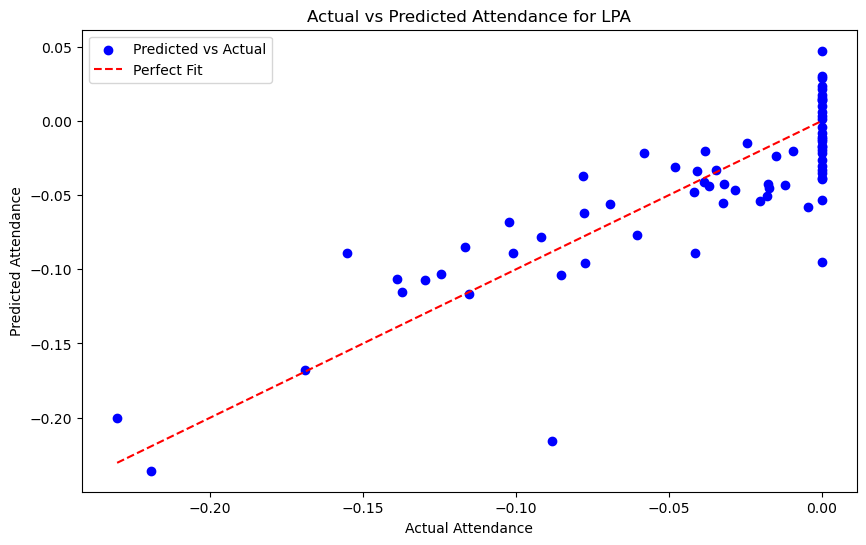

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     18.52
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.21e-55
Time:                        12:50:40   Log-Likelihood:                 1251.9
No. Observations:                 283   AIC:                            -2414.
Df Residuals:                     238   BIC:                            -2250.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

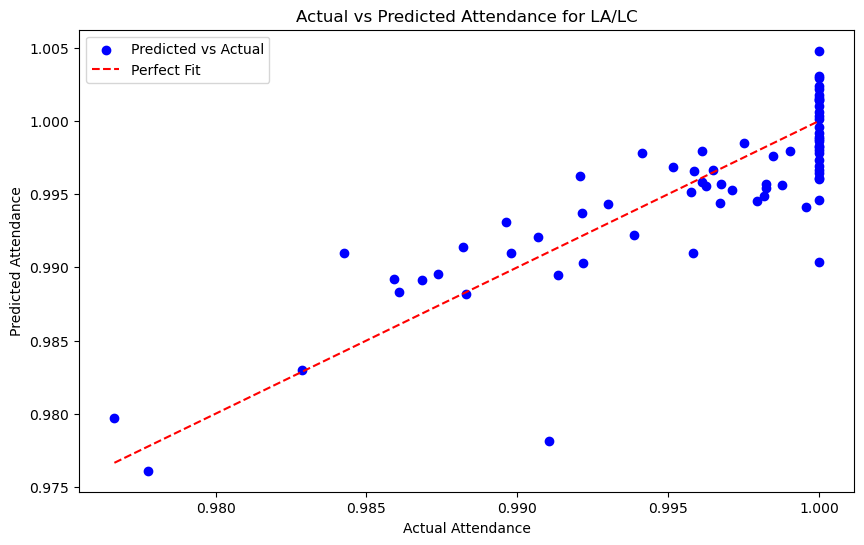


Running OLS for Los Angeles Kings
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.749
Model:                            OLS   Adj. R-squared:                  0.704
Method:                 Least Squares   F-statistic:                     16.67
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.39e-52
Time:                        12:50:41   Log-Likelihood:                -2305.0
No. Observations:                 291   AIC:                             4700.
Df Residuals:                     246   BIC:                             4865.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t

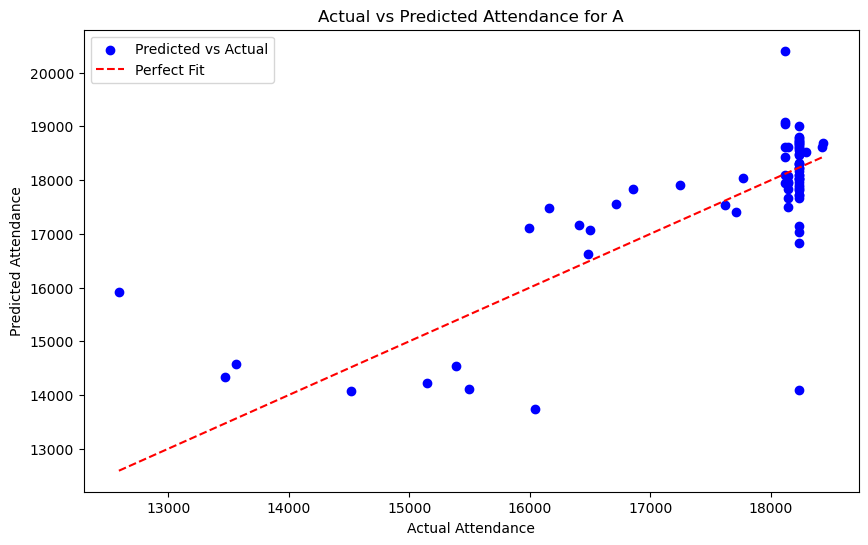

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.693
Method:                 Least Squares   F-statistic:                     15.87
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.33e-50
Time:                        12:50:41   Log-Likelihood:                 500.64
No. Observations:                 291   AIC:                            -911.3
Df Residuals:                     246   BIC:                            -746.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

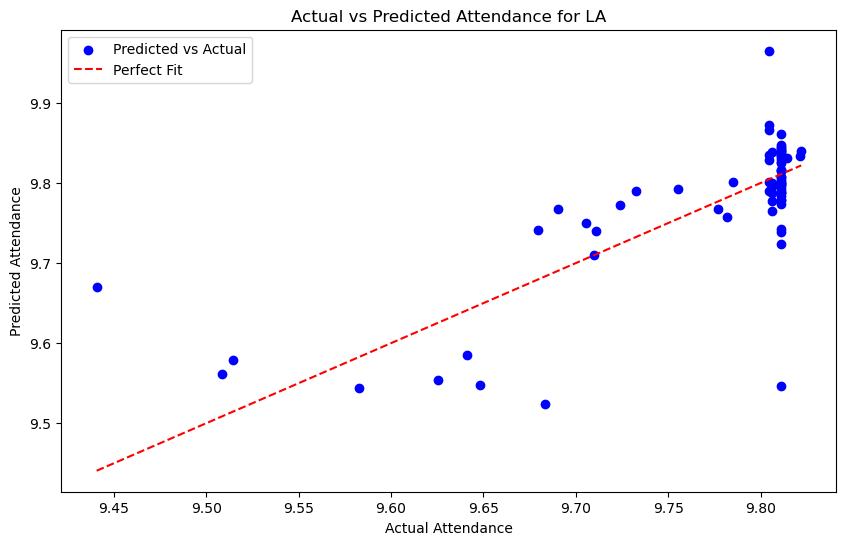

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.749
Model:                            OLS   Adj. R-squared:                  0.704
Method:                 Least Squares   F-statistic:                     16.67
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.39e-52
Time:                        12:50:41   Log-Likelihood:                 549.94
No. Observations:                 291   AIC:                            -1010.
Df Residuals:                     246   BIC:                            -844.6
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

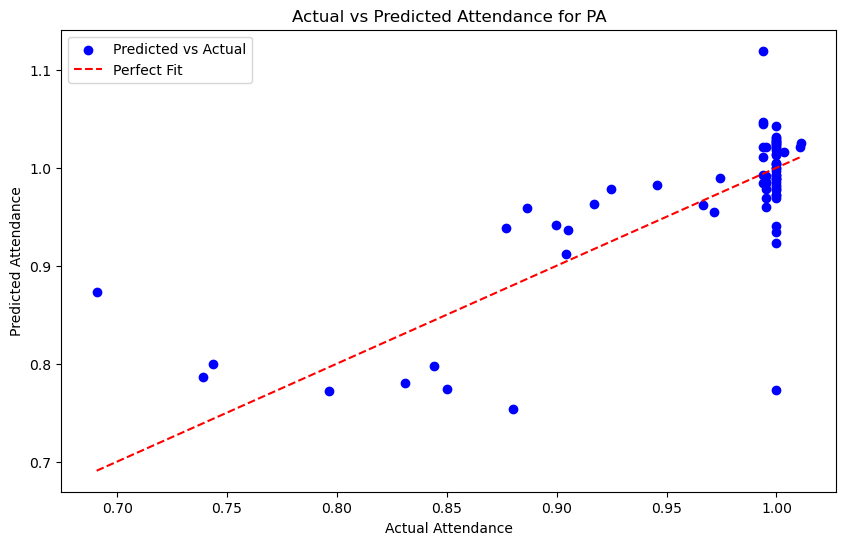

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.693
Method:                 Least Squares   F-statistic:                     15.87
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.33e-50
Time:                        12:50:41   Log-Likelihood:                 500.64
No. Observations:                 291   AIC:                            -911.3
Df Residuals:                     246   BIC:                            -746.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

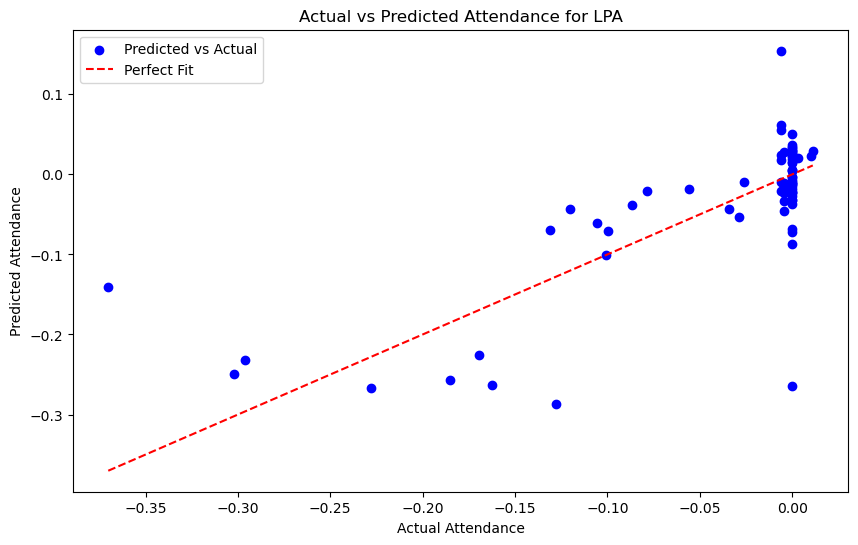

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.693
Method:                 Least Squares   F-statistic:                     15.87
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.33e-50
Time:                        12:50:41   Log-Likelihood:                 1165.1
No. Observations:                 291   AIC:                            -2240.
Df Residuals:                     246   BIC:                            -2075.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

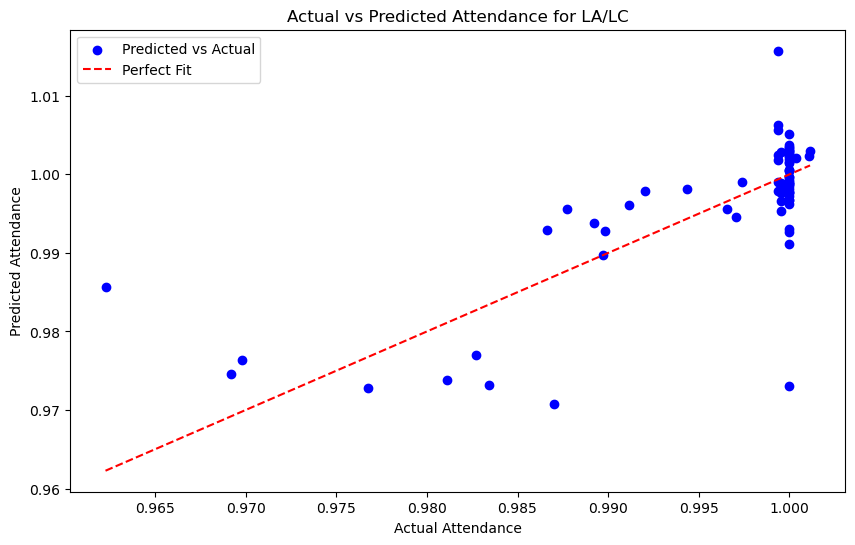


Running OLS for Nashville Predators
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.517
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     5.990
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.29e-20
Time:                        12:50:41   Log-Likelihood:                -2084.0
No. Observations:                 291   AIC:                             4258.
Df Residuals:                     246   BIC:                             4423.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>

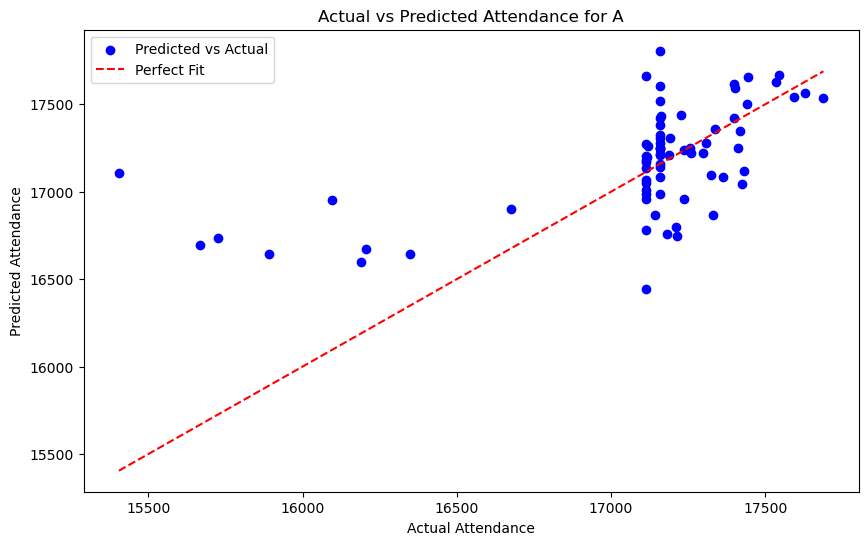

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     5.828
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.58e-20
Time:                        12:50:41   Log-Likelihood:                 742.28
No. Observations:                 291   AIC:                            -1395.
Df Residuals:                     246   BIC:                            -1229.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

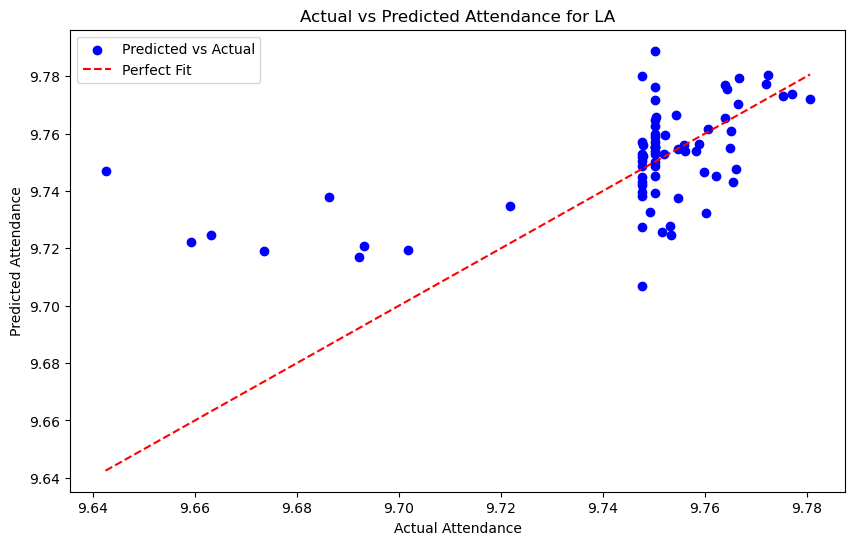

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.517
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     5.990
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.29e-20
Time:                        12:50:42   Log-Likelihood:                 753.31
No. Observations:                 291   AIC:                            -1417.
Df Residuals:                     246   BIC:                            -1251.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

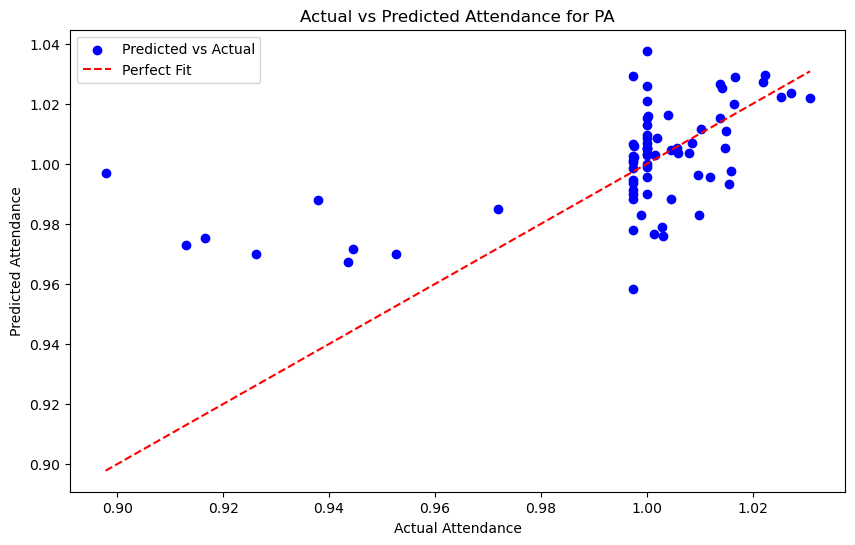

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     5.828
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.58e-20
Time:                        12:50:42   Log-Likelihood:                 742.28
No. Observations:                 291   AIC:                            -1395.
Df Residuals:                     246   BIC:                            -1229.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

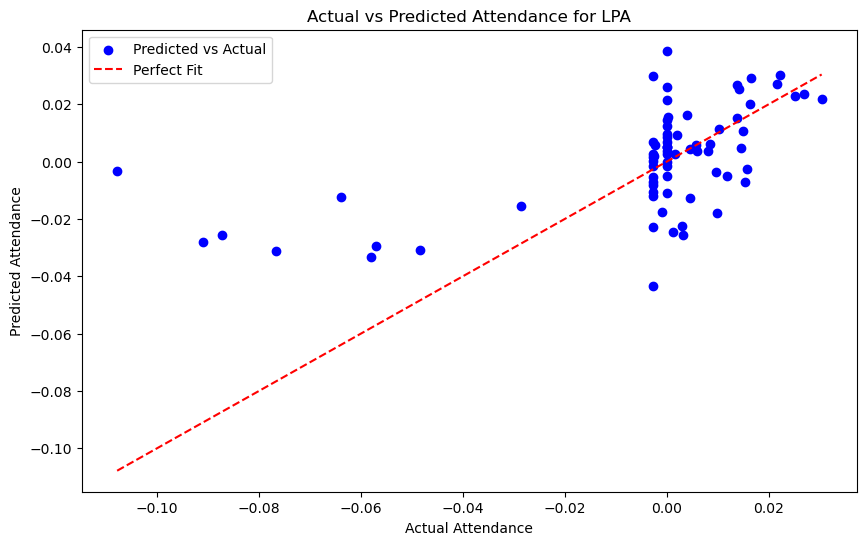

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     5.828
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.58e-20
Time:                        12:50:42   Log-Likelihood:                 1405.0
No. Observations:                 291   AIC:                            -2720.
Df Residuals:                     246   BIC:                            -2555.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

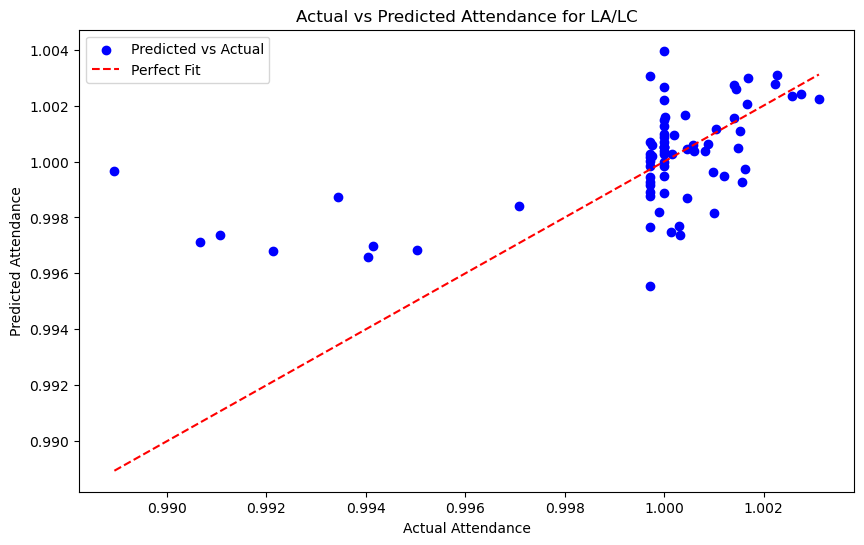


Running OLS for Anaheim Ducks
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.610
Method:                 Least Squares   F-statistic:                     11.33
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.26e-38
Time:                        12:50:42   Log-Likelihood:                -2397.6
No. Observations:                 292   AIC:                             4885.
Df Residuals:                     247   BIC:                             5051.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|   

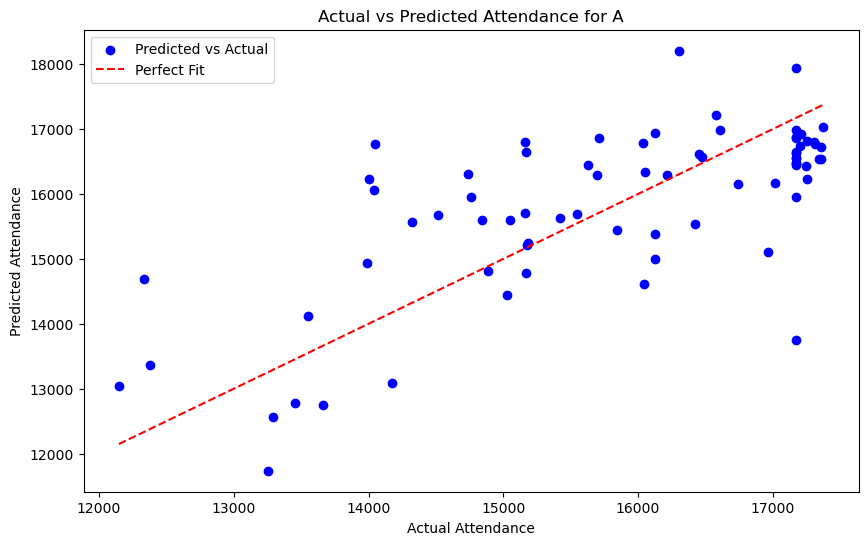

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     12.09
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           8.65e-41
Time:                        12:50:42   Log-Likelihood:                 411.77
No. Observations:                 292   AIC:                            -733.5
Df Residuals:                     247   BIC:                            -568.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

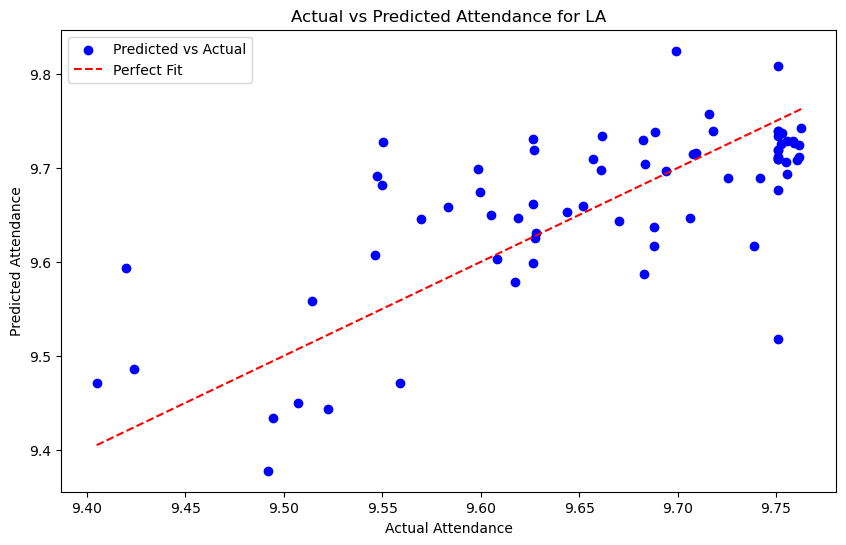

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.610
Method:                 Least Squares   F-statistic:                     11.33
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.26e-38
Time:                        12:50:42   Log-Likelihood:                 449.74
No. Observations:                 292   AIC:                            -809.5
Df Residuals:                     247   BIC:                            -644.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

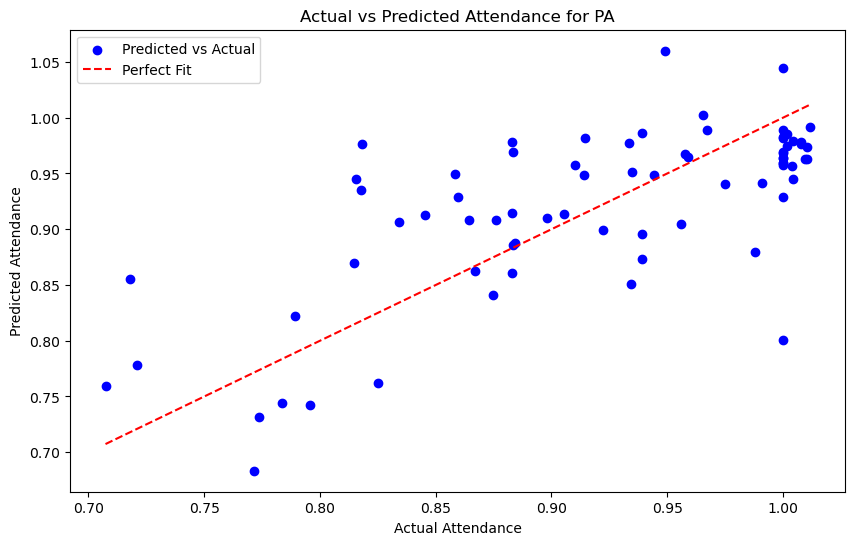

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     12.09
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           8.65e-41
Time:                        12:50:43   Log-Likelihood:                 411.77
No. Observations:                 292   AIC:                            -733.5
Df Residuals:                     247   BIC:                            -568.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

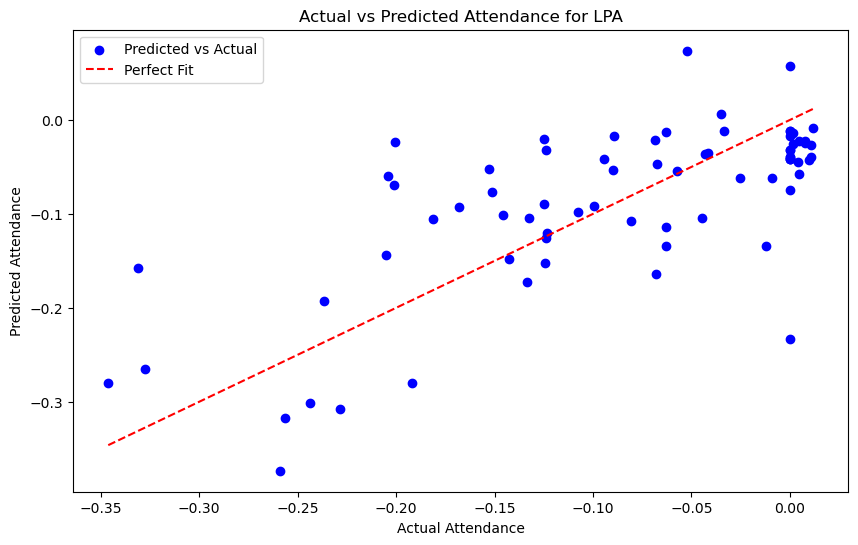

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     12.09
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           8.65e-41
Time:                        12:50:43   Log-Likelihood:                 1076.8
No. Observations:                 292   AIC:                            -2064.
Df Residuals:                     247   BIC:                            -1898.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

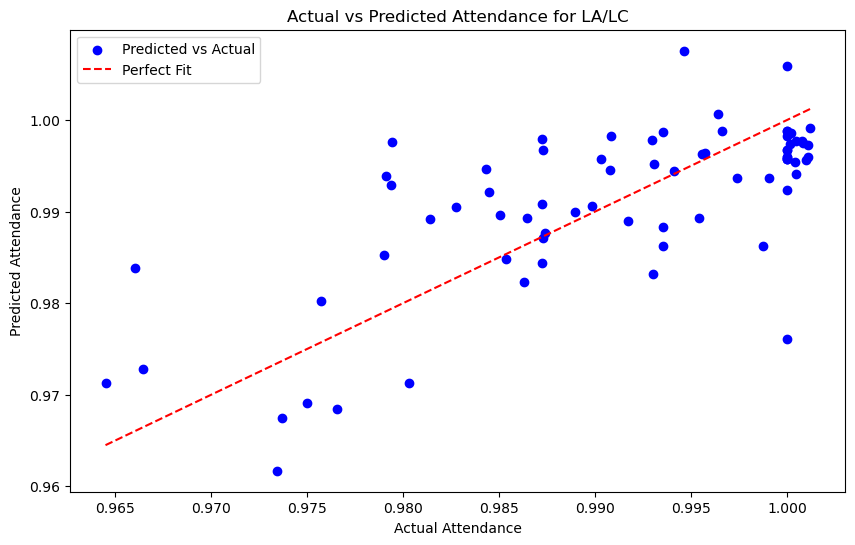


Running OLS for Florida Panthers
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.535
Model:                            OLS   Adj. R-squared:                  0.445
Method:                 Least Squares   F-statistic:                     5.978
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.82e-20
Time:                        12:50:43   Log-Likelihood:                -2443.2
No. Observations:                 274   AIC:                             4976.
Df Residuals:                     229   BIC:                             5139.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|

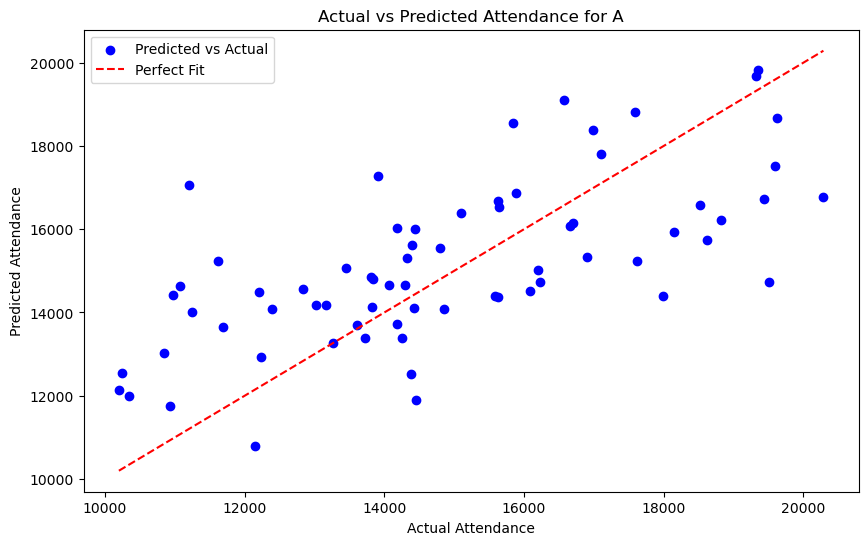

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.516
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     5.539
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.24e-18
Time:                        12:50:43   Log-Likelihood:                 181.56
No. Observations:                 274   AIC:                            -273.1
Df Residuals:                     229   BIC:                            -110.5
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

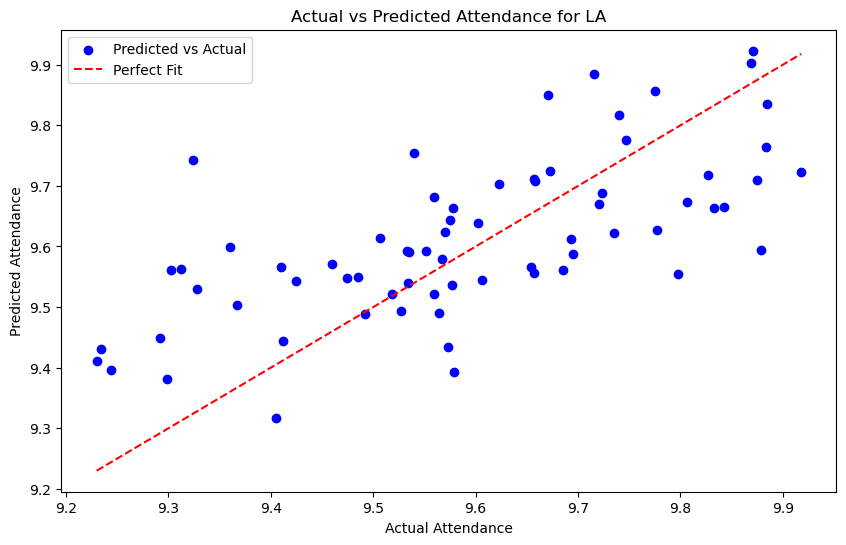

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.535
Model:                            OLS   Adj. R-squared:                  0.445
Method:                 Least Squares   F-statistic:                     5.978
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.82e-20
Time:                        12:50:43   Log-Likelihood:                 259.85
No. Observations:                 274   AIC:                            -429.7
Df Residuals:                     229   BIC:                            -267.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

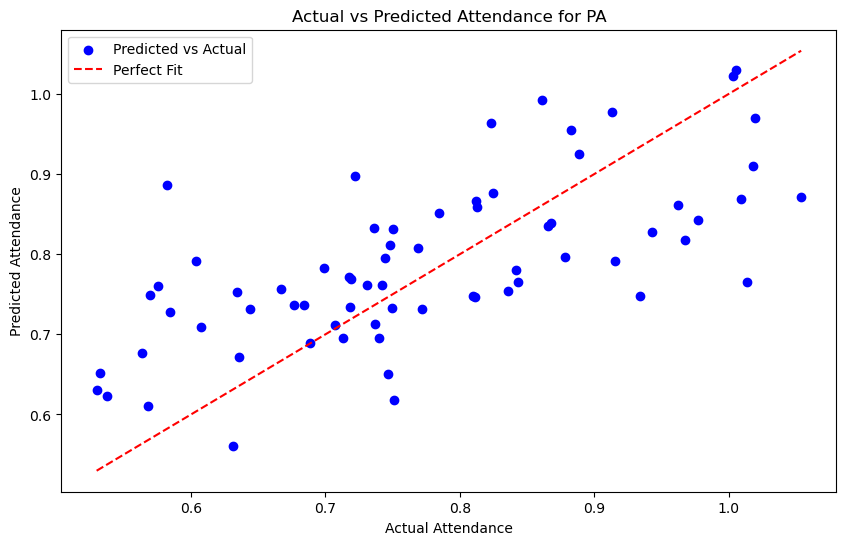

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.516
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     5.539
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.24e-18
Time:                        12:50:43   Log-Likelihood:                 181.56
No. Observations:                 274   AIC:                            -273.1
Df Residuals:                     229   BIC:                            -110.5
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

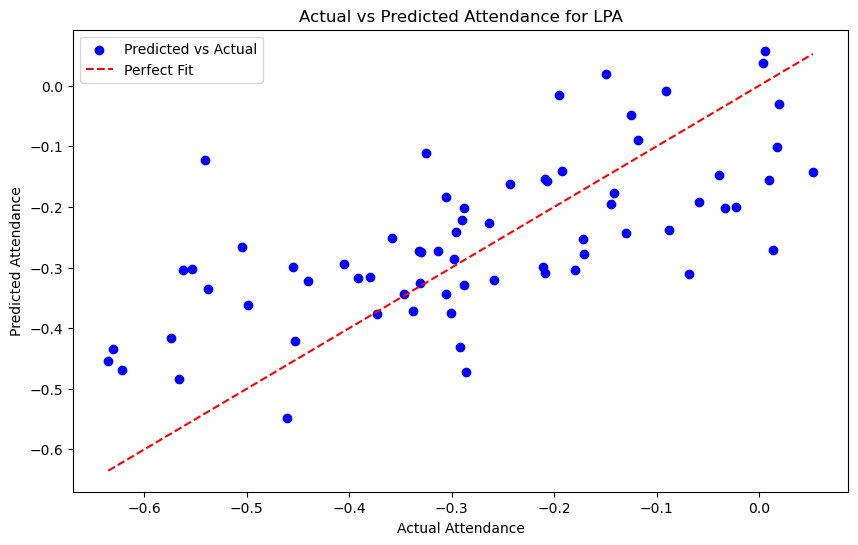

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.516
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     5.539
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           2.24e-18
Time:                        12:50:44   Log-Likelihood:                 808.75
No. Observations:                 274   AIC:                            -1527.
Df Residuals:                     229   BIC:                            -1365.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

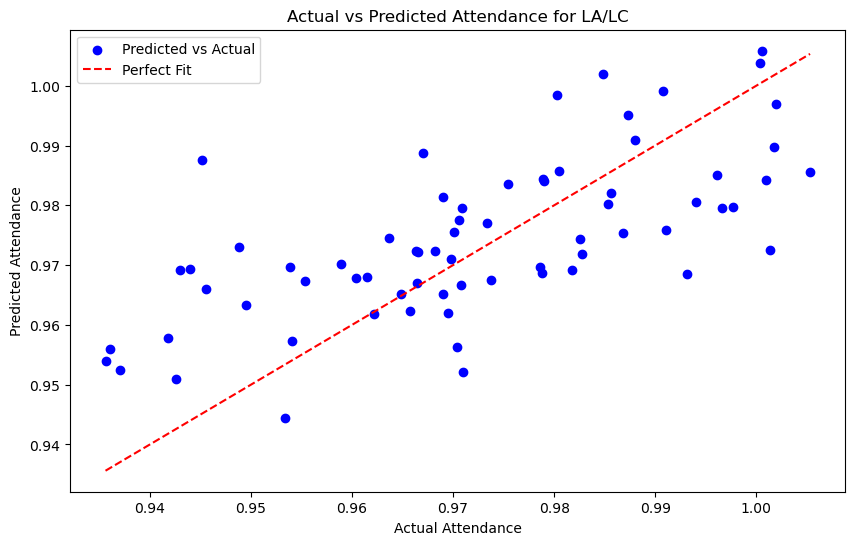


Running OLS for Ottawa Senators
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.672
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     10.73
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           9.81e-36
Time:                        12:50:44   Log-Likelihood:                -2380.2
No. Observations:                 276   AIC:                             4850.
Df Residuals:                     231   BIC:                             5013.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t| 

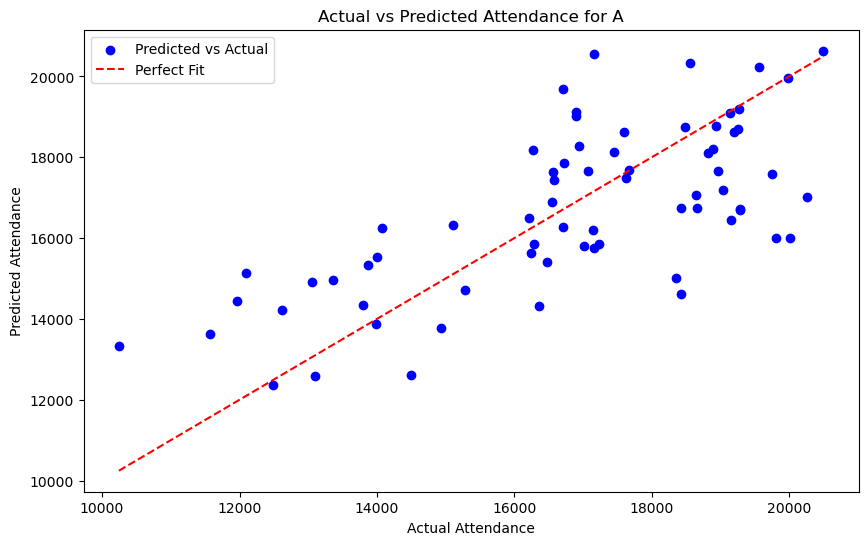

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.674
Model:                            OLS   Adj. R-squared:                  0.612
Method:                 Least Squares   F-statistic:                     10.84
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.90e-36
Time:                        12:50:44   Log-Likelihood:                 285.85
No. Observations:                 276   AIC:                            -481.7
Df Residuals:                     231   BIC:                            -318.8
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

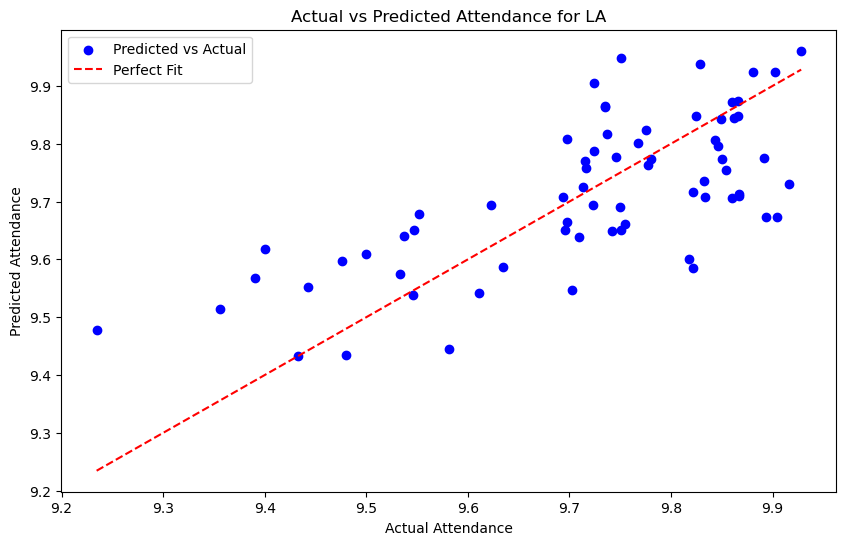

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.672
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     10.73
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           9.81e-36
Time:                        12:50:44   Log-Likelihood:                 344.01
No. Observations:                 276   AIC:                            -598.0
Df Residuals:                     231   BIC:                            -435.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

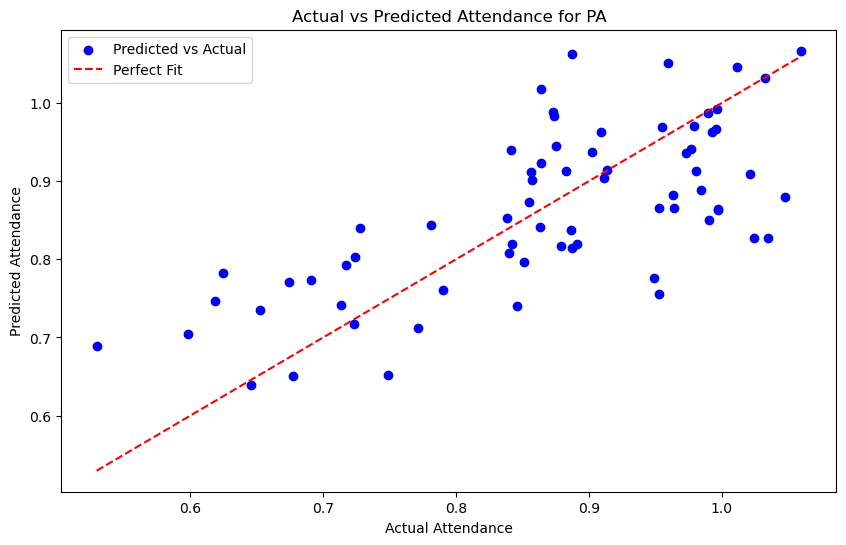

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.674
Model:                            OLS   Adj. R-squared:                  0.612
Method:                 Least Squares   F-statistic:                     10.84
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.90e-36
Time:                        12:50:44   Log-Likelihood:                 285.85
No. Observations:                 276   AIC:                            -481.7
Df Residuals:                     231   BIC:                            -318.8
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

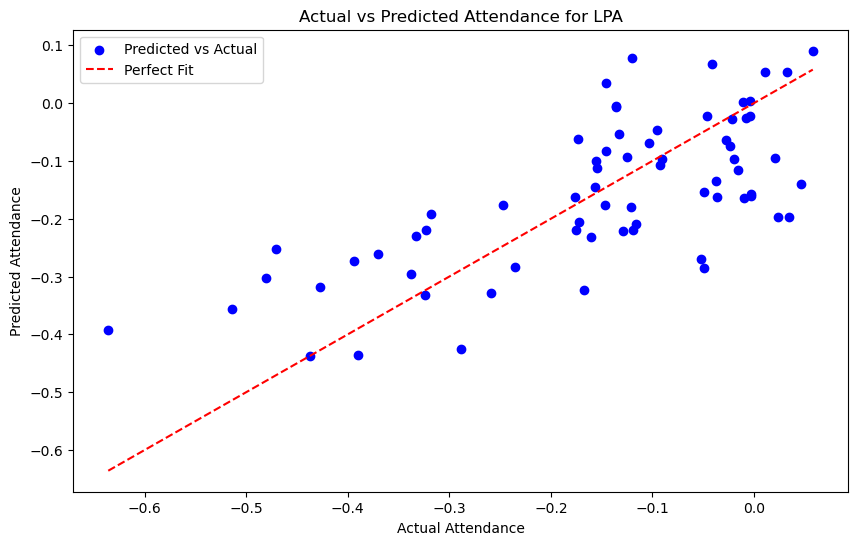

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.674
Model:                            OLS   Adj. R-squared:                  0.612
Method:                 Least Squares   F-statistic:                     10.84
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.90e-36
Time:                        12:50:45   Log-Likelihood:                 917.76
No. Observations:                 276   AIC:                            -1746.
Df Residuals:                     231   BIC:                            -1583.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

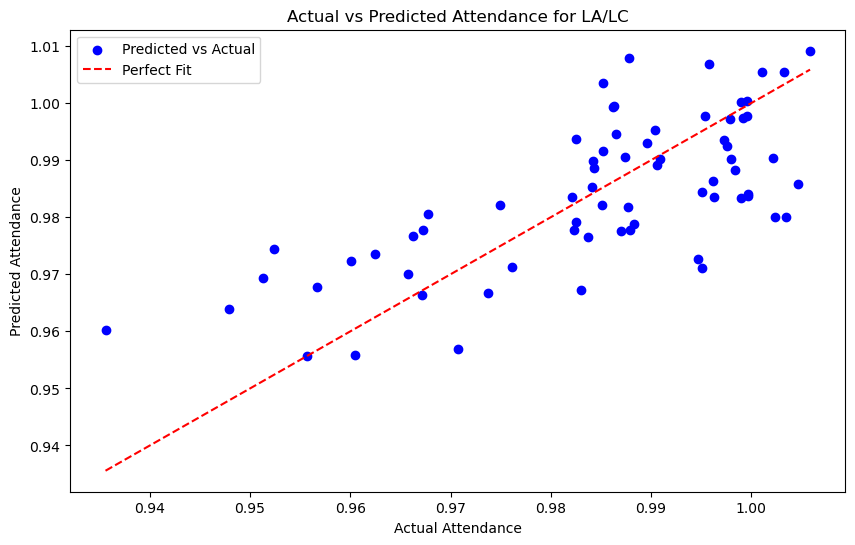


Running OLS for New York Rangers
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.487
Method:                 Least Squares   F-statistic:                     7.295
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.38e-25
Time:                        12:50:45   Log-Likelihood:                -2160.5
No. Observations:                 293   AIC:                             4411.
Df Residuals:                     248   BIC:                             4577.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|

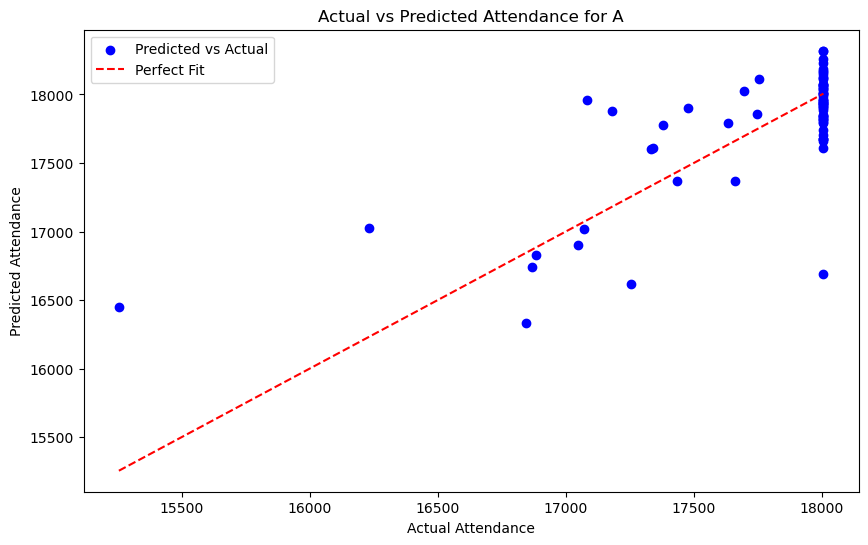

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     6.877
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.73e-24
Time:                        12:50:45   Log-Likelihood:                 683.32
No. Observations:                 293   AIC:                            -1277.
Df Residuals:                     248   BIC:                            -1111.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

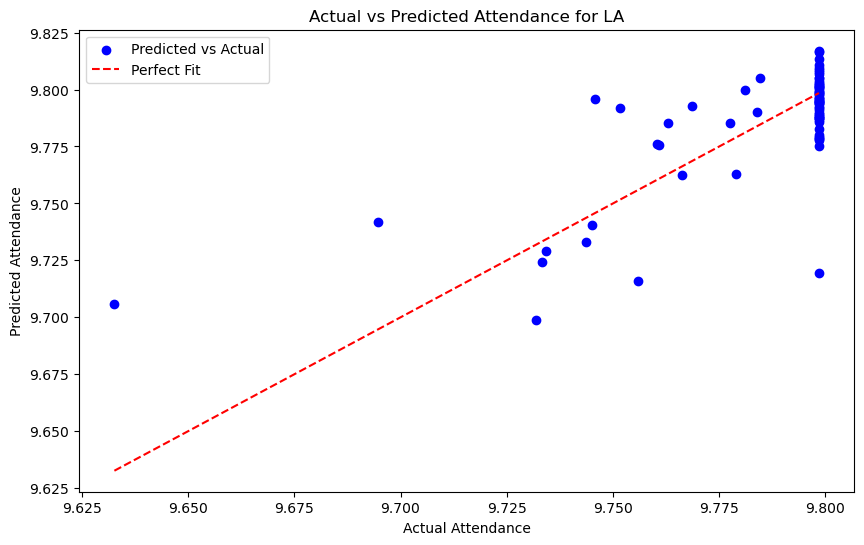

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.487
Method:                 Least Squares   F-statistic:                     7.295
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.38e-25
Time:                        12:50:45   Log-Likelihood:                 710.48
No. Observations:                 293   AIC:                            -1331.
Df Residuals:                     248   BIC:                            -1165.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

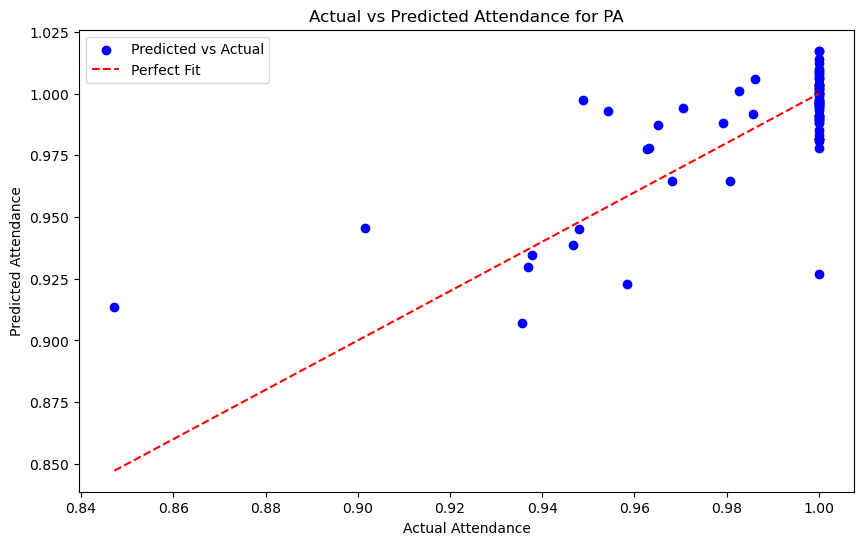

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     6.877
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.73e-24
Time:                        12:50:45   Log-Likelihood:                 683.32
No. Observations:                 293   AIC:                            -1277.
Df Residuals:                     248   BIC:                            -1111.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

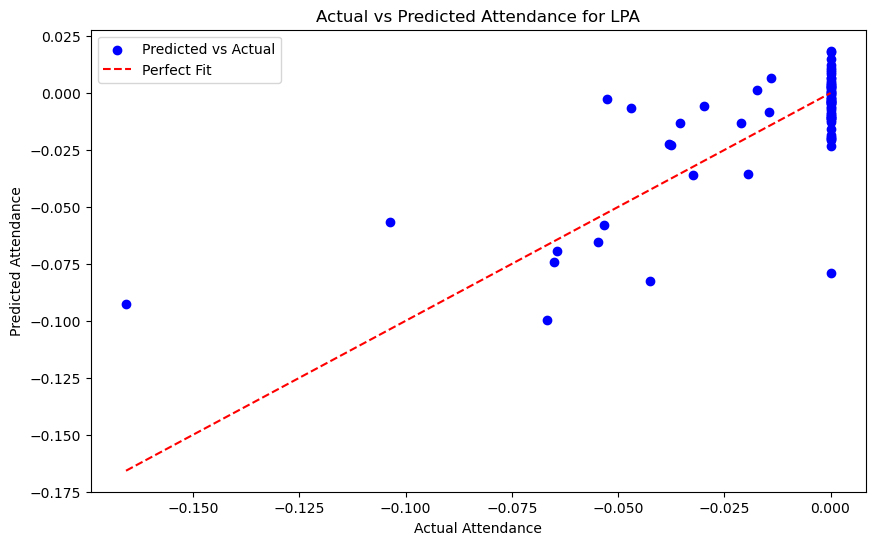

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     6.877
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.73e-24
Time:                        12:50:45   Log-Likelihood:                 1352.0
No. Observations:                 293   AIC:                            -2614.
Df Residuals:                     248   BIC:                            -2448.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

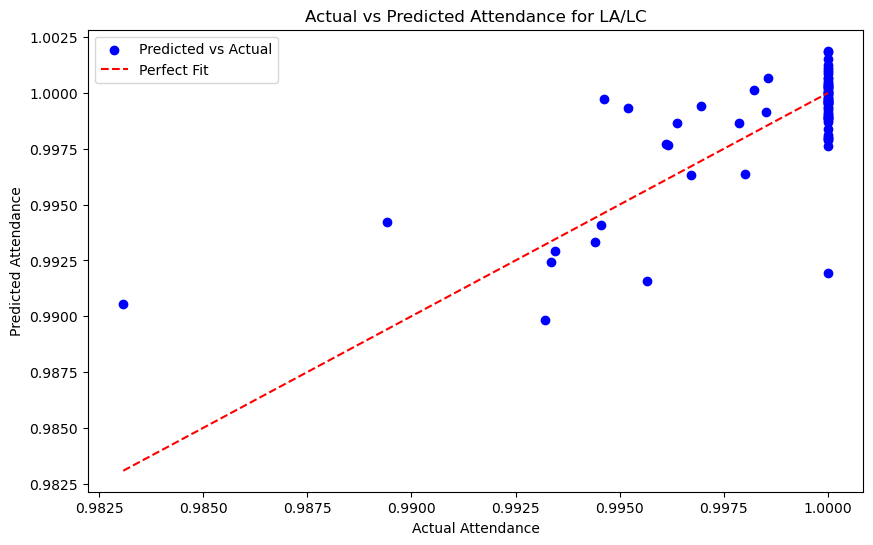


Running OLS for Arizona Coyotes
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.413
Model:                            OLS   Adj. R-squared:                  0.245
Method:                 Least Squares   F-statistic:                     2.458
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.95e-05
Time:                        12:50:46   Log-Likelihood:                -1613.4
No. Observations:                 185   AIC:                             3311.
Df Residuals:                     143   BIC:                             3446.
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t| 

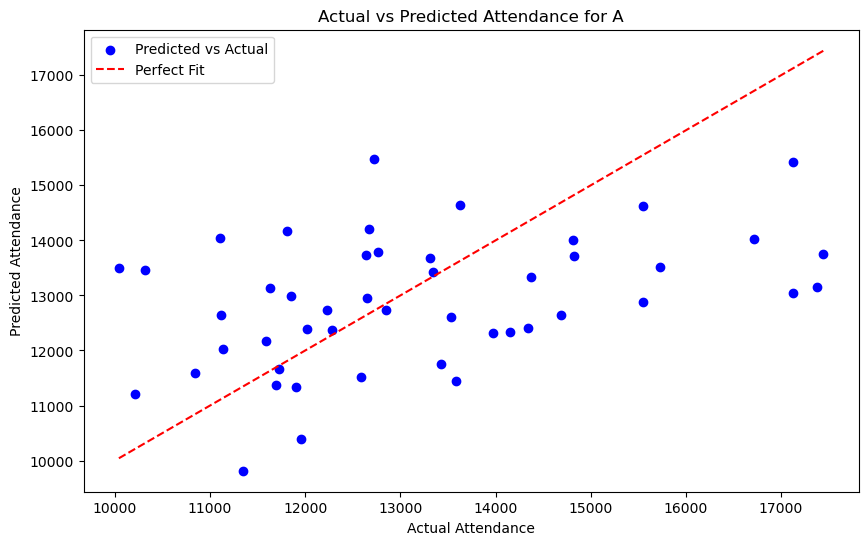

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.418
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     2.502
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.54e-05
Time:                        12:50:46   Log-Likelihood:                 147.15
No. Observations:                 185   AIC:                            -210.3
Df Residuals:                     143   BIC:                            -75.05
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

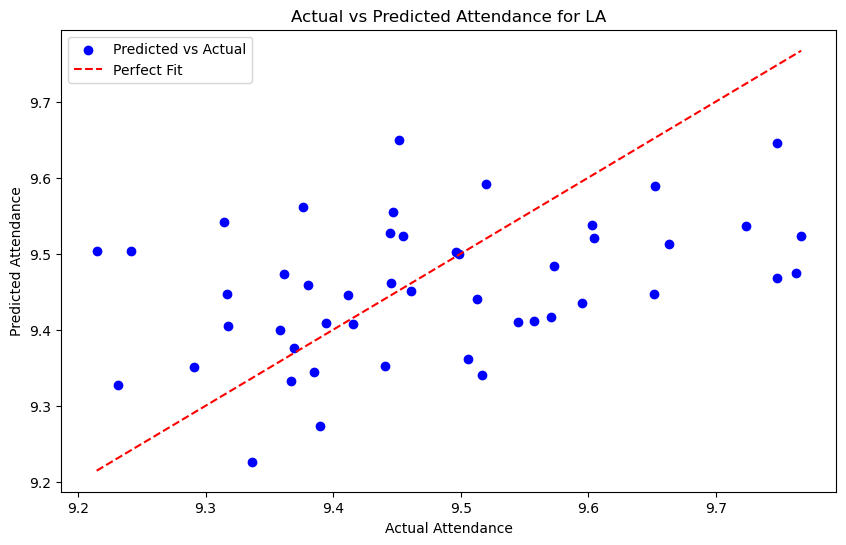

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.413
Model:                            OLS   Adj. R-squared:                  0.245
Method:                 Least Squares   F-statistic:                     2.458
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           4.95e-05
Time:                        12:50:46   Log-Likelihood:                 190.00
No. Observations:                 185   AIC:                            -296.0
Df Residuals:                     143   BIC:                            -160.7
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

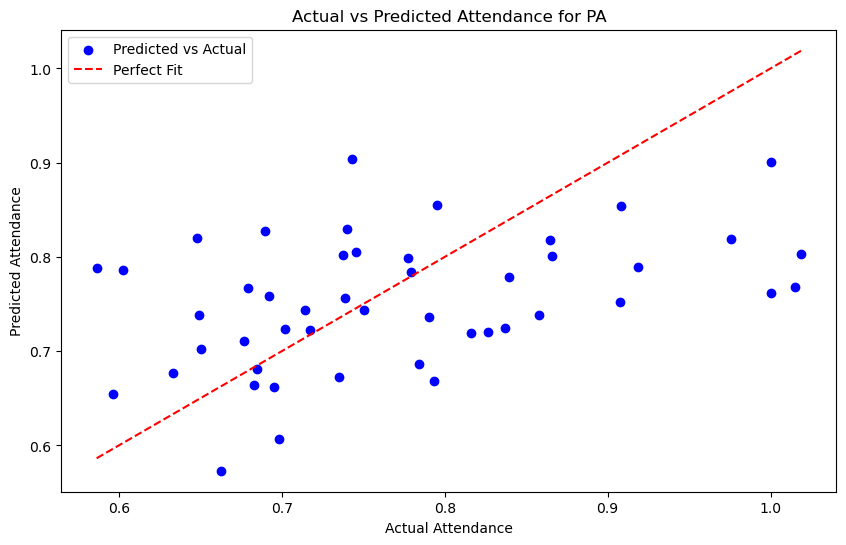

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.418
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     2.502
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.54e-05
Time:                        12:50:46   Log-Likelihood:                 147.15
No. Observations:                 185   AIC:                            -210.3
Df Residuals:                     143   BIC:                            -75.05
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

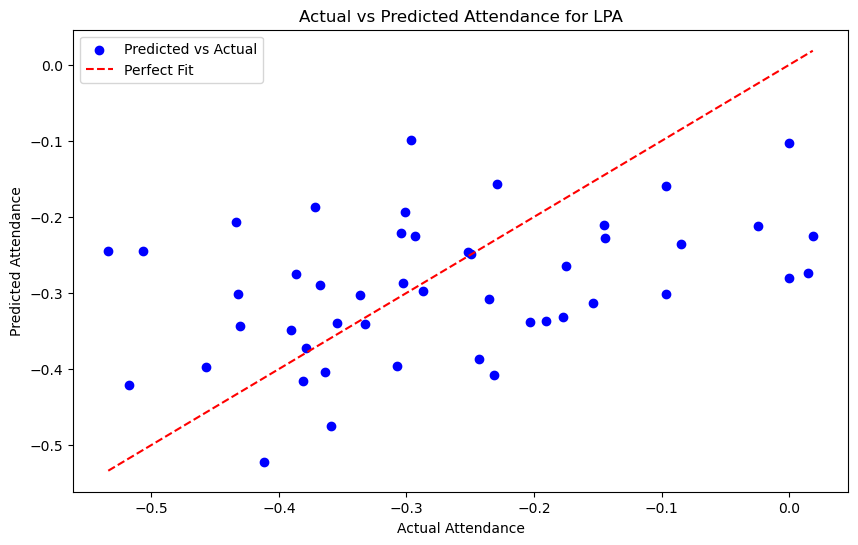

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.418
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     2.502
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           3.54e-05
Time:                        12:50:46   Log-Likelihood:                 568.41
No. Observations:                 185   AIC:                            -1053.
Df Residuals:                     143   BIC:                            -917.6
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

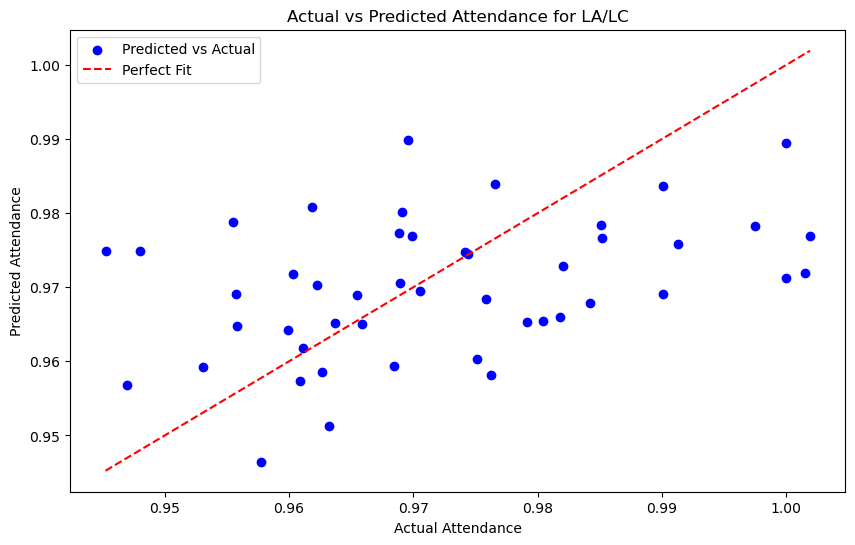


Running OLS for Vegas Golden Knights
------------------------------------------------------------
------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.342
Method:                 Least Squares   F-statistic:                     2.706
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.65e-05
Time:                        12:50:47   Log-Likelihood:                -843.82
No. Observations:                 129   AIC:                             1768.
Df Residuals:                      89   BIC:                             1882.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P

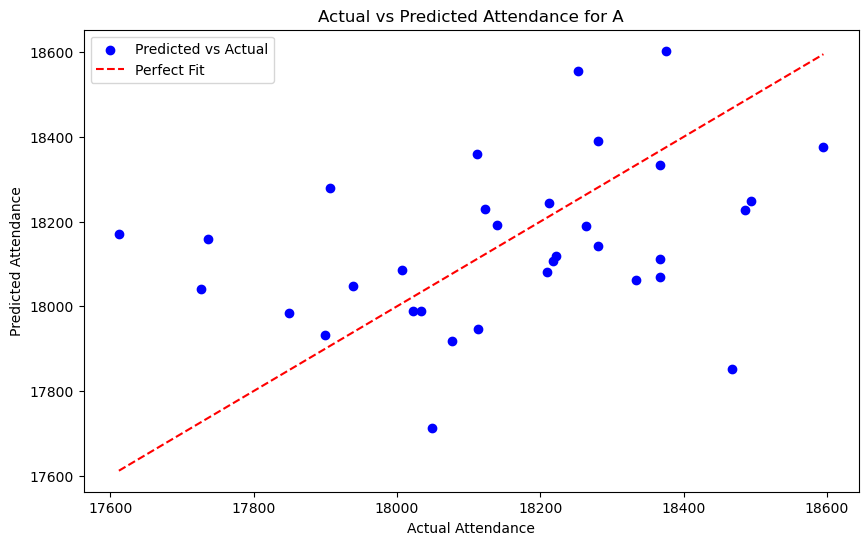

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     LA   R-squared:                       0.542
Model:                            OLS   Adj. R-squared:                  0.341
Method:                 Least Squares   F-statistic:                     2.700
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.85e-05
Time:                        12:50:47   Log-Likelihood:                 420.69
No. Observations:                 129   AIC:                            -761.4
Df Residuals:                      89   BIC:                            -647.0
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

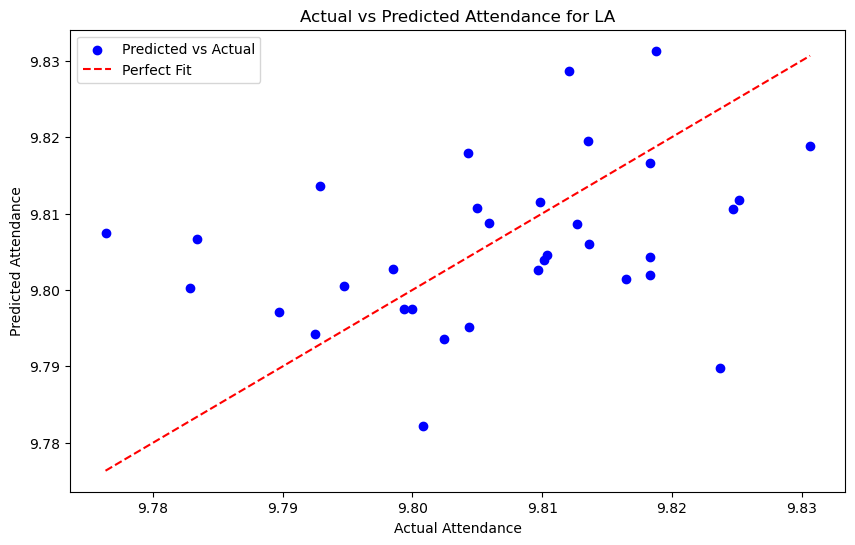

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                     PA   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.342
Method:                 Least Squares   F-statistic:                     2.706
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.65e-05
Time:                        12:50:47   Log-Likelihood:                 415.52
No. Observations:                 129   AIC:                            -751.0
Df Residuals:                      89   BIC:                            -636.7
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

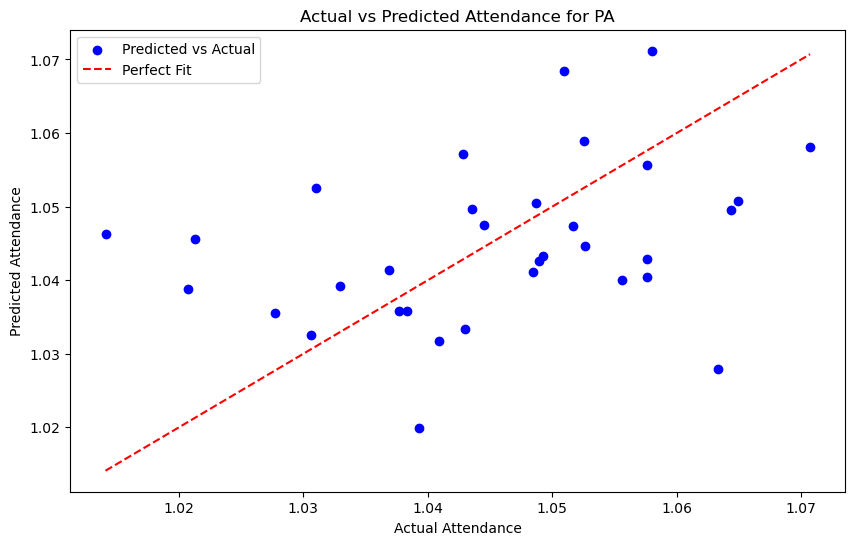

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                    LPA   R-squared:                       0.542
Model:                            OLS   Adj. R-squared:                  0.341
Method:                 Least Squares   F-statistic:                     2.700
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.85e-05
Time:                        12:50:47   Log-Likelihood:                 420.69
No. Observations:                 129   AIC:                            -761.4
Df Residuals:                      89   BIC:                            -647.0
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

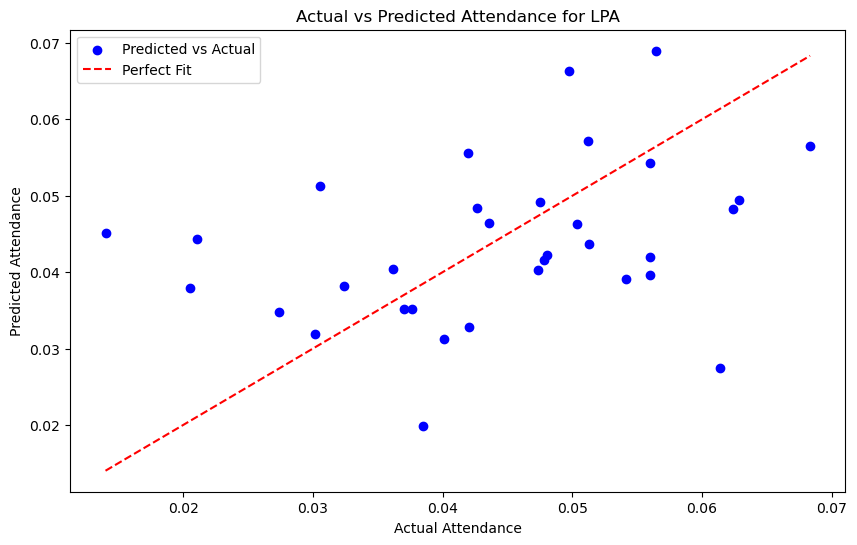

------------------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:                  LA/LC   R-squared:                       0.542
Model:                            OLS   Adj. R-squared:                  0.341
Method:                 Least Squares   F-statistic:                     2.700
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           5.85e-05
Time:                        12:50:47   Log-Likelihood:                 714.62
No. Observations:                 129   AIC:                            -1349.
Df Residuals:                      89   BIC:                            -1235.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

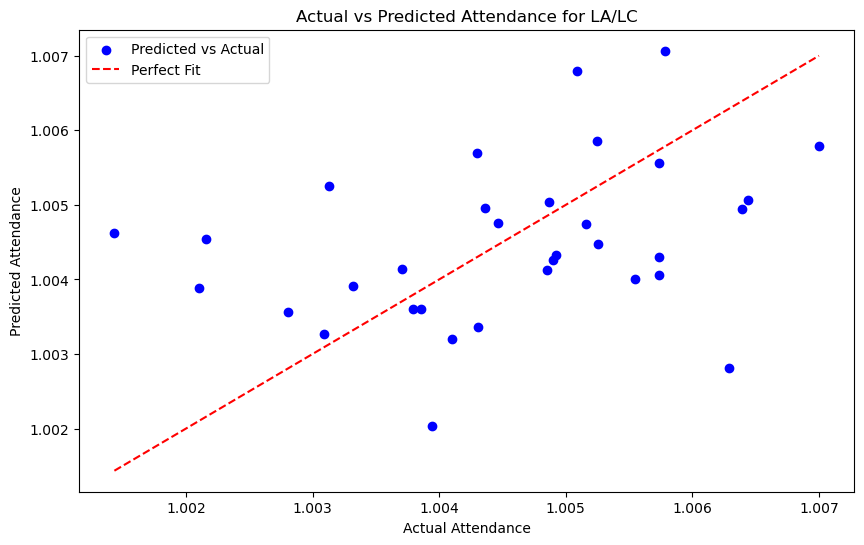

In [45]:
## PER HOME TEAM

# run a linear regression with literally just all the variables lol
# define features (X) and target (y) with all columns except 'A' (attendance)

# Loop over each home team
home_teams = df_att_remove['H'].unique()

for home_team in home_teams:
    print(f'\nRunning OLS for {home_team}')
    print('-' * 60)
    
    # Filter data for the current home team
    df_team = df_att[df_att['H'] == home_team]

    for dep in dependent_vars:
        X = df_team.drop(columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
        y = df_team[dep]
    
        # split the data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rand_seed)
    
        # fit the OLS model on the training data
        model = sm.OLS(y_train, sm.add_constant(X_train)).fit()  # Add constant for intercept
    
        # print model summary
        print('-' * 60)
        print(model.summary())
    
        y_pred = model.predict(sm.add_constant(X_test))
    
        # Calculate MSE for test set
        mse_test = mean_squared_error(y_test, y_pred)
        print(f'\nMean Squared Error (MSE) for Test Set: {mse_test}\n')
        
        # variables with p < 0.05
        significant_vars = model.pvalues[model.pvalues < 0.05].index.tolist()
        print(f"Variables with p-value < 0.05:\n{significant_vars}\n")
    
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
        plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
        plt.xlabel('Actual Attendance')
        plt.ylabel('Predicted Attendance')
        plt.title(f'Actual vs Predicted Attendance for {dep}')
        plt.legend()
        plt.show()

In [60]:
from sklearn.metrics import mean_squared_error, r2_score

# Function to run OLS regression
def run_ols(X_train, X_test, y_train, y_test):
    model = sm.OLS(y_train, sm.add_constant(X_train)).fit()
    y_pred = model.predict(sm.add_constant(X_test))
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mse, r2

# Function to run Ridge regression
def run_ridge(X_train, X_test, y_train, y_test, alpha=1.0):
    model = Ridge(alpha=alpha)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mse, r2

# Function to run Lasso regression
def run_lasso(X_train, X_test, y_train, y_test, alpha=0.1):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    model = Lasso(alpha=alpha)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mse, r2

# Function to run Elastic Net regression
def run_elastic_net(X_train, X_test, y_train, y_test, alpha=0.1, l1_ratio=0.5):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mse, r2

# Loop over each home team
home_teams = df_att_remove['H'].unique()

for home_team in home_teams:
    print(f'\nRunning models for {home_team}')
    print('-' * 60)

    # Filter data for the current home team
    df_team = df_att_remove[df_att_remove['H'] == home_team]

    for dep in dependent_vars:
        # Define features (X) and target (y)
        X = df_team.drop(columns=['A', 'LA', 'PA', 'LPA', 'LA/LC', 'H', 'V'])
        y = df_team[dep]

        # Split the data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_seed)

        # Run models
        mse_ols, r2_ols = run_ols(X_train, X_test, y_train, y_test)
        mse_ridge, r2_ridge = run_ridge(X_train, X_test, y_train, y_test)
        mse_lasso, r2_lasso = run_lasso(X_train, X_test, y_train, y_test)
        mse_elastic_net, r2_elastic_net = run_elastic_net(X_train, X_test, y_train, y_test)

        # Print results
        print(f'MSE (OLS) for {home_team}: {mse_ols:.4f}, R²: {r2_ols:.4f}')
        print(f'MSE (Ridge) for {home_team}: {mse_ridge:.4f}, R²: {r2_ridge:.4f}')
        print(f'MSE (Lasso) for {home_team}: {mse_lasso:.4f}, R²: {r2_lasso:.4f}')
        print(f'MSE (Elastic Net) for {home_team}: {mse_elastic_net:.4f}, R²: {r2_elastic_net:.4f}')



Running models for Chicago Blackhawks
------------------------------------------------------------
MSE (OLS) for Chicago Blackhawks: 1582863.3124, R²: 0.6140
MSE (Ridge) for Chicago Blackhawks: 1563379.3372, R²: 0.6187
MSE (Lasso) for Chicago Blackhawks: 1584255.6330, R²: 0.6137
MSE (Elastic Net) for Chicago Blackhawks: 1480532.8523, R²: 0.6390

Running models for Edmonton Oilers
------------------------------------------------------------
MSE (OLS) for Edmonton Oilers: 183710.7389, R²: 0.7424
MSE (Ridge) for Edmonton Oilers: 212064.7270, R²: 0.7026
MSE (Lasso) for Edmonton Oilers: 190434.4389, R²: 0.7329
MSE (Elastic Net) for Edmonton Oilers: 215109.3320, R²: 0.6983

Running models for Montreal Canadiens
------------------------------------------------------------


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.806e+07, tolerance: 1.078e+05
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.847e+07, tolerance: 1.078e+05
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.743e+07, toler

MSE (OLS) for Montreal Canadiens: 286650.6508, R²: -3.7108
MSE (Ridge) for Montreal Canadiens: 225432.6017, R²: -2.7047
MSE (Lasso) for Montreal Canadiens: 272088.6464, R²: -3.4715
MSE (Elastic Net) for Montreal Canadiens: 202562.2324, R²: -2.3289

Running models for Colorado Avalanche
------------------------------------------------------------
MSE (OLS) for Colorado Avalanche: 1537766.8800, R²: 0.5171
MSE (Ridge) for Colorado Avalanche: 1547036.1090, R²: 0.5142
MSE (Lasso) for Colorado Avalanche: 1572571.1299, R²: 0.5062
MSE (Elastic Net) for Colorado Avalanche: 1542010.0643, R²: 0.5158

Running models for Detroit Red Wings
------------------------------------------------------------
MSE (OLS) for Detroit Red Wings: 1098194.5256, R²: 0.5856
MSE (Ridge) for Detroit Red Wings: 1034485.8098, R²: 0.6097
MSE (Lasso) for Detroit Red Wings: 1083166.4758, R²: 0.5913
MSE (Elastic Net) for Detroit Red Wings: 1007564.7434, R²: 0.6198

Running models for Philadelphia Flyers
---------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.529e+08, tolerance: 8.674e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.232e+07, tolerance: 8.674e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.592e+07, toler

MSE (OLS) for Philadelphia Flyers: 1253227.5015, R²: 0.3352
MSE (Ridge) for Philadelphia Flyers: 1262250.7763, R²: 0.3304
MSE (Lasso) for Philadelphia Flyers: 1257173.1933, R²: 0.3331
MSE (Elastic Net) for Philadelphia Flyers: 1227825.4921, R²: 0.3487

Running models for Dallas Stars
------------------------------------------------------------
MSE (OLS) for Dallas Stars: 1962636.2621, R²: 0.2871
MSE (Ridge) for Dallas Stars: 1894120.8187, R²: 0.3120
MSE (Lasso) for Dallas Stars: 1946696.0548, R²: 0.2929
MSE (Elastic Net) for Dallas Stars: 1765967.1871, R²: 0.3585

Running models for Minnesota Wild
------------------------------------------------------------
MSE (OLS) for Minnesota Wild: 255756.4579, R²: 0.3808
MSE (Ridge) for Minnesota Wild: 250017.8901, R²: 0.3947
MSE (Lasso) for Minnesota Wild: 250370.3780, R²: 0.3938
MSE (Elastic Net) for Minnesota Wild: 245019.4317, R²: 0.4068

Running models for Phoenix Coyotes
------------------------------------------------------------
MSE (OLS)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.705e+07, tolerance: 3.809e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.366e+06, tolerance: 1.127e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.514e+06, toler

MSE (OLS) for Pittsburgh Penguins: 114122.9228, R²: 0.5383
MSE (Ridge) for Pittsburgh Penguins: 111692.5503, R²: 0.5481
MSE (Lasso) for Pittsburgh Penguins: 112555.9537, R²: 0.5446
MSE (Elastic Net) for Pittsburgh Penguins: 104308.1972, R²: 0.5780

Running models for San Jose Sharks
------------------------------------------------------------
MSE (OLS) for San Jose Sharks: 2391522.9567, R²: 0.6159
MSE (Ridge) for San Jose Sharks: 2276520.8645, R²: 0.6344
MSE (Lasso) for San Jose Sharks: 2366318.5730, R²: 0.6200
MSE (Elastic Net) for San Jose Sharks: 2270262.9636, R²: 0.6354

Running models for St. Louis Blues
------------------------------------------------------------
MSE (OLS) for St. Louis Blues: 966580.1754, R²: 0.2373
MSE (Ridge) for St. Louis Blues: 962535.8058, R²: 0.2405
MSE (Lasso) for St. Louis Blues: 974600.3635, R²: 0.2310
MSE (Elastic Net) for St. Louis Blues: 950729.2826, R²: 0.2498

Running models for Washington Capitals
--------------------------------------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.686e+08, tolerance: 1.697e+05
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.964e+07, tolerance: 1.697e+05
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.825e+07, toler

MSE (OLS) for Washington Capitals: 95245.3083, R²: 0.0475
MSE (Ridge) for Washington Capitals: 92895.0583, R²: 0.0710
MSE (Lasso) for Washington Capitals: 95750.5468, R²: 0.0425
MSE (Elastic Net) for Washington Capitals: 91201.6588, R²: 0.0879

Running models for Buffalo Sabres
------------------------------------------------------------
MSE (OLS) for Buffalo Sabres: 1816144.4480, R²: 0.6380
MSE (Ridge) for Buffalo Sabres: 1651401.8237, R²: 0.6709
MSE (Lasso) for Buffalo Sabres: 1735360.8829, R²: 0.6541
MSE (Elastic Net) for Buffalo Sabres: 1587201.4941, R²: 0.6837

Running models for Carolina Hurricanes
------------------------------------------------------------
MSE (OLS) for Carolina Hurricanes: 2026295.2061, R²: 0.7321
MSE (Ridge) for Carolina Hurricanes: 1798388.6468, R²: 0.7622
MSE (Lasso) for Carolina Hurricanes: 1842094.7458, R²: 0.7564
MSE (Elastic Net) for Carolina Hurricanes: 1814014.8222, R²: 0.7602

Running models for Columbus Blue Jackets
---------------------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.847e+08, tolerance: 9.649e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.731e+06, tolerance: 9.649e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.524e+08, toler

MSE (OLS) for Columbus Blue Jackets: 3996361.8906, R²: 0.1668
MSE (Ridge) for Columbus Blue Jackets: 4003885.9665, R²: 0.1652
MSE (Lasso) for Columbus Blue Jackets: 3933528.8050, R²: 0.1799
MSE (Elastic Net) for Columbus Blue Jackets: 3778539.5387, R²: 0.2122

Running models for New Jersey Devils
------------------------------------------------------------
MSE (OLS) for New Jersey Devils: 2444882.9006, R²: 0.4431
MSE (Ridge) for New Jersey Devils: 2465474.5837, R²: 0.4384
MSE (Lasso) for New Jersey Devils: 2431519.3350, R²: 0.4462
MSE (Elastic Net) for New Jersey Devils: 2534307.4039, R²: 0.4228

Running models for Winnipeg Jets
------------------------------------------------------------
MSE (OLS) for Winnipeg Jets: 271103.2408, R²: 0.5599
MSE (Ridge) for Winnipeg Jets: 266134.2293, R²: 0.5679
MSE (Lasso) for Winnipeg Jets: 272979.5729, R²: 0.5568
MSE (Elastic Net) for Winnipeg Jets: 257357.3579, R²: 0.5822

Running models for New York Islanders
---------------------------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.705e+08, tolerance: 7.708e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.900e+06, tolerance: 7.708e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.311e+07, toler

MSE (OLS) for Toronto Maple Leafs: 96001.3375, R²: 0.4820
MSE (Ridge) for Toronto Maple Leafs: 96905.0754, R²: 0.4771
MSE (Lasso) for Toronto Maple Leafs: 98176.5519, R²: 0.4703
MSE (Elastic Net) for Toronto Maple Leafs: 93600.5163, R²: 0.4950

Running models for Vancouver Canucks
------------------------------------------------------------
MSE (OLS) for Vancouver Canucks: 150822.9361, R²: 0.2022
MSE (Ridge) for Vancouver Canucks: 149687.6768, R²: 0.2082
MSE (Lasso) for Vancouver Canucks: 150038.6154, R²: 0.2063
MSE (Elastic Net) for Vancouver Canucks: 144647.6688, R²: 0.2348

Running models for Calgary Flames
------------------------------------------------------------
MSE (OLS) for Calgary Flames: 305208.0229, R²: 0.6869
MSE (Ridge) for Calgary Flames: 280121.0919, R²: 0.7126
MSE (Lasso) for Calgary Flames: 297373.5401, R²: 0.6949
MSE (Elastic Net) for Calgary Flames: 243505.9316, R²: 0.7502

Running models for Los Angeles Kings
-------------------------------------------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.021e+06, tolerance: 5.147e+04
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.997e+06, tolerance: 5.864e+03
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.252e+06, toler

MSE (OLS) for Los Angeles Kings: 863828.5953, R²: 0.4578
MSE (Ridge) for Los Angeles Kings: 793928.1659, R²: 0.5017
MSE (Lasso) for Los Angeles Kings: 842258.9016, R²: 0.4713
MSE (Elastic Net) for Los Angeles Kings: 579643.6506, R²: 0.6362

Running models for Nashville Predators
------------------------------------------------------------
MSE (OLS) for Nashville Predators: 142957.1554, R²: 0.2727
MSE (Ridge) for Nashville Predators: 142323.3760, R²: 0.2759
MSE (Lasso) for Nashville Predators: 144049.2178, R²: 0.2671
MSE (Elastic Net) for Nashville Predators: 138046.9422, R²: 0.2977

Running models for Anaheim Ducks
------------------------------------------------------------
MSE (OLS) for Anaheim Ducks: 1126390.7561, R²: 0.4445
MSE (Ridge) for Anaheim Ducks: 1106147.4382, R²: 0.4545
MSE (Lasso) for Anaheim Ducks: 1127266.6844, R²: 0.4441
MSE (Elastic Net) for Anaheim Ducks: 1060578.5412, R²: 0.4770

Running models for Florida Panthers
---------------------------------------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.399e+08, tolerance: 1.522e+05
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.385e+08, tolerance: 1.522e+05
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.296e+07, toler

MSE (OLS) for Vegas Golden Knights: 61074.8122, R²: -0.1233
MSE (Ridge) for Vegas Golden Knights: 63170.4007, R²: -0.1618
MSE (Lasso) for Vegas Golden Knights: 62275.8476, R²: -0.1454
MSE (Elastic Net) for Vegas Golden Knights: 60163.4411, R²: -0.1065
